# Setup

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\numpy\_distributor_init.py:32: UserWarning: loaded more than 1 DLL from .libs:
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\numpy\.libs\libopenblas.2V74HQ3MKNZHDCKJELIPPY7V6QMK3UOZ.gfortran-win32.dll
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\numpy\.libs\libopenblas.JKAMQ5EVHIVCPXP2XZJB2RQPIN47S32M.gfortran-win32.dll
  stacklevel=1)


In [2]:
def calculate_change(column):
    i = 0
    j = 1
    end = []
    while j < len(column):
        try:
            end.append((column[j] - column[i]) / column[i])
        except:
            end.append(1)
        i += 1
        j += 1
    end.append(0)
    return end

def create_plots(index):
    subdf = pd.DataFrame(df.iloc[:, index])
    subdf['change'] = calculate_change(df.iloc[:, index])
    
    plt.subplot(2, 1, 1)
    plt.plot(np.arange(35, len(subdf)-1), subdf.change[35:-1])
    plt.title("Rate of Change of {} confirmed cases".format(subdf.columns[0]))
#     plt.xlabel("Days since 1/22")
    plt.ylabel("Rate of Daily Change, %")

    plt.grid()
    plt.ylim(-0.05, 1.05)
    
    plt.subplot(2, 1, 2)
    plt.plot(np.arange(0, len(subdf)), subdf.iloc[:, 0])
#     plt.title("Log scale of {} confirmed cases".format(subdf.columns[0]))
    plt.xlabel("Days since 1/22")
    plt.ylabel("Number of Confirmed Cases, {}".format(subdf.columns[0]))

    plt.yscale('log')
    plt.grid()
    plt.xlim(35, 134)
    plt.ylim(1, 200000)

def create_roc_and_new_case_numbers(col, name):
    new = col
    new_df = pd.DataFrame(new)
    new_df['change'] = calculate_change(new)

    plt.plot(np.arange(35, len(new_df)-1), new_df.change[35:-1])
    plt.plot(np.arange(35, len(new_df)-1), [.01]*len(new_df.change[35:-1]), linestyle='dashed')
    plt.title("Rate of Change of {} confirmed cases".format(name))
    plt.xlabel("Days since 1/22")
    plt.ylabel("Rate of Daily Change, %")

    plt.grid()
    # plt.ylim(-0.05, 1.05)
    plt.ylim(-0.005, .15)
    plt.show()
    plt.close()

    new_new_cases = new.values[1:] - new.values[:-1]

    # print(mchenry)
    plt.plot(np.arange(35, len(new_new_cases)), new_new_cases[35:])
    plt.title("{} New Cases, Absolute".format(name))
    plt.grid()
    plt.show()
    plt.close()
    return new_df, new_new_cases

def create_roc_graphs(col, name):
    new = col
    new_df = pd.DataFrame(new)
    new_df['change'] = calculate_change(new)

    plt.plot(np.arange(35, len(new_df)-1), new_df.change[35:-1])
    plt.plot(np.arange(35, len(new_df)-1), [.01]*len(new_df.change[35:-1]), linestyle='dashed')
    plt.title("Rate of Change of {} confirmed cases".format(name))
    plt.xlabel("Days since 1/22")
    plt.ylabel("Rate of Daily Change, %")

    plt.grid()
    # plt.ylim(-0.05, 1.05)
    plt.ylim(-0.005, .15)

def create_new_case_graphs(col, name):
    new = col
    new_new_cases = new.values[1:] - new.values[:-1]

    # print(mchenry)
    plt.plot(np.arange(35, len(new_new_cases)), new_new_cases[35:])
    plt.title("{} New Cases, Absolute".format(name))
    plt.grid()
    
def detect_consecutive_decline(threshold, smooth_factor, data):
    data = data.rolling(smooth_factor).mean()
    data_bool = data[1:].reset_index(drop=True) < data[:-1]
    
    return data_bool.rolling(threshold).sum()
#     return data.reset_index(drop=True)

def detect_consecutive_decline(threshold, smooth_factor, data):
    data = data.rolling(smooth_factor).mean()
    data_bool = data[1:].reset_index(drop=True) < data[:-1].reset_index(drop=True)
    while data_bool.rolling(threshold).sum().max() < threshold:
        threshold -= 1
    return data_bool.rolling(threshold).sum(), threshold
#     return data.reset_index(drop=True)

def aggregate_region(state_list):
    counties_data = []
    for state in state_list:
        for county in state_col[state_col == state].index:
            if type(df[county]) != pd.core.series.Series:
                x = df[county].iloc[:, np.where(state_col[county] == state)[0][0]]
            else:
                x = df[county]
            counties_data.append(x)
    y = pd.concat(counties_data, axis=1)
    return y

def single_state(state):
    counties_data = []
    for county in state_col[state_col == state].index:
        if type(df[county]) != pd.core.series.Series:
            x = df[county].iloc[:, np.where(state_col[county] == state)[0][0]]
        else:
            x = df[county]
        counties_data.append(x)
    y = pd.concat(counties_data, axis=1)
    return y

def create_classes(state_list):
    arbitrary_start = 61
    d_states = {"good": [], "bad": [], "neutral": [], "k_good": [], "k_bad": [], }


    d_ratios = {"neg_diff": [], "pos_diff": [], "neg": [], "pos": [], "neutral_diff": [], "neutral": [], }


    for state in state_list:
        y = single_state(state)
        new_col = [x[1].sum() for x in y.iterrows()]
        df['{}_agg'.format(state)] = new_col
        x = create_roc_and_new_case_numbers(df['{}_agg'.format(state)], '{} Agg'.format(state))
        first_pptn = 0.1
        thresh_date = x[0]['{}_agg'.format(state)][x[0]['{}_agg'.format(state)] > x[0]['{}_agg'.format(state)].iloc[-1] * first_pptn].index[0]
        thresh_idx = list(df.index).index(thresh_date)
        mid = thresh_idx + (df.shape[0] - thresh_idx) // 2
        lHalf = x[1][thresh_idx:mid].sum()
        rHalf = x[1][mid:].sum()

        
        if abs(rHalf - lHalf) < x[1][arbitrary_start:].sum() * .05:
            print("{} is neutral".format(state))
            d_states['neutral'].append(state)
            d_ratios['neutral_diff'].append(abs(lHalf - rHalf))
            if lHalf > rHalf:
                d_ratios['neutral'].append(lHalf / rHalf)
            else:
                d_ratios['neutral'].append(rHalf / lHalf.sum())
        elif rHalf > x[1][arbitrary_start:midpoint].sum():
#             if np.percentile(np.array(all_ratios2), 50) < rHalf / lHalf:
            if True:
                print("{} is a mess".format(state))
                d_states['bad'].append(state)
                d_ratios['neg_diff'].append(rHalf - lHalf)
                d_ratios['neg'].append(rHalf / lHalf)
            else:
                print("{} is kinda bad".format(state))
                d_states['k_bad'].append(state)
                d_ratios['neg_diff'].append(rHalf - lHalf)
                d_ratios['neg'].append(rHalf / lHalf)
        else:
#             if np.percentile(np.array(all_ratios2), 50) < lHalf / rHalf:
            if True:
                print("{} is a do-gooder".format(state))
                d_states['good'].append(state)
                d_ratios['pos_diff'].append(lHalf - rHalf)
                d_ratios['pos'].append(lHalf / rHalf)
            else:
                print("{} is kinda good".format(state))
                d_states['k_good'].append(state)
                d_ratios['pos_diff'].append(lHalf - rHalf)
                d_ratios['pos'].append(lHalf / rHalf)
    return d_states, d_ratios

def create_classes2(state_list):
    arbitrary_start = 61
    d_states = {"good": [], "bad": [], "neutral": [], "k_good": [], "k_bad": [], }


    d_ratios = {"neg_diff": [], "pos_diff": [], "neg": [], "pos": [], "neutral_diff": [], "neutral": [], }


    for state in state_list:
        y = single_state(state)
        new_col = [x[1].sum() for x in y.iterrows()]
        df['{}_agg'.format(state)] = new_col
        x = create_roc_and_new_case_numbers(df['{}_agg'.format(state)], '{} Agg'.format(state))
        first_pptn = 0.1
        thresh_date = x[0]['{}_agg'.format(state)][x[0]['{}_agg'.format(state)] > x[0]['{}_agg'.format(state)].iloc[-1] * first_pptn].index[0]
        thresh_idx = list(df.index).index(thresh_date)
        mid = thresh_idx + (df.shape[0] - thresh_idx) // 2
        lHalf = x[1][thresh_idx:mid].sum()
        rHalf = x[1][mid:].sum()

        
        if abs(rHalf - lHalf) < x[1][arbitrary_start:].sum() * .05:
            print("{} is neutral".format(state))
            d_states['neutral'].append(state)
            d_ratios['neutral_diff'].append(abs(lHalf - rHalf))
            if lHalf > rHalf:
                d_ratios['neutral'].append(lHalf / rHalf)
            else:
                d_ratios['neutral'].append(rHalf / lHalf.sum())
        elif rHalf > x[1][arbitrary_start:midpoint].sum():
            if np.percentile(np.array(all_ratios2), 50) < rHalf / lHalf:
    #         if True:
                print("{} is a mess".format(state))
                d_states['bad'].append(state)
                d_ratios['neg_diff'].append(rHalf - lHalf)
                d_ratios['neg'].append(rHalf / lHalf)
            else:
                print("{} is kinda bad".format(state))
                d_states['k_bad'].append(state)
                d_ratios['neg_diff'].append(rHalf - lHalf)
                d_ratios['neg'].append(rHalf / lHalf)
        else:
            if np.percentile(np.array(all_ratios2), 50) < lHalf / rHalf:
    #         if True:
                print("{} is a do-gooder".format(state))
                d_states['good'].append(state)
                d_ratios['pos_diff'].append(lHalf - rHalf)
                d_ratios['pos'].append(lHalf / rHalf)
            else:
                print("{} is kinda good".format(state))
                d_states['k_good'].append(state)
                d_ratios['pos_diff'].append(lHalf - rHalf)
                d_ratios['pos'].append(lHalf / rHalf)
    return d_states, d_ratios

def normalize(data):
    return (data - np.min(data)) / (np.max(data) - np.min(data))

def create_new_case_graphs_colored(col, name, color, smoothing_factor=7):
    new = col
    new_new_cases = new.values[1:] - new.values[:-1]

    # print(mchenry)
#     smoothing_factor = 4
#     plt.plot(np.arange(35, len(new_new_cases)), normalize(pd.Series(new_new_cases[35:]).rolling(smoothing_factor).mean()), color=color, label=name)
    plt.plot(np.arange(35, len(new_new_cases)), (pd.Series(new_new_cases[35:]).rolling(smoothing_factor).mean()), color=color, label=name)
    plt.title("{} New Cases, Absolute".format(name))
    plt.grid()


### Data is from USAFacts

In [3]:
filepath = "C:/Users/Thalo/Downloads/covid_confirmed_usafacts.csv"
df = pd.read_csv(filepath)
df.head()

,countyFIPS,County Name,State,stateFIPS,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,6/28/20,6/29/20,6/30/20,7/1/20,7/2/20,7/3/20,7/4/20,7/5/20,7/6/20,7/7/20
0,0,Statewide Unallocated,AL,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1001,Autauga County,AL,1,0,0,0,0,0,0,...,503,527,537,553,561,568,591,615,618,644
2,1003,Baldwin County,AL,1,0,0,0,0,0,0,...,575,643,680,703,751,845,863,881,911,997
3,1005,Barbour County,AL,1,0,0,0,0,0,0,...,317,322,325,326,335,348,350,352,356,360
4,1007,Bibb County,AL,1,0,0,0,0,0,0,...,162,165,170,174,179,189,190,193,197,199


In [4]:
# Preprocess the data

df = df.set_index("County Name").T
df.drop(["countyFIPS", "State", "stateFIPS"], inplace=True)

df.drop(df.index[df.index.str.contains("Unnamed")], inplace=True)

In [5]:
# Exploring how to delimit county categories:
start = len(df) - 90
df.shape[0] - start
midpoint = start + (df.shape[0] - start) // 2
midpoint

123

In [6]:
# filepath = "C:/Users/Thalo/Downloads/covid_county_population_usafacts.csv"
# df3 = pd.read_csv(filepath)

# df3 = df3.set_index("County Name").T
# df3.drop(["countyFIPS"], inplace=True)

# df3.drop("Statewide Unallocated", axis=1, inplace=True)

# # df / df3
# # Wade Hampton Census Area
# # Grand Princess Cruise Ship
# # New York City Unallocated
# unpopulated = ["Wade Hampton Census Area", "Grand Princess Cruise Ship", "New York City Unallocated"]
# df3.drop(unpopulated, axis=1, inplace=True)

# df5 = df3.T

# # southwest = ["AZ", "NM", "TX", "OK"]
# # west = ["WA", "OR", "CA", "NV", "ID", "UT", "MT", "WY", "CO"]
# # midwest = ["ND", "SD", "NE", "KS", "MN", "IA", "MO", "WI", "IL", "MI", "IN", "OH"]
# # southeast = ["AR", "LA", "KY", "TN", "MS", "AL", "GA", "WV", "VA", "NC", "SC", "FL"]
# # northeast = ["ME", "NH", "VT", "MA", "RI", "CT", "NY", "NJ", "PA", "DE", "MD", "DC"]
# # state_list = [state for states in [southwest, west,midwest ,southeast ,northeast ] for state in states]

# for key in cross_dict.keys():
#     df5[key] = df5['State'].isin(cross_dict[key])

# # df5[df5.good_loose]
# state_pops = df5.groupby('State')['population'].sum()


# Visualizing Entire USA

In [9]:
# df.iterrows().apply(lambda row: row.sum())

new_col = [x[1].sum() for x in df.iterrows()]
df['Country_Agg'] = new_col

In [10]:
country = df['Country_Agg']
country_df = pd.DataFrame(country)
country_df['change'] = calculate_change(country)
country_df

,Country_Agg,change
1/22/20,1,0.000000
1/23/20,1,1.000000
1/24/20,2,0.000000
1/25/20,2,1.500000
1/26/20,5,0.200000
...,...,...
7/3/20,2777397,0.016285
7/4/20,2822628,0.014837
7/5/20,2864506,0.018662
7/6/20,2917964,0.019201


(-0.005, 0.3)

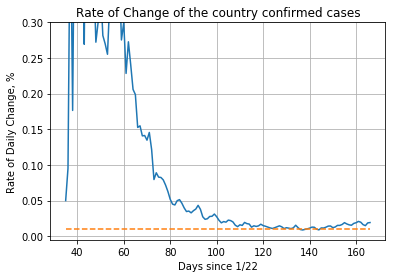

In [11]:
plt.plot(np.arange(35, len(country_df)-1), country_df.change[35:-1])
plt.plot(np.arange(35, len(country_df)-1), [.01]*len(country_df.change[35:-1]), linestyle='dashed')
plt.title("Rate of Change of the country confirmed cases")
plt.xlabel("Days since 1/22")
plt.ylabel("Rate of Daily Change, %")

plt.grid()
# plt.ylim(-0.05, 1.05)
plt.ylim(-0.005, .3)

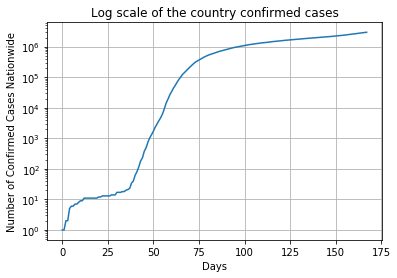

In [12]:
plt.plot(np.arange(0, len(country_df)), country_df['Country_Agg'])
plt.title("Log scale of the country confirmed cases")
plt.xlabel("Days")
plt.ylabel("Number of Confirmed Cases Nationwide")

plt.yscale('log')
plt.grid()
# plt.xlim(50, 134)
# plt.ylim(1, 50000)

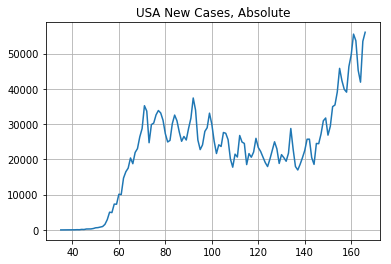

In [13]:
country_new_cases = country_df.values[1:] - country_df.values[:-1]

# print(will)
plt.plot(np.arange(35, len(country_new_cases)), country_new_cases[35:][:, 0])
plt.title("USA New Cases, Absolute")
plt.grid()

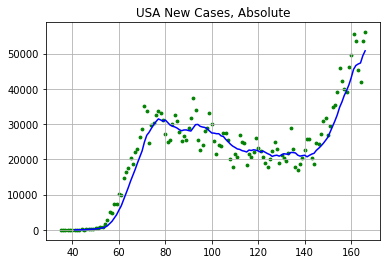

In [14]:
country_new_cases = country_df.values[1:] - country_df.values[:-1]

# print(will)
plt.scatter(np.arange(35, len(country_new_cases)), country_new_cases[35:][:, 0], s=8, color='green')
plt.plot(np.arange(35, len(country_new_cases)), pd.Series(country_new_cases[35:][:, 0]).rolling(7).mean(), color='blue')
plt.title("USA New Cases, Absolute")
plt.grid()

# Plot Big Cities

Some of the counties do not have unique names. To plot them, you must index the DataFrame by that county's name, then take the index of that county in the correct state.

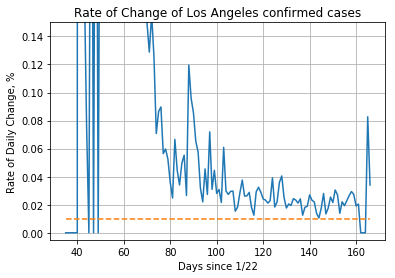

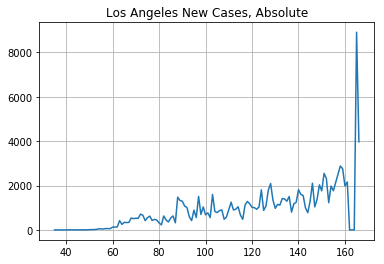

(        Los Angeles County    change
 1/22/20                  0  1.000000
 1/23/20                  0  1.000000
 1/24/20                  0  1.000000
 1/25/20                  0  1.000000
 1/26/20                  1  0.000000
 ...                    ...       ...
 7/3/20              107667  0.000000
 7/4/20              107667  0.000000
 7/5/20              107667  0.082690
 7/6/20              116570  0.034048
 7/7/20              120539  0.000000
 
 [168 rows x 2 columns],
 array([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 4, 2,
        1, 0, 6, 0, 9, 0, 11, 13, 16, 25, 50, 46, 41, 61, 59, 58, 127, 126,
        137, 417, 249, 339, 332, 338, 537, 507, 527, 521, 711, 663, 420,
        550, 620, 425, 475, 443, 319, 228, 627, 449, 358, 537, 630, 320,
        1475, 1324, 1295, 1073, 1009, 590, 421, 889, 559, 1509, 697, 1033,
        679, 768, 555, 1598, 829, 783, 869, 901, 480, 581, 922, 1248, 90

In [15]:
create_roc_and_new_case_numbers(df['Los Angeles County'], 'Los Angeles')

(40, 134)

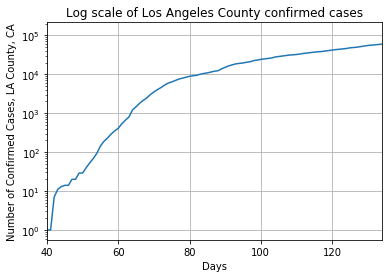

In [16]:
plt.plot(np.arange(0, len(df)), df['Los Angeles County'])
plt.title("Log scale of Los Angeles County confirmed cases")
plt.xlabel("Days")
plt.ylabel("Number of Confirmed Cases, LA County, CA")

plt.yscale('log')
plt.grid()
plt.xlim(40, 134)

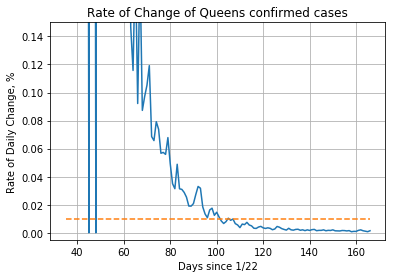

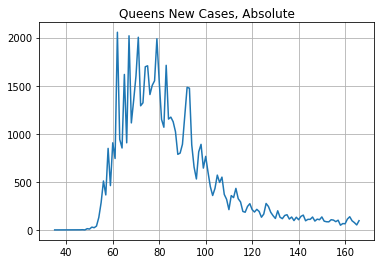

(        Queens County    change
 1/22/20             0  1.000000
 1/23/20             0  1.000000
 1/24/20             0  1.000000
 1/25/20             0  1.000000
 1/26/20             0  1.000000
 ...               ...       ...
 7/3/20          65705  0.001446
 7/4/20          65800  0.001155
 7/5/20          65876  0.000789
 7/6/20          65928  0.001456
 7/7/20          66024  0.000000
 
 [168 rows x 2 columns],
 array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        1, 0, 1, 2, 0, 13, 9, 29, 23, 40, 130, 285, 509, 364, 848, 461,
        906, 743, 2056, 942, 852, 1617, 906, 2019, 1113, 1348, 1602, 2004,
        1291, 1322, 1697, 1707, 1408, 1504, 1551, 1988, 1544, 1150, 1068,
        1712, 1153, 1173, 1125, 1021, 786, 799, 891, 1191, 1483, 1474, 884,
        654, 530, 812, 890, 643, 765, 601, 450, 358, 432, 570, 494, 549,
        369, 318, 211, 357, 336, 432, 325, 291, 192, 184, 2

In [17]:
create_roc_and_new_case_numbers(df['Queens County'], 'Queens')

(40, 134)

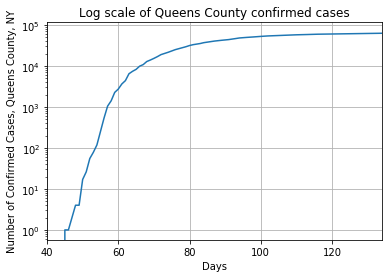

In [18]:
plt.plot(np.arange(0, len(df)), df['Queens County'])
plt.title("Log scale of Queens County confirmed cases")
plt.xlabel("Days")
plt.ylabel("Number of Confirmed Cases, Queens County, NY")

plt.yscale('log')
plt.grid()
plt.xlim(40, 134)

In [19]:
# Lists of several large counties, broken down by geographic north/south

southern = ["Los Angeles", "San Bernardino", "Riverside", "San Diego", "Orange", "Maricopa", 
        "Dallas", "Harris", "Miami-Dade", "Clark", "Broward", "Palm Beach"]
south2 = [df['Los Angeles County'], df['San Bernardino County'], df['Riverside County'],
         df['San Diego County'], df['Los Angeles County'], df['Maricopa County'], 
         df['Dallas County'].iloc[:,4], df['Harris County'].iloc[:,1], df['Miami-Dade County'],
         df['Clark County'].iloc[:,7], df['Broward County'], df['Palm Beach County']]

northern = ["King", "Yakima", "Cook", "Wayne", "Prince George's", "Fairfax", "Montgomery", 
        "Middlesex", "Union", "Essex", "Hudson", "Passaic", "Bergen", "Kings", "Queens",
        "Nassau", "Suffolk", "Westchester", "Fairfield", "Middlesex"]

north2 = [df['King County'].iloc[:,1], df['Yakima County'], df['Cook County'].iloc[:,1],
         df['Riverside County'], df['Wayne County'].iloc[:,5], df['Prince George\'s County'],
         df['Fairfax County'], df['Montgomery County'].iloc[:,8], df['Riverside County'],
         df['Middlesex County'].iloc[:,2], df['Union County'].iloc[:,8], 
         df['Essex County'].iloc[:,1], df['Hudson County'], df['Passaic County'],
         df['Bergen County'], df['Kings County'].iloc[:,1], df['Queens County'],
         df['Nassau County'].iloc[:,1], df['Suffolk County'].iloc[:,1], 
         df['Westchester County'], df['Fairfield County'].iloc[:,0],
         df['Middlesex County'].iloc[:,1] ]

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


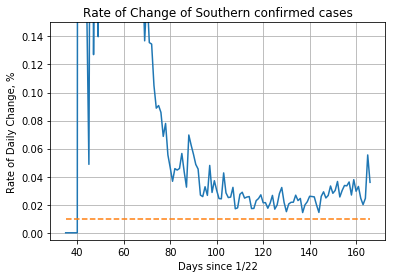

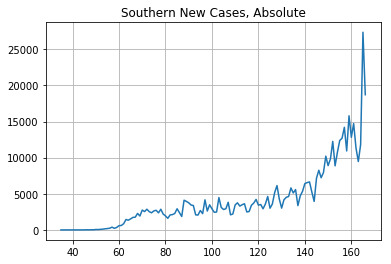

(         South_Agg    change
 1/22/20          0       NaN
 1/23/20          0       NaN
 1/24/20          0       NaN
 1/25/20          0       inf
 1/26/20          3  0.000000
 ...            ...       ...
 7/3/20      471675  0.020058
 7/4/20      481136  0.024548
 7/5/20      492947  0.055489
 7/6/20      520300  0.035954
 7/7/20      539007  0.000000
 
 [168 rows x 2 columns],
 array([    0,     0,     0,     3,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     1,     0,     1,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,    12,    12,     6,     6,
            2,    20,     8,    22,    13,    58,    50,    73,   105,
          155,   185,   232,   385,   215,   343,   588,   614,   857,
         1439,  1344,  1527,  1732,  1764,  2282,  1923,  2744,  2538,
         2860,  2532,  2368,  2632,  2716,  2

In [20]:
new_col = [x[1].sum() for x in pd.concat(south2, axis=1).iterrows()]
df['South_Agg'] = new_col

create_roc_and_new_case_numbers(df['South_Agg'], 'Southern')

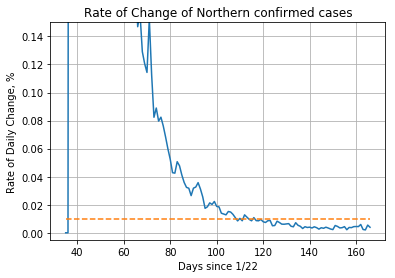

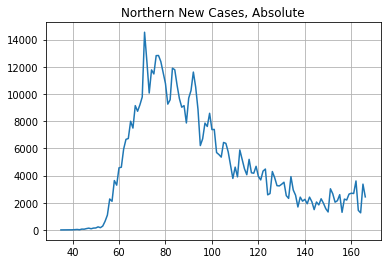

(         North_Agg    change
 1/22/20          1  0.000000
 1/23/20          1  1.000000
 1/24/20          2  0.000000
 1/25/20          2  0.000000
 1/26/20          2  0.000000
 ...            ...       ...
 7/3/20      612089  0.002349
 7/4/20      613527  0.002050
 7/5/20      614785  0.005477
 7/6/20      618152  0.003931
 7/7/20      620582  0.000000
 
 [168 rows x 2 columns],
 array([    0,     1,     0,     0,     0,     0,     0,     0,     1,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     5,     4,     6,     8,    19,    33,    12,    60,
           53,    97,   130,    86,   134,   143,   224,   165,   283,
          632,  1091,  2275,  2105,  3629,  3292,  4566,  4612,  5948,
         6661,  6722,  7990,  7490,  9140,  8727,  9200,  9779, 14538,
        12387, 10067, 11767, 11472, 12818, 12

In [21]:
new_col = [x[1].sum() for x in pd.concat(north2, axis=1).iterrows()]
df['North_Agg'] = new_col

create_roc_and_new_case_numbers(df['North_Agg'], 'Northern')

# Classify States

In [22]:
df2 = pd.read_csv(filepath)
df2.head()
df2 = df2.set_index("County Name").T
df2.drop(["countyFIPS", "stateFIPS"], inplace=True)

In [23]:
state_col = df2.iloc[0]
df2.drop("State", inplace=True)
# df2['State'] = state_col


In [24]:
pd.DataFrame(state_col[1:]).groupby("State").groups.keys()

southwest = ["AZ", "NM", "TX", "OK"]
west = ["WA", "OR", "CA", "NV", "ID", "UT", "MT", "WY", "CO"]
midwest = ["ND", "SD", "NE", "KS", "MN", "IA", "MO", "WI", "IL", "MI", "IN", "OH"]
southeast = ["AR", "LA", "KY", "TN", "MS", "AL", "GA", "WV", "VA", "NC", "SC", "FL"]
northeast = ["ME", "NH", "VT", "MA", "RI", "CT", "NY", "NJ", "PA", "DE", "MD", "DC"]



In [25]:
# Example of taking the index of a county in the correct state
# Using Middlesex County, MA as an example
print(state_col[state_col.index == 'Middlesex County'])
df['Middlesex County'].iloc[:, 1]

County Name
Middlesex County    CT
Middlesex County    MA
Middlesex County    NJ
Middlesex County    VA
Name: State, dtype: object


1/22/20        0
1/23/20        0
1/24/20        0
1/25/20        0
1/26/20        0
           ...  
7/3/20     24083
7/4/20     24115
7/5/20     24153
7/6/20     24193
7/7/20     24243
Name: Middlesex County, Length: 168, dtype: object

## Classifying states based on having more cases since the midpoint (day 106 - 151) or before the midpoint (day 61 - 106)

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


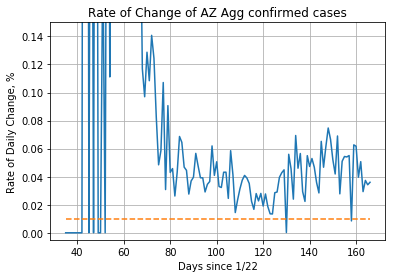

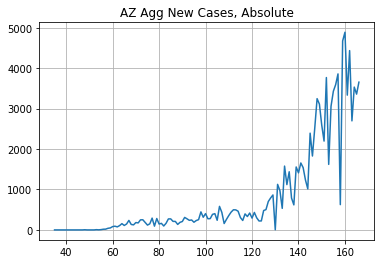

88755
16105
AZ is a mess


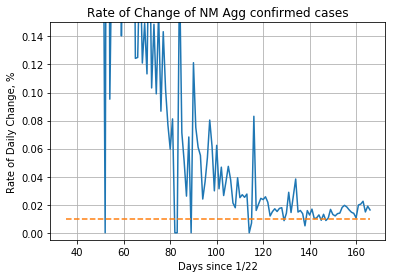

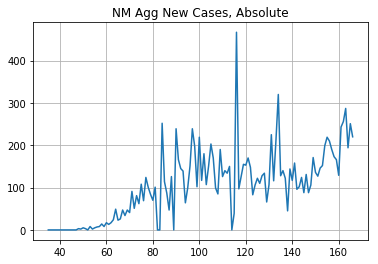

6788
6857
NM is neutral


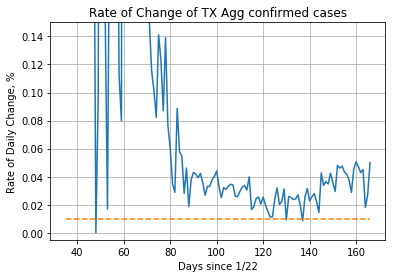

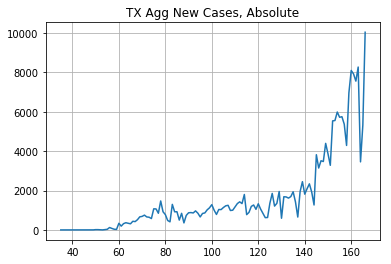

155279
54604
TX is a mess


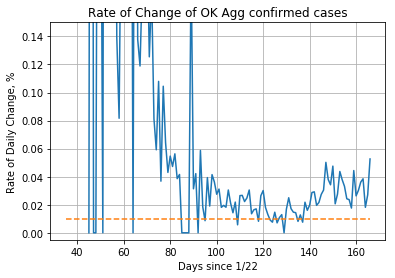

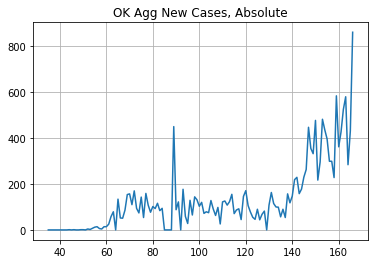

11188
5952
OK is a mess


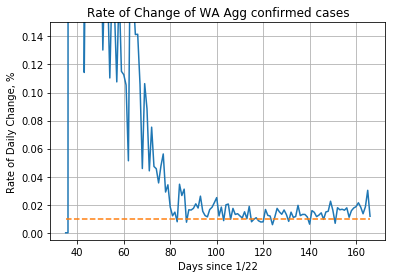

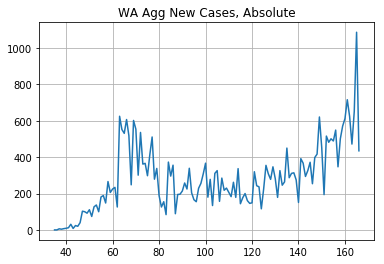

17593
17606
WA is neutral


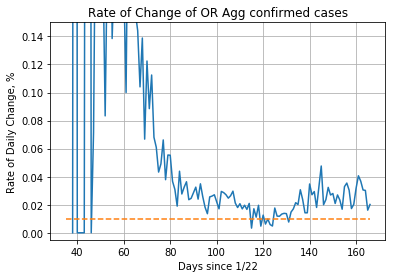

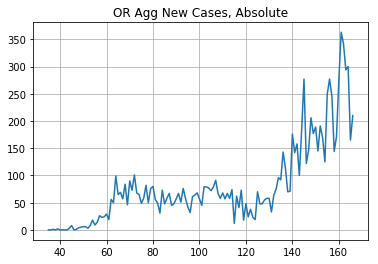

6683
3732
OR is a mess


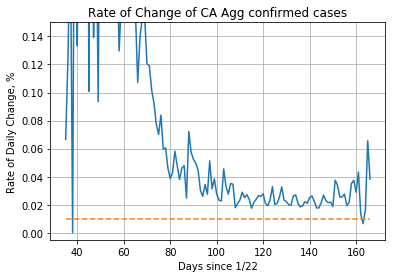

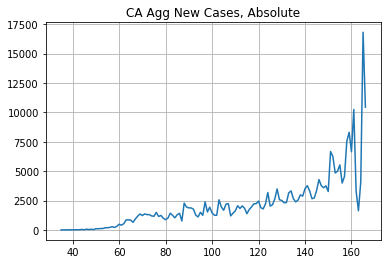

189067
91862
CA is a mess


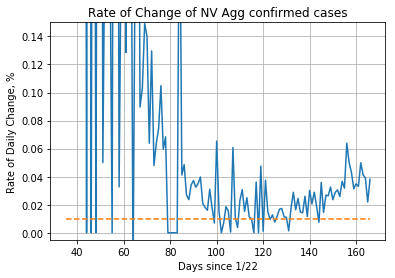

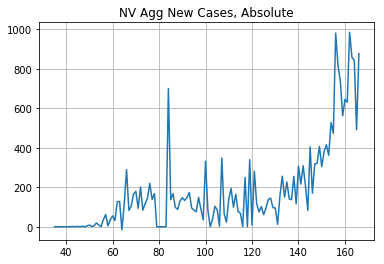

15886
7650
NV is a mess


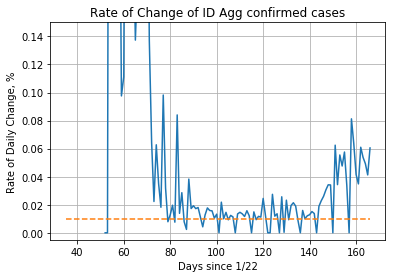

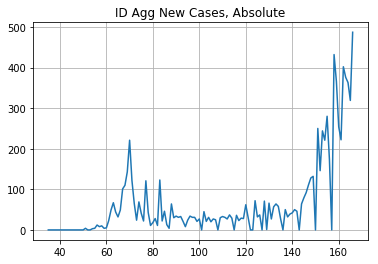

5913
2576
ID is a mess


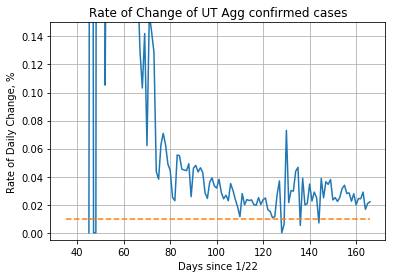

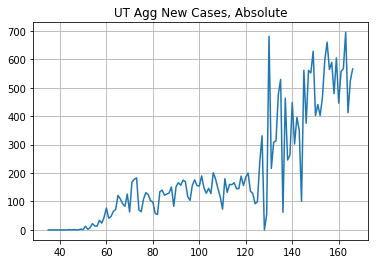

17744
8139
UT is a mess


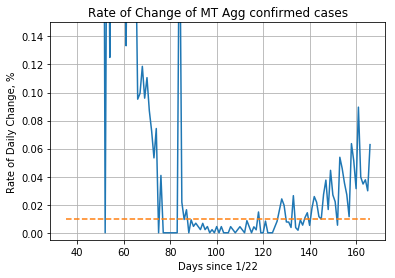

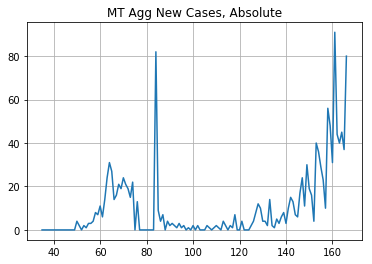

870
438
MT is a mess


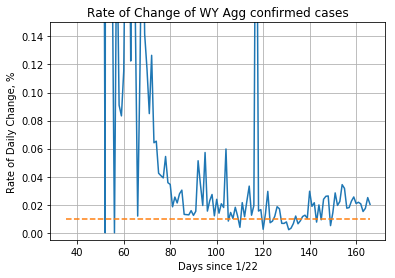

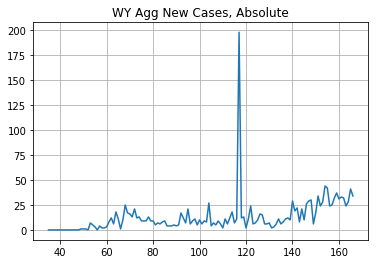

872
808
WY is neutral


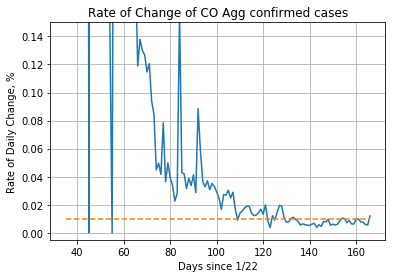

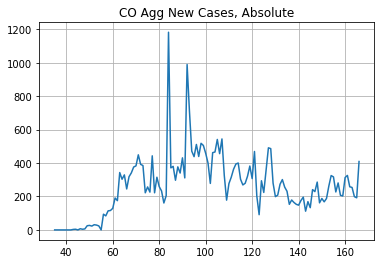

10507
23437
CO is a do-gooder


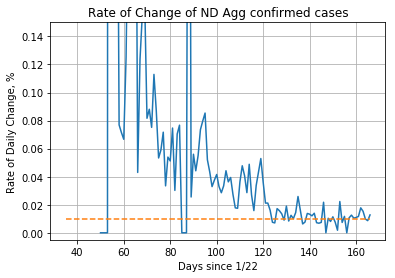

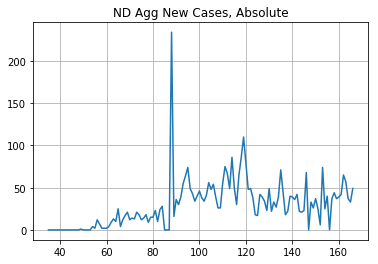

1534
2332
ND is a do-gooder


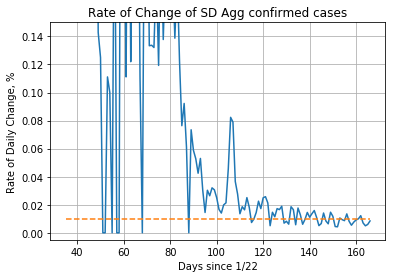

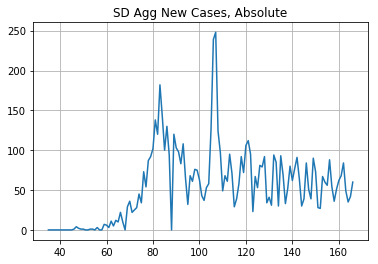

2604
4532
SD is a do-gooder


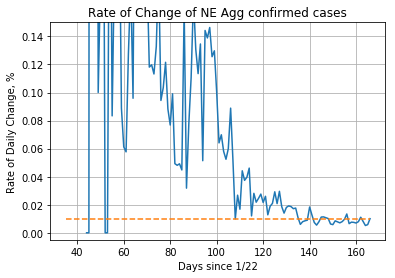

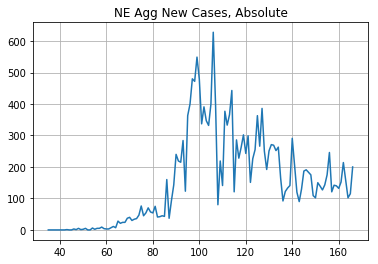

8135
11890
NE is a do-gooder


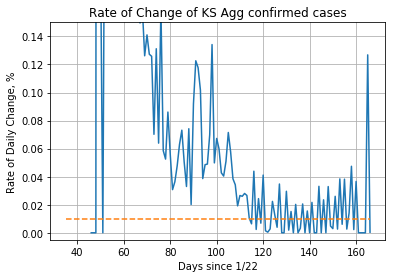

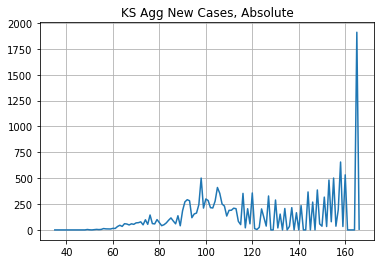

7925
8974
KS is a do-gooder


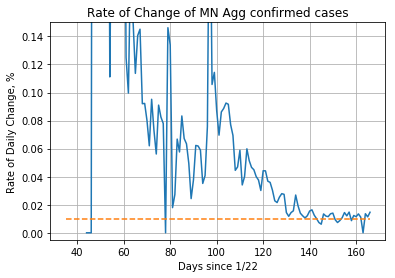

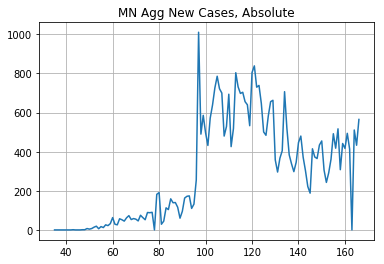

18560
20341
MN is neutral


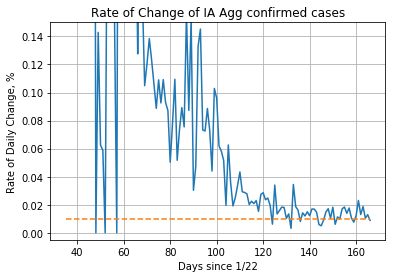

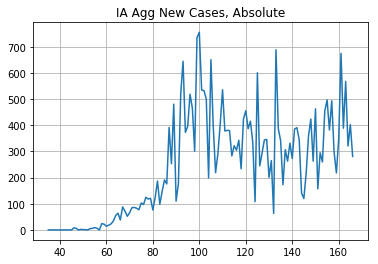

14719
17104
IA is a do-gooder


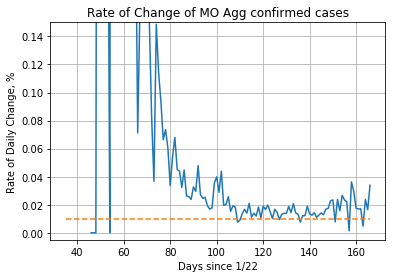

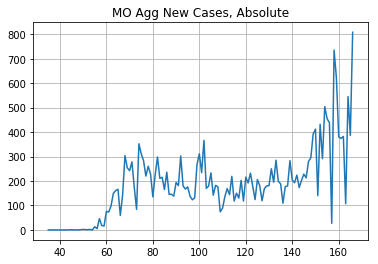

12647
11797
MO is neutral


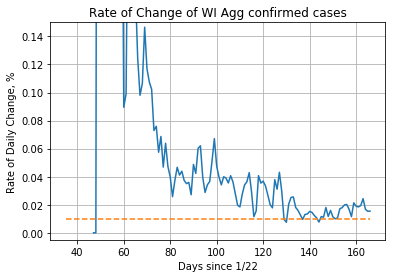

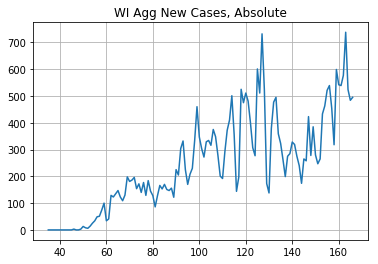

17280
14862
WI is a mess


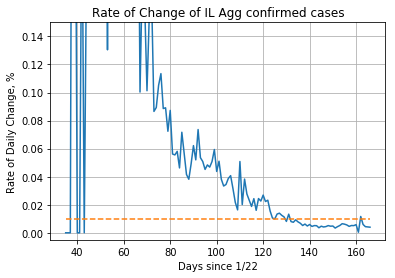

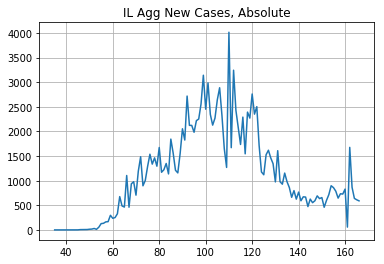

38157
109010
IL is a do-gooder


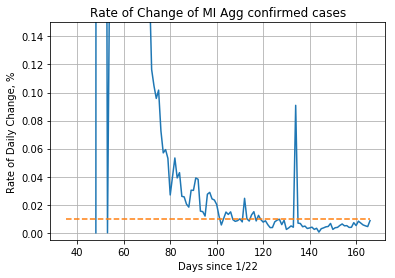

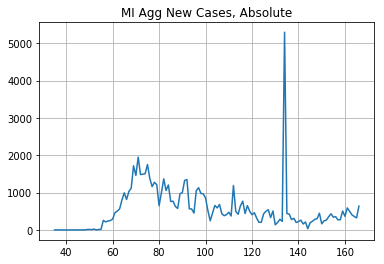

19224
53349
MI is a do-gooder


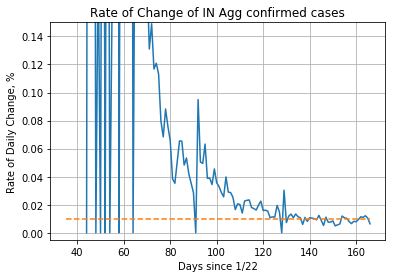

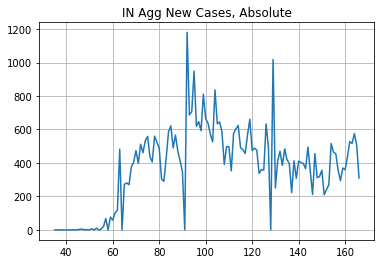

17453
31111
IN is a do-gooder


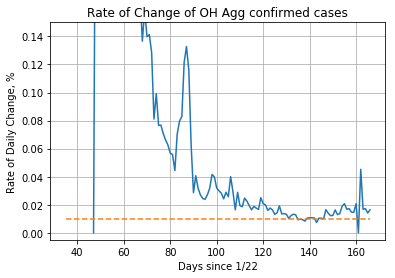

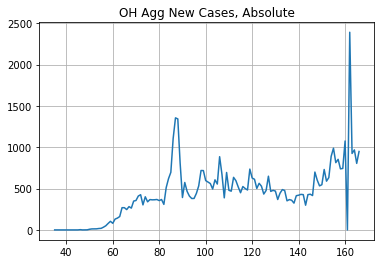

26996
31478
OH is a do-gooder


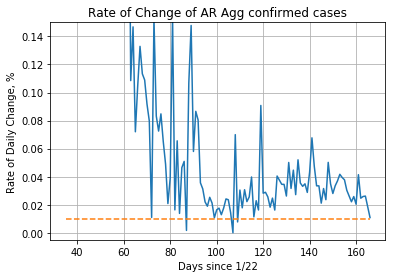

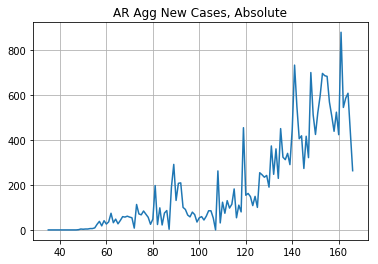

18592
5735
AR is a mess


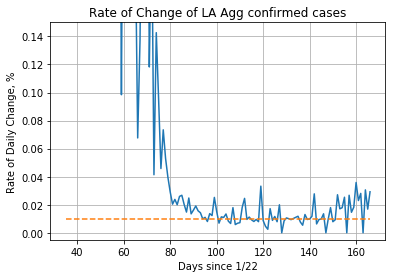

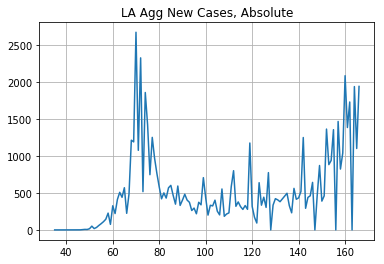

31191
35909
LA is a do-gooder


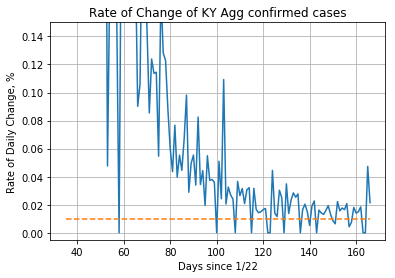

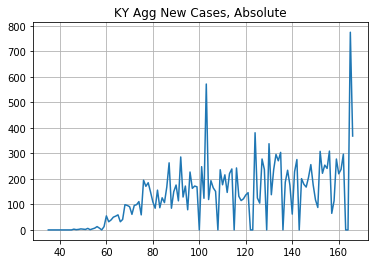

8952
8446
KY is neutral


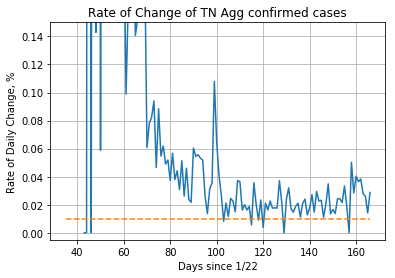

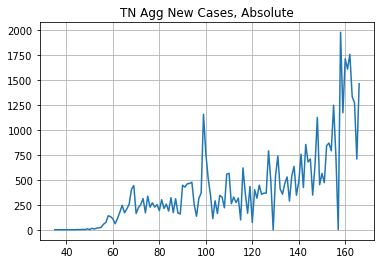

32666
19146
TN is a mess


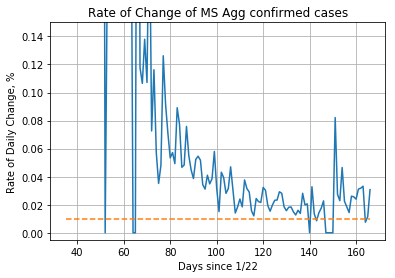

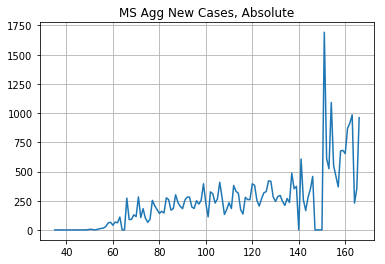

18965
13003
MS is a mess


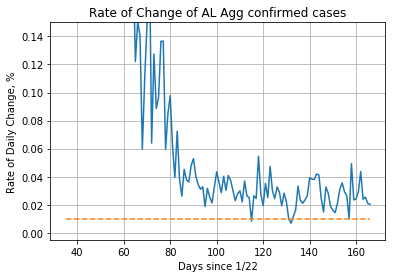

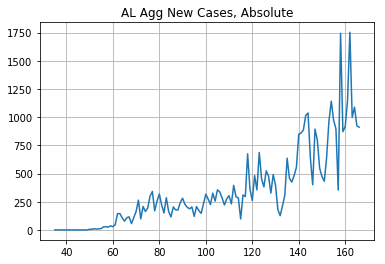

31278
14311
AL is a mess


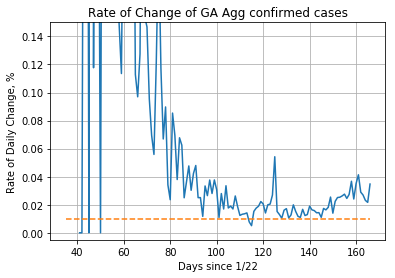

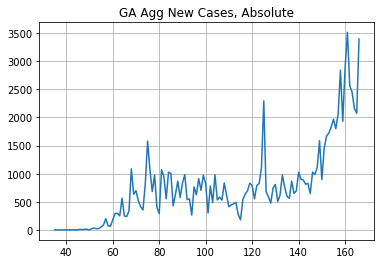

60761
39565
GA is a mess


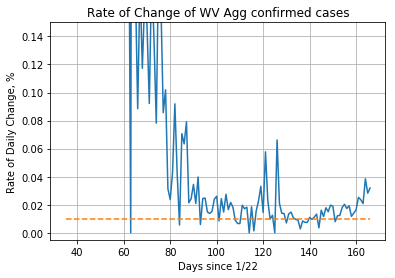

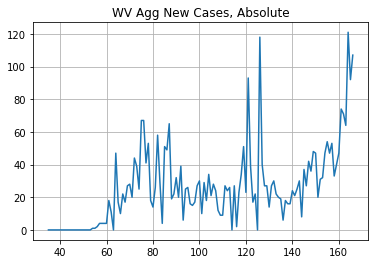

1717
1724
WV is neutral


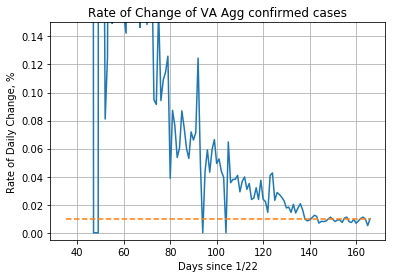

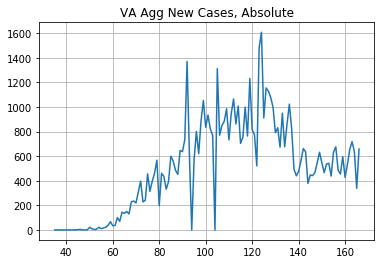

30497
35990
VA is a do-gooder


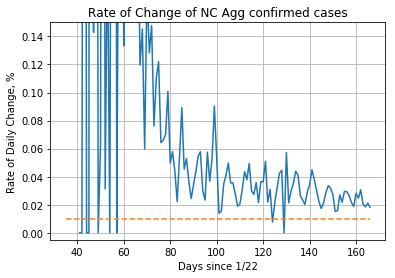

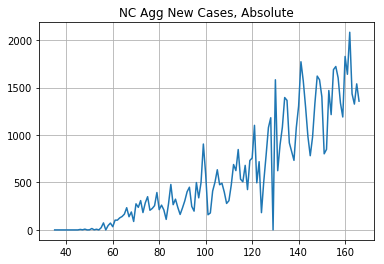

52664
22922
NC is a mess


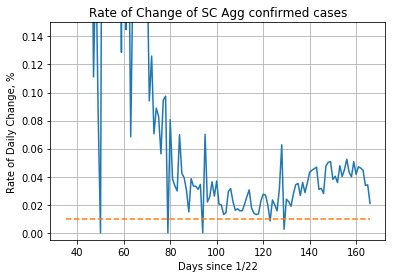

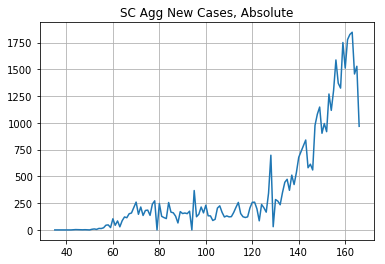

37122
9795
SC is a mess


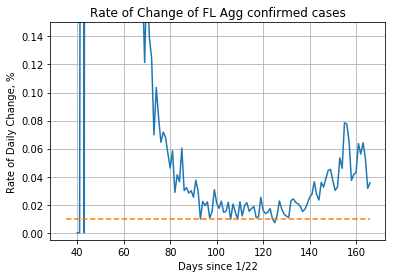

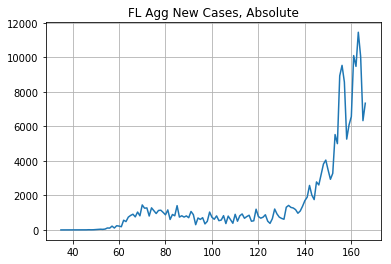

162928
49639
FL is a mess


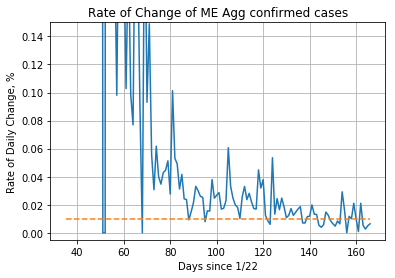

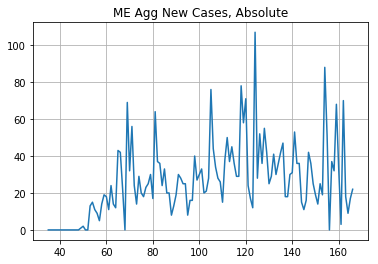

1474
1881
ME is a do-gooder


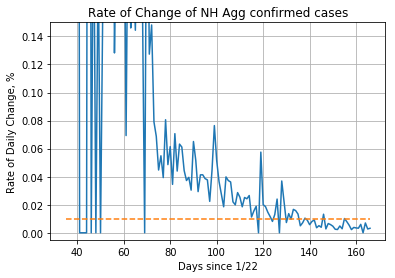

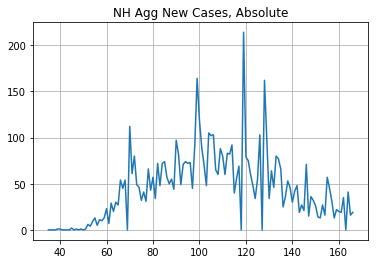

1783
4048
NH is a do-gooder


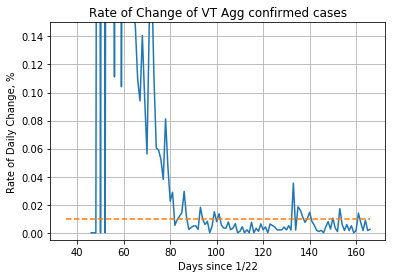

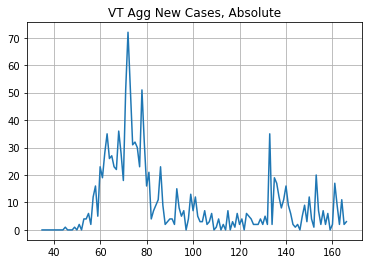

298
880
VT is a do-gooder


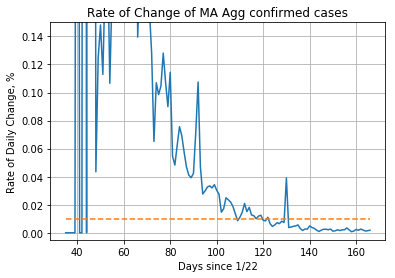

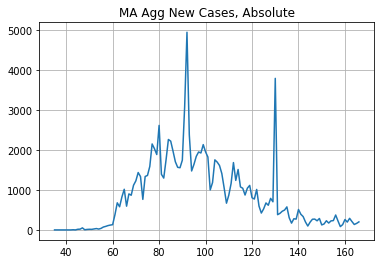

17663
91899
MA is a do-gooder


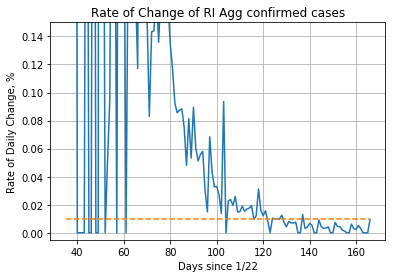

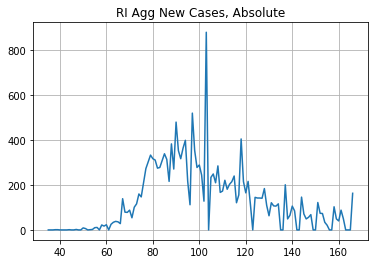

3089
13959
RI is a do-gooder


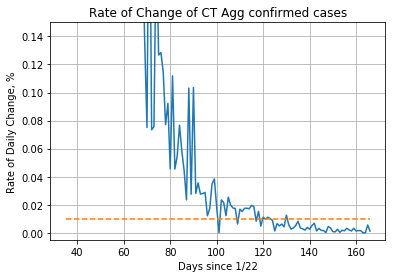

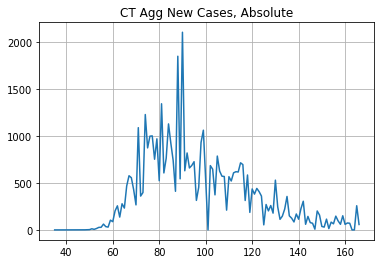

6568
40050
CT is a do-gooder


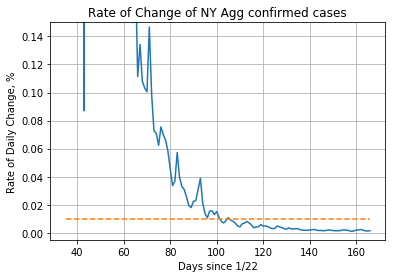

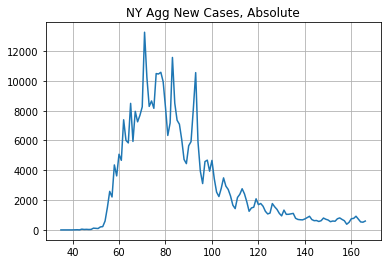

36729
340675
NY is a do-gooder


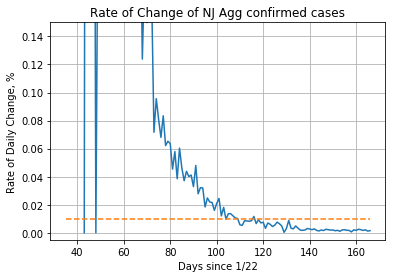

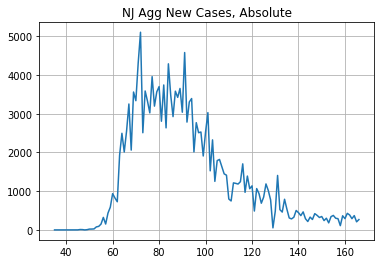

19724
151303
NJ is a do-gooder


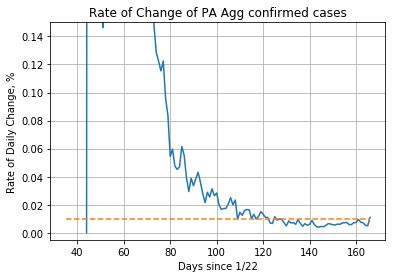

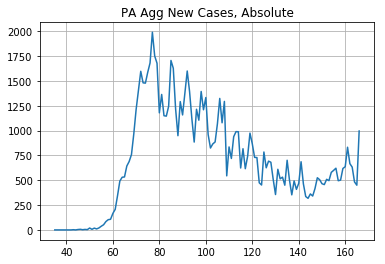

23592
67063
PA is a do-gooder


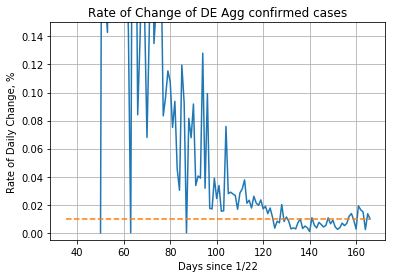

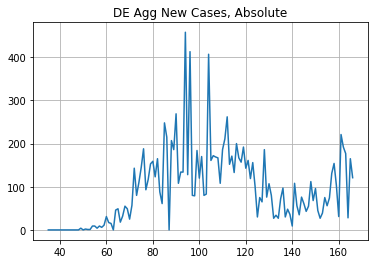

3605
8722
DE is a do-gooder


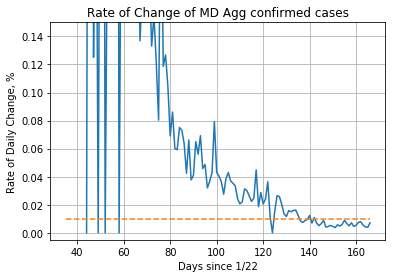

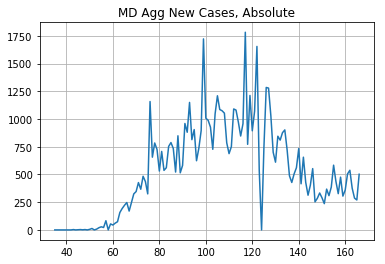

23246
46862
MD is a do-gooder


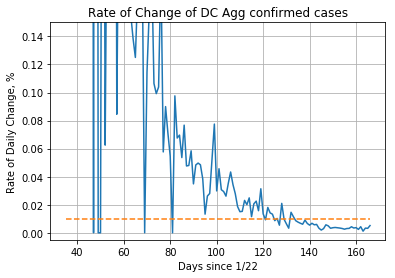

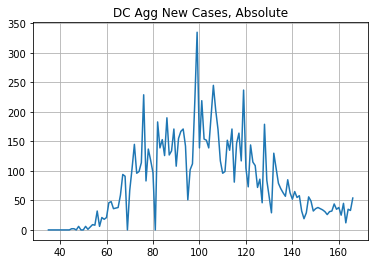

2459
7973
DC is a do-gooder


In [26]:
state_list = [state for states in [southwest, west,midwest ,southeast ,northeast ] for state in states]

good_states = []
bad_states = []
neutral_states = []
kinda_good_states = []
kinda_bad_states = []

neg_diffs = []
pos_diffs = []
neg_ratios = []
pos_ratios = []
neutral_diffs = []
neutral_ratios = []

for state in state_list:
    y = single_state(state)
    new_col = [x[1].sum() for x in y.iterrows()]
    df['{}_agg'.format(state)] = new_col
    x = create_roc_and_new_case_numbers(df['{}_agg'.format(state)], '{} Agg'.format(state))
    print(x[1][midpoint:].sum())
    print(x[1][61:midpoint].sum())
    if abs(x[1][midpoint:].sum() - x[1][61:midpoint].sum()) < x[1][61:].sum() * .05:
        print("{} is neutral".format(state))
        neutral_states.append(state)
        neutral_diffs.append(abs(x[1][61:midpoint].sum() - x[1][midpoint:].sum()))
        if x[1][61:midpoint].sum() > x[1][midpoint:].sum():
            neutral_ratios.append(x[1][61:midpoint].sum() / x[1][midpoint:].sum())
        else:
            neutral_ratios.append(x[1][midpoint:].sum() / x[1][61:midpoint].sum())
    elif x[1][midpoint:].sum() > x[1][61:midpoint].sum():
#         if np.percentile(np.array(all_ratios), 50) < x[1][midpoint:].sum() / x[1][61:midpoint].sum():
        if True:
            print("{} is a mess".format(state))
            bad_states.append(state)
            neg_diffs.append(x[1][midpoint:].sum() - x[1][61:midpoint].sum())
            neg_ratios.append(x[1][midpoint:].sum() / x[1][61:midpoint].sum())
        else:
            print("{} is kinda bad".format(state))
            kinda_bad_states.append(state)
            neg_diffs.append(x[1][midpoint:].sum() - x[1][61:midpoint].sum())
            neg_ratios.append(x[1][midpoint:].sum() / x[1][61:midpoint].sum())
    else:
#         if np.percentile(np.array(all_ratios), 50) < x[1][61:midpoint].sum() / x[1][midpoint:].sum():
        if True:
            print("{} is a do-gooder".format(state))
            good_states.append(state)
            pos_diffs.append(x[1][61:midpoint].sum() - x[1][midpoint:].sum())
            pos_ratios.append(x[1][61:midpoint].sum() / x[1][midpoint:].sum())
        else:
            print("{} is kinda good".format(state))
            kinda_good_states.append(state)
            pos_diffs.append(x[1][61:midpoint].sum() - x[1][midpoint:].sum())
            pos_ratios.append(x[1][61:midpoint].sum() / x[1][midpoint:].sum())
all_ratios = pos_ratios.copy()
all_ratios.extend(neg_ratios)
all_ratios.extend(neutral_ratios)

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


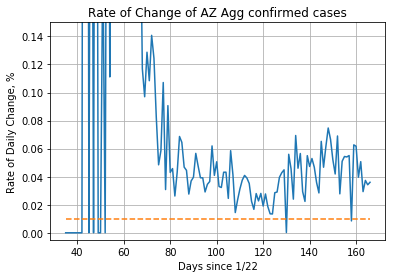

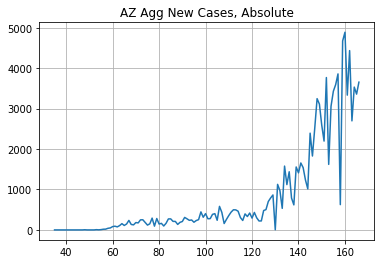

88755
16105
AZ is a mess


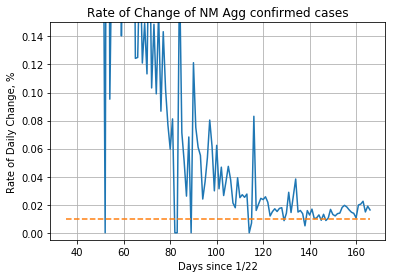

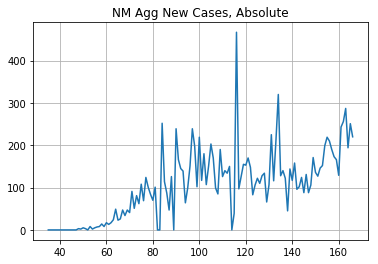

6788
6857
NM is neutral


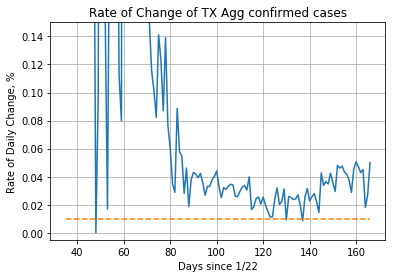

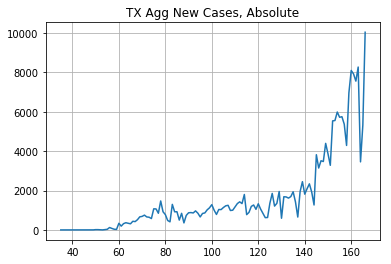

155279
54604
TX is a mess


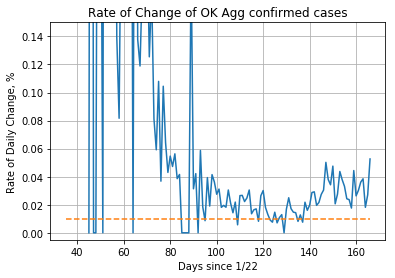

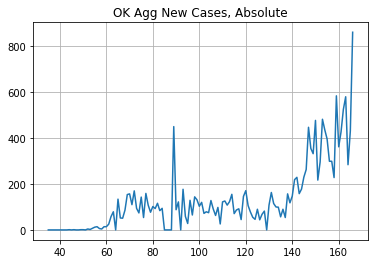

11188
5952
OK is kinda bad


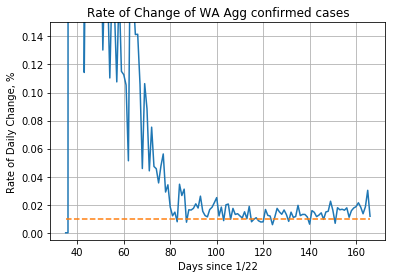

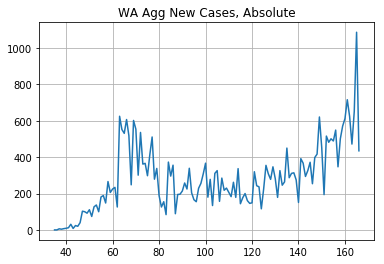

17593
17606
WA is neutral


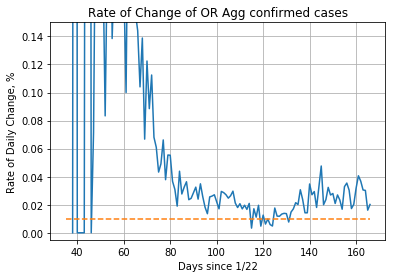

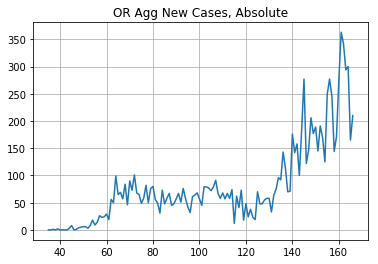

6683
3732
OR is kinda bad


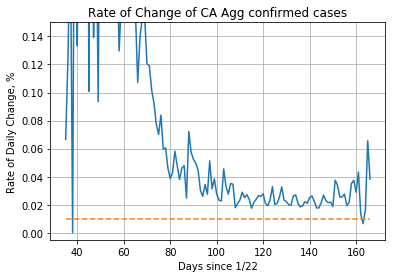

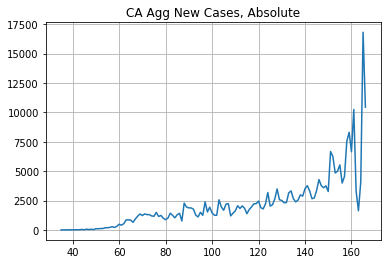

189067
91862
CA is a mess


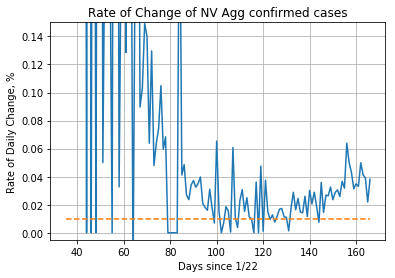

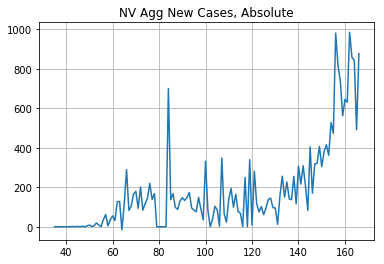

15886
7650
NV is a mess


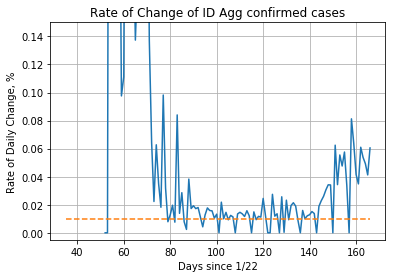

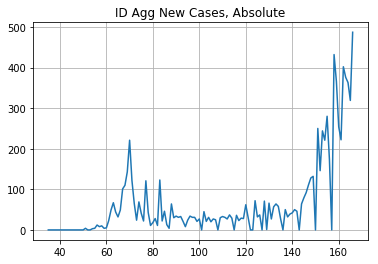

5913
2576
ID is a mess


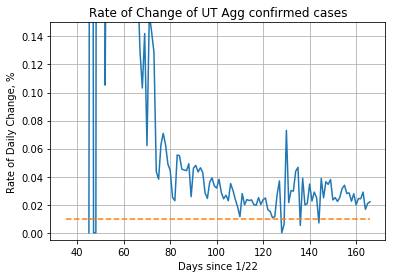

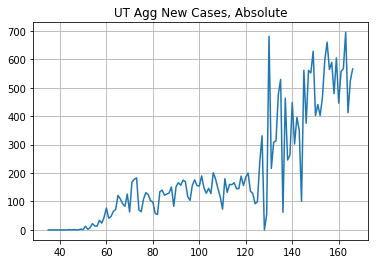

17744
8139
UT is a mess


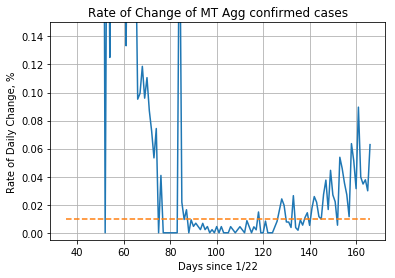

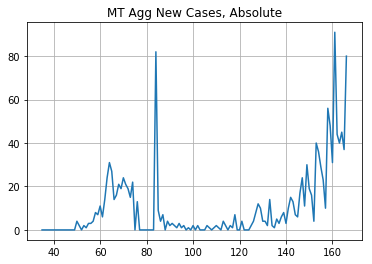

870
438
MT is kinda bad


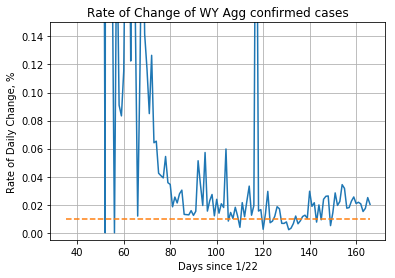

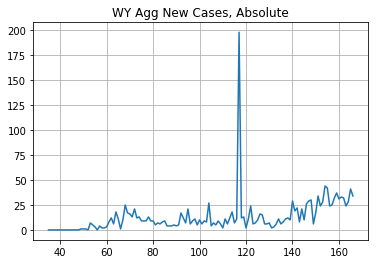

872
808
WY is neutral


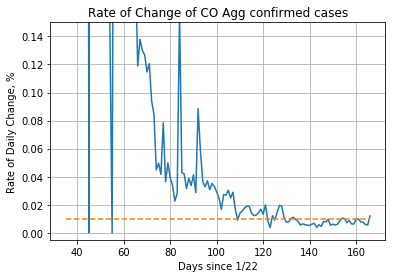

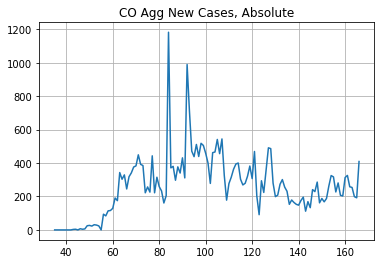

10507
23437
CO is a do-gooder


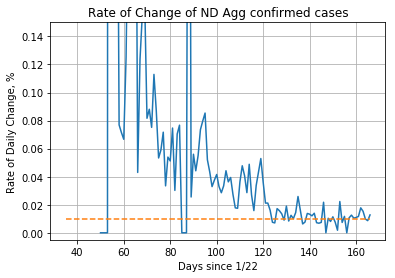

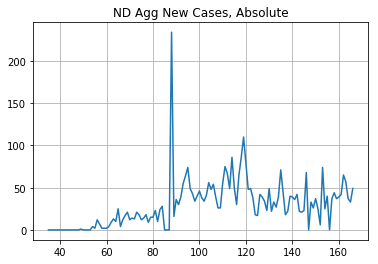

1534
2332
ND is kinda good


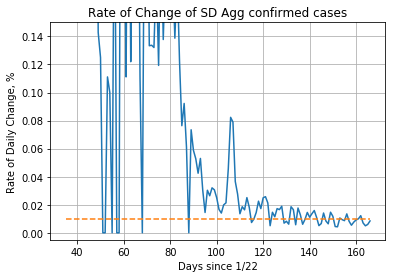

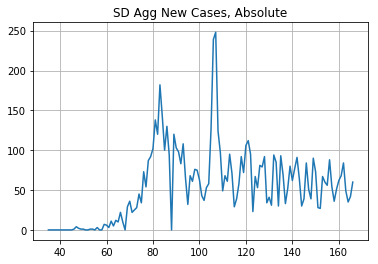

2604
4532
SD is kinda good


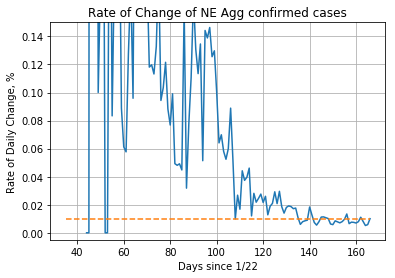

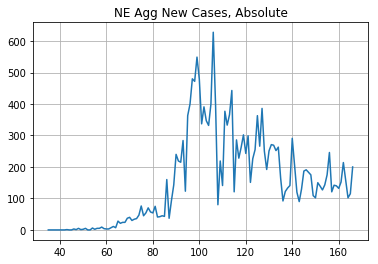

8135
11890
NE is kinda good


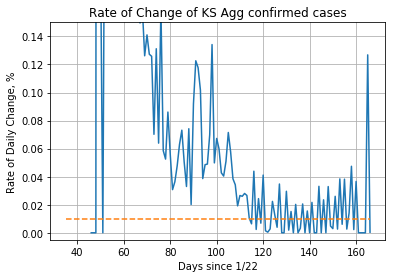

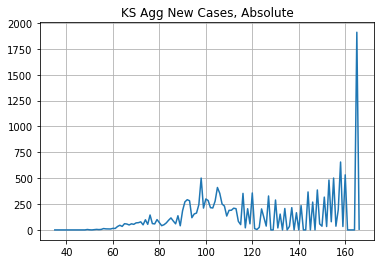

7925
8974
KS is kinda good


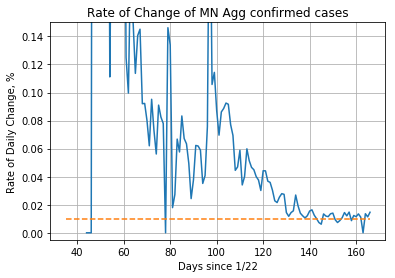

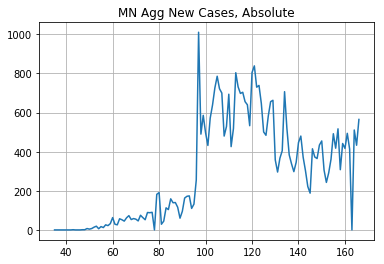

18560
20341
MN is neutral


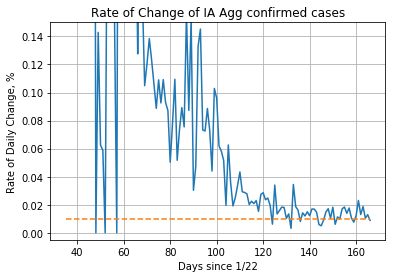

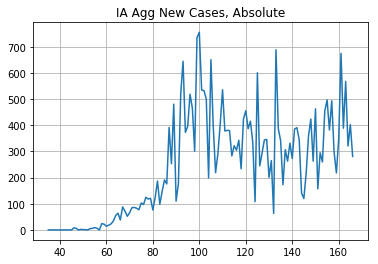

14719
17104
IA is kinda good


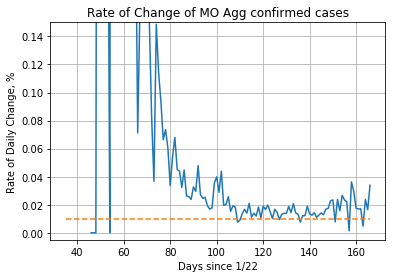

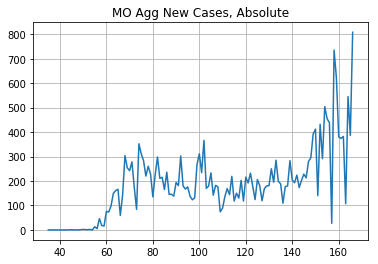

12647
11797
MO is neutral


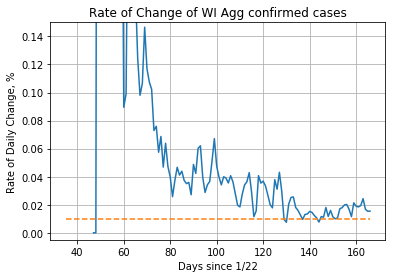

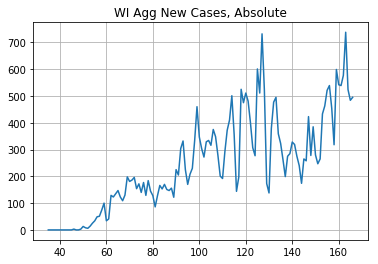

17280
14862
WI is kinda bad


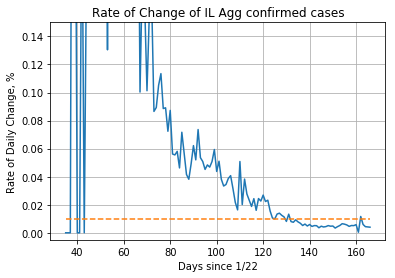

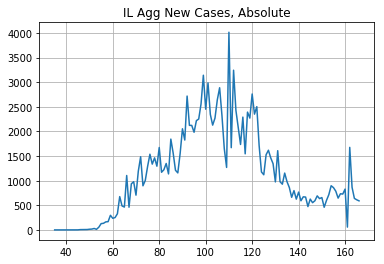

38157
109010
IL is a do-gooder


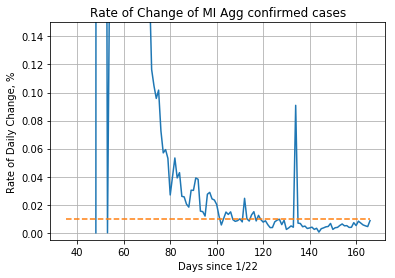

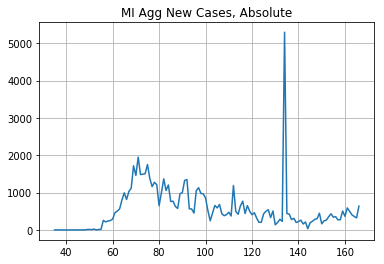

19224
53349
MI is a do-gooder


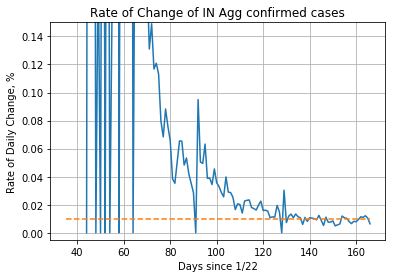

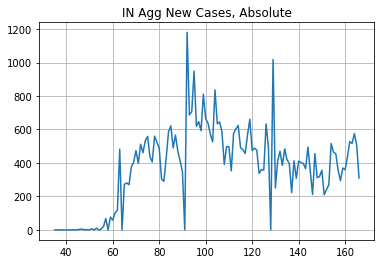

17453
31111
IN is kinda good


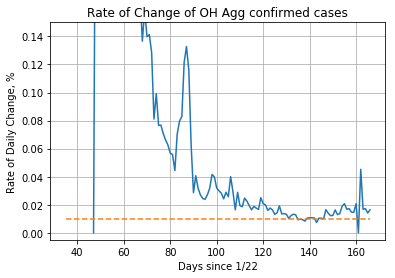

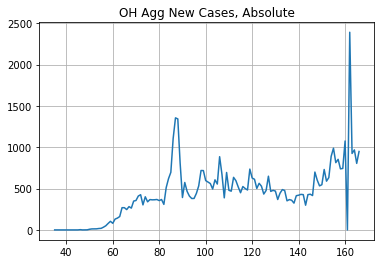

26996
31478
OH is kinda good


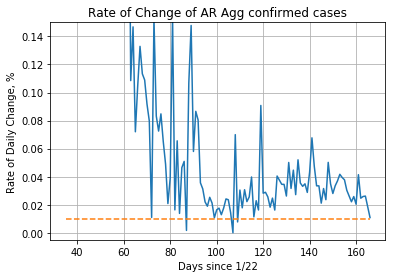

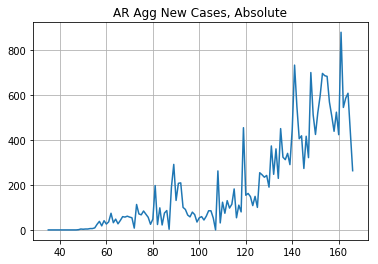

18592
5735
AR is a mess


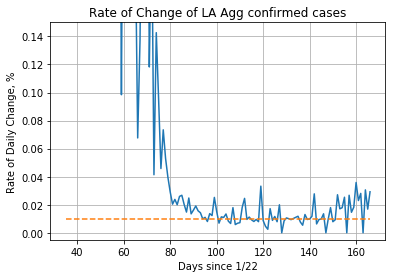

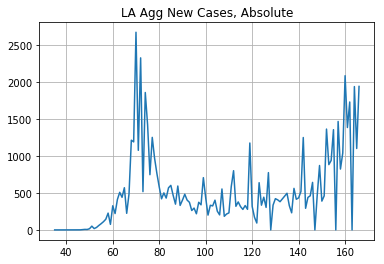

31191
35909
LA is kinda good


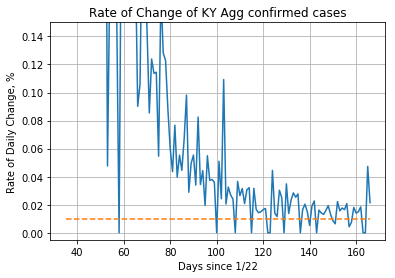

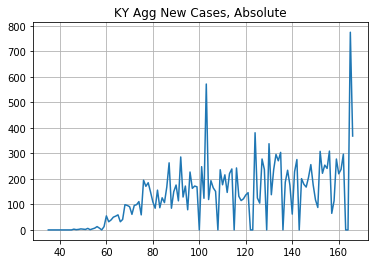

8952
8446
KY is neutral


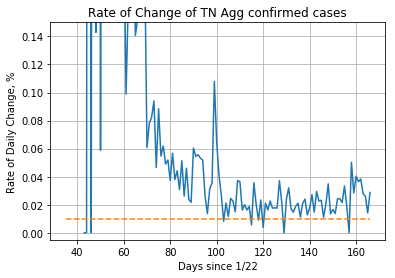

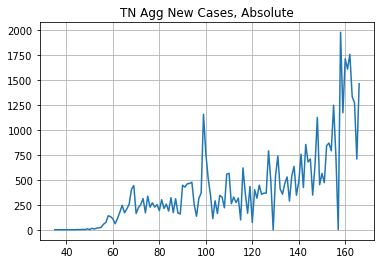

32666
19146
TN is kinda bad


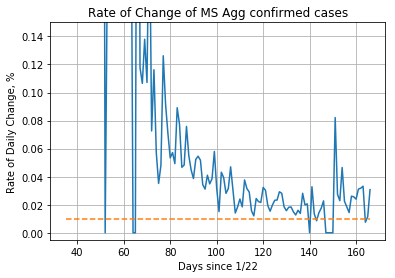

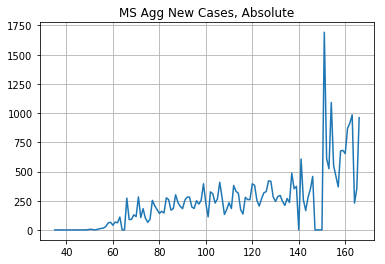

18965
13003
MS is kinda bad


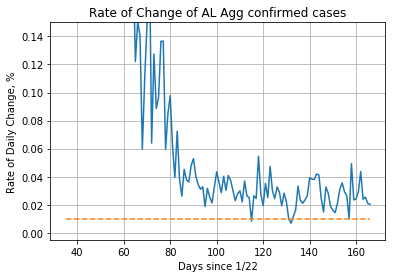

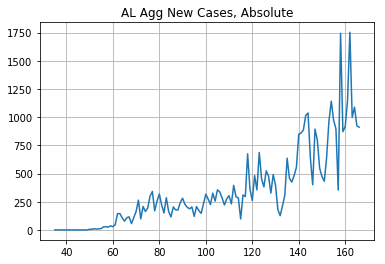

31278
14311
AL is a mess


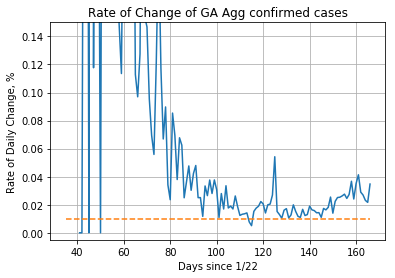

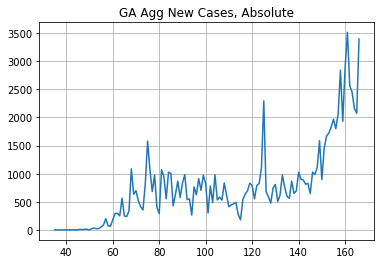

60761
39565
GA is kinda bad


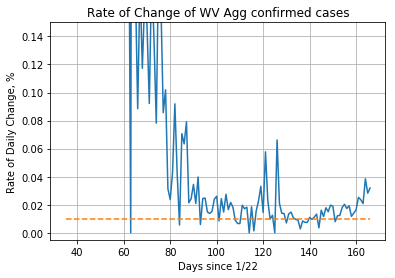

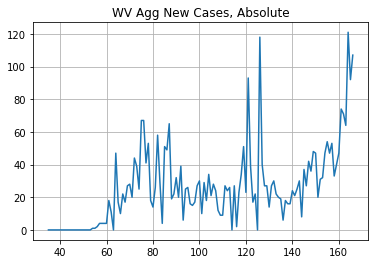

1717
1724
WV is neutral


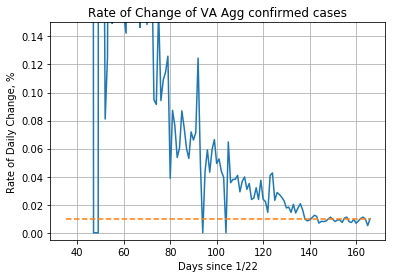

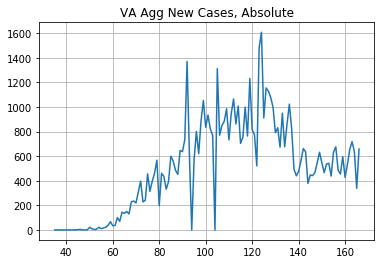

30497
35990
VA is kinda good


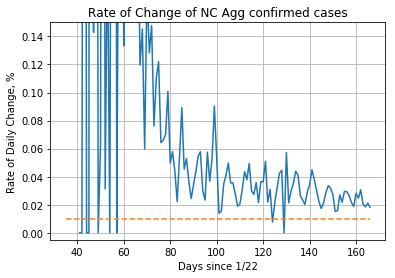

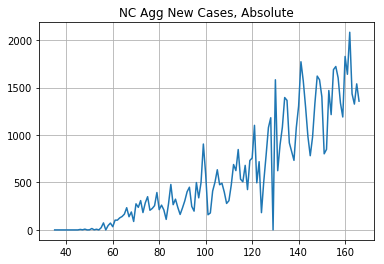

52664
22922
NC is a mess


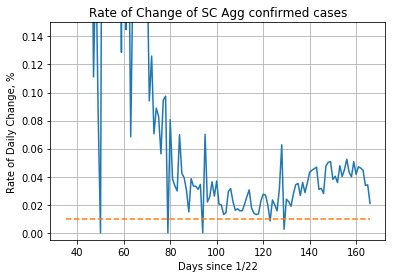

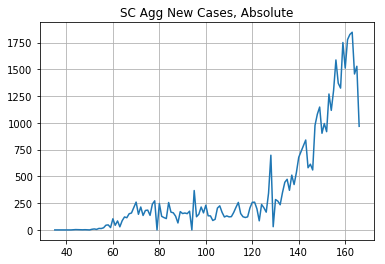

37122
9795
SC is a mess


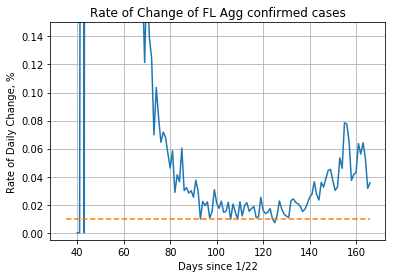

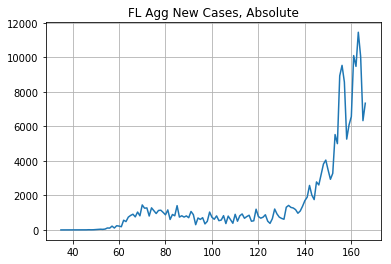

162928
49639
FL is a mess


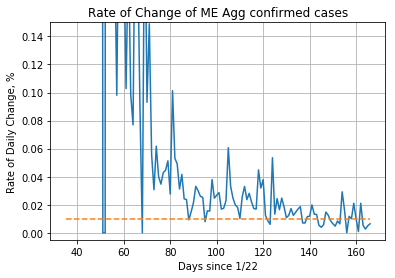

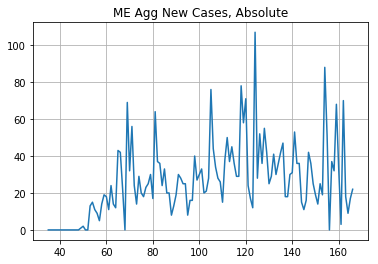

1474
1881
ME is kinda good


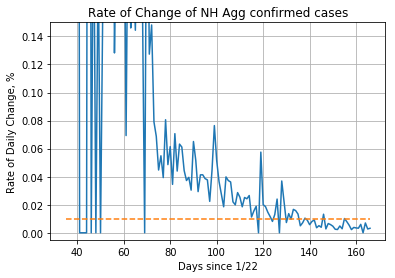

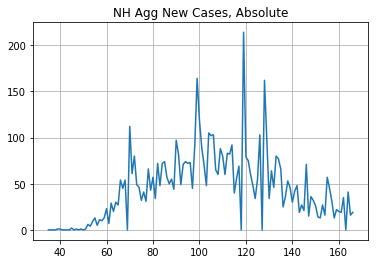

1783
4048
NH is a do-gooder


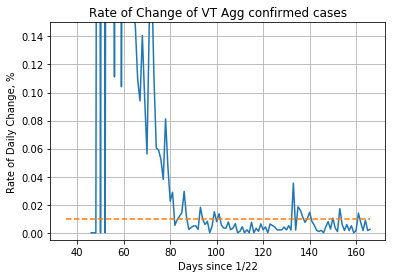

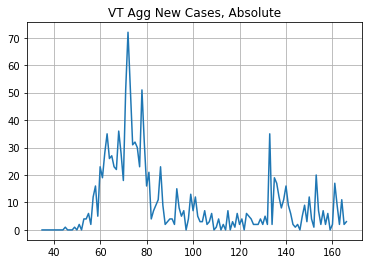

298
880
VT is a do-gooder


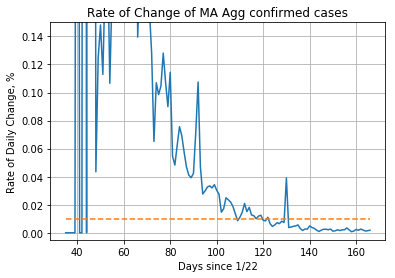

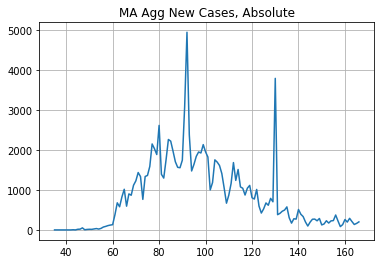

17663
91899
MA is a do-gooder


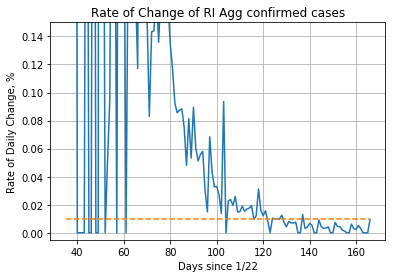

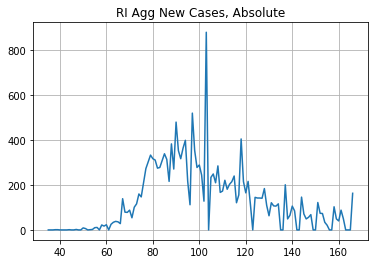

3089
13959
RI is a do-gooder


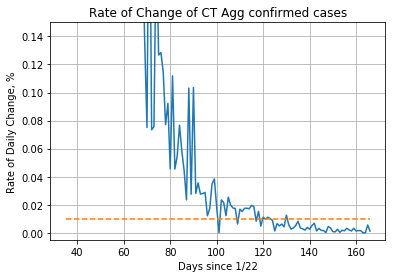

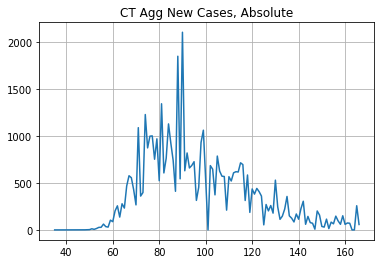

6568
40050
CT is a do-gooder


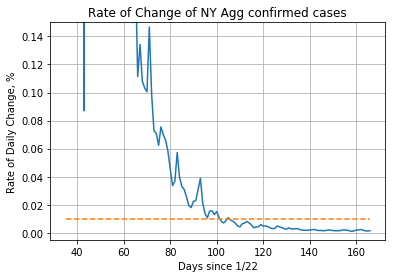

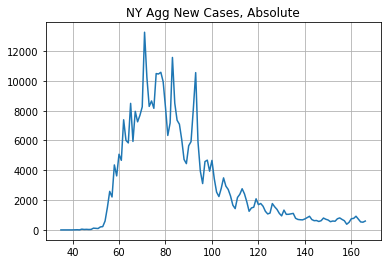

36729
340675
NY is a do-gooder


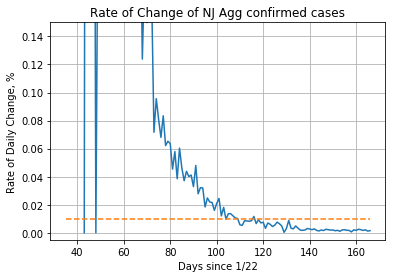

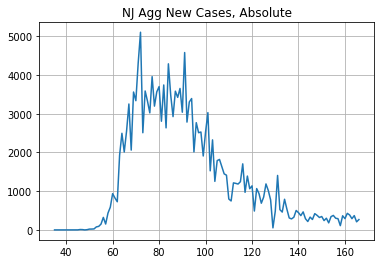

19724
151303
NJ is a do-gooder


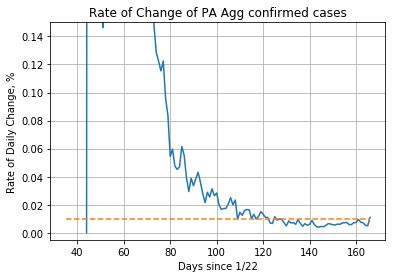

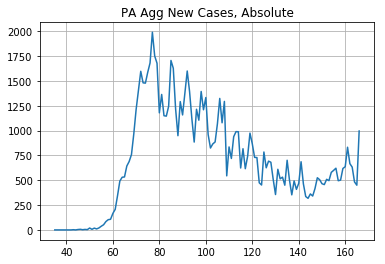

23592
67063
PA is a do-gooder


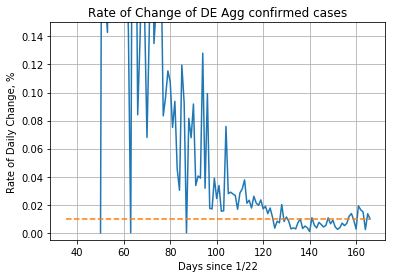

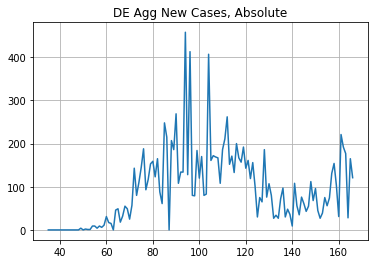

3605
8722
DE is a do-gooder


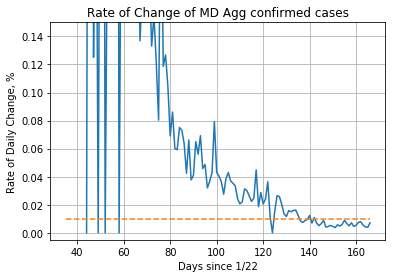

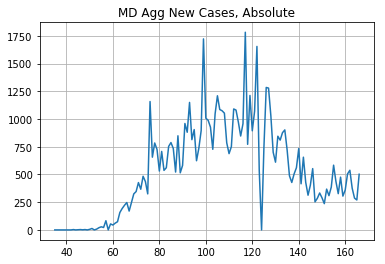

23246
46862
MD is kinda good


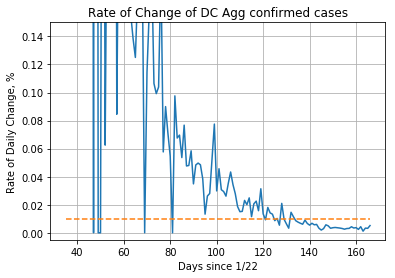

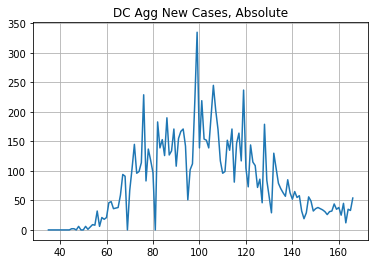

2459
7973
DC is a do-gooder


In [27]:
# Classifying states based on having more cases since the midpoint (day 106 - 151)
# or before the midpoint (day 61 - 106)

state_list = [state for states in [southwest, west,midwest ,southeast ,northeast ] for state in states]

good_states = []
bad_states = []
neutral_states = []
kinda_good_states = []
kinda_bad_states = []

neg_diffs = []
pos_diffs = []
neg_ratios = []
pos_ratios = []
neutral_diffs = []
neutral_ratios = []

for state in state_list:
    y = single_state(state)
    new_col = [x[1].sum() for x in y.iterrows()]
    df['{}_agg'.format(state)] = new_col
    x = create_roc_and_new_case_numbers(df['{}_agg'.format(state)], '{} Agg'.format(state))
    print(x[1][midpoint:].sum())
    print(x[1][61:midpoint].sum())
    if abs(x[1][midpoint:].sum() - x[1][61:midpoint].sum()) < x[1][61:].sum() * .05:
        print("{} is neutral".format(state))
        neutral_states.append(state)
        neutral_diffs.append(abs(x[1][61:midpoint].sum() - x[1][midpoint:].sum()))
        if x[1][61:midpoint].sum() > x[1][midpoint:].sum():
            neutral_ratios.append(x[1][61:midpoint].sum() / x[1][midpoint:].sum())
        else:
            neutral_ratios.append(x[1][midpoint:].sum() / x[1][61:midpoint].sum())
    elif x[1][midpoint:].sum() > x[1][61:midpoint].sum():
        if np.percentile(np.array(all_ratios), 50) < x[1][midpoint:].sum() / x[1][61:midpoint].sum():
#         if True:
            print("{} is a mess".format(state))
            bad_states.append(state)
            neg_diffs.append(x[1][midpoint:].sum() - x[1][61:midpoint].sum())
            neg_ratios.append(x[1][midpoint:].sum() / x[1][61:midpoint].sum())
        else:
            print("{} is kinda bad".format(state))
            kinda_bad_states.append(state)
            neg_diffs.append(x[1][midpoint:].sum() - x[1][61:midpoint].sum())
            neg_ratios.append(x[1][midpoint:].sum() / x[1][61:midpoint].sum())
    else:
        if np.percentile(np.array(all_ratios), 50) < x[1][61:midpoint].sum() / x[1][midpoint:].sum():
#         if True:
            print("{} is a do-gooder".format(state))
            good_states.append(state)
            pos_diffs.append(x[1][61:midpoint].sum() - x[1][midpoint:].sum())
            pos_ratios.append(x[1][61:midpoint].sum() / x[1][midpoint:].sum())
        else:
            print("{} is kinda good".format(state))
            kinda_good_states.append(state)
            pos_diffs.append(x[1][61:midpoint].sum() - x[1][midpoint:].sum())
            pos_ratios.append(x[1][61:midpoint].sum() / x[1][midpoint:].sum())

In [28]:
# print(pos_diffs, neg_diffs)
# print()
# print(np.array(pos_diffs).max(), np.array(neg_diffs).max())
# print()

# print(pos_ratios, neg_ratios)
# print()
# print(np.array(pos_ratios).max(), np.array(neg_ratios).max())
# print()
# print(neutral_diffs)
# print(np.array(neutral_diffs).max())
# print(neutral_ratios)
# print(np.array(neutral_ratios).max())
# print()

all_ratios = pos_ratios.copy()
all_ratios.extend(neg_ratios)
all_ratios.extend(neutral_ratios)
np.percentile(np.array(all_ratios), 50)

2.0159167168545125

['CO', 'IL', 'MI', 'NH', 'VT', 'MA', 'RI', 'CT', 'NY', 'NJ', 'PA', 'DE', 'DC']
['ND', 'SD', 'NE', 'KS', 'IA', 'IN', 'OH', 'LA', 'VA', 'ME', 'MD']
['NM', 'WA', 'WY', 'MN', 'MO', 'KY', 'WV']
['OK', 'OR', 'MT', 'WI', 'TN', 'MS', 'GA']
['AZ', 'TX', 'CA', 'NV', 'ID', 'UT', 'AR', 'AL', 'NC', 'SC', 'FL']


c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


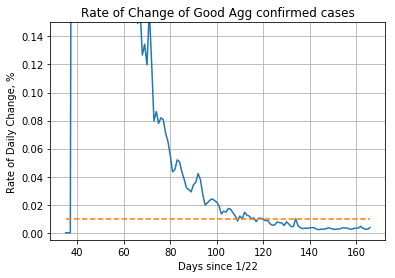

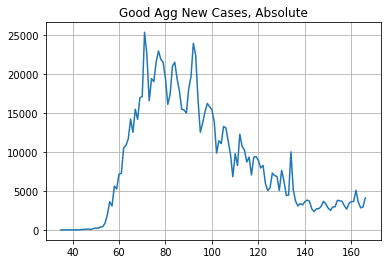

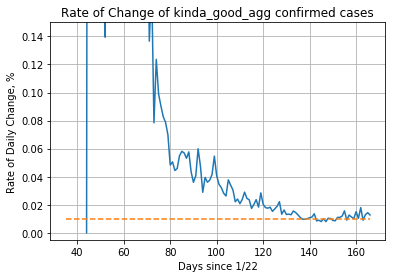

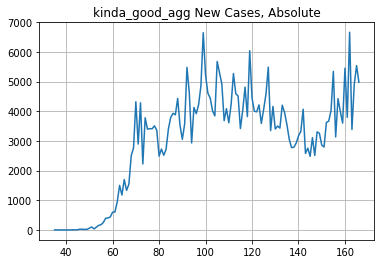

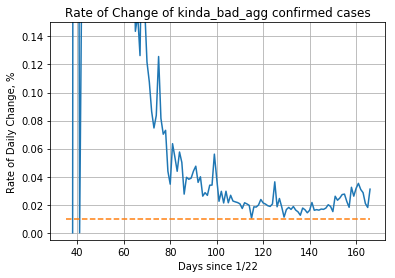

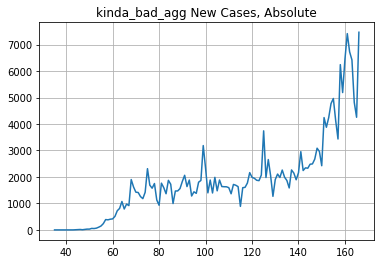

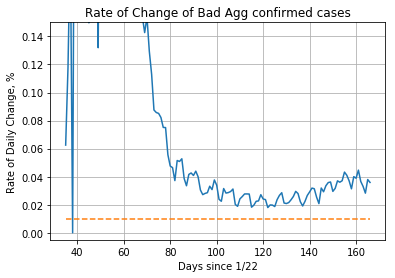

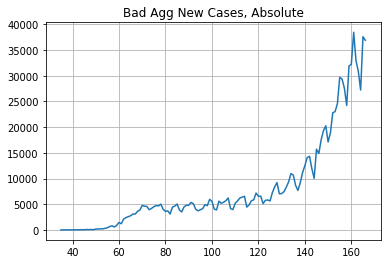

(         Bad_agg    change
 1/22/20        0       NaN
 1/23/20        0       NaN
 1/24/20        0       NaN
 1/25/20        0       inf
 1/26/20        3  0.333333
 ...          ...       ...
 7/3/20    932296  0.033088
 7/4/20    963144  0.028255
 7/5/20    990358  0.037950
 7/6/20   1027942  0.035894
 7/7/20   1064839  0.000000
 
 [168 rows x 2 columns],
 array([    0,     0,     0,     3,     1,     0,     1,     0,     0,
            0,     0,     2,     0,     0,     0,     0,     0,     0,
            0,     1,     0,     1,     0,     0,     0,     0,     1,
            0,     0,     3,     0,     0,     1,     0,     2,     1,
            2,     4,     0,     9,     5,    14,    19,    23,    54,
           22,    83,    48,    79,    50,   157,   195,   197,   210,
          314,   409,   662,   806,   566,   875,  1453,  1196,  2111,
         2398,  2575,  2754,  3088,  3090,  3620,  3868,  4761,  4626,
         4557,  3932,  4188,  4514,  4730,  4678,  5022,  4002,  3614

In [29]:
print(good_states)
print(kinda_good_states)
print(neutral_states)
print(kinda_bad_states)
print(bad_states)



y = aggregate_region(good_states)
new_col = [x[1].sum() for x in y.iterrows()]
df['Good_agg'] = new_col
create_roc_and_new_case_numbers(df['Good_agg'], 'Good Agg')

y = aggregate_region(kinda_good_states)
new_col = [x[1].sum() for x in y.iterrows()]
df['kinda_good_agg'] = new_col
create_roc_and_new_case_numbers(df['kinda_good_agg'], 'kinda_good_agg')

y = aggregate_region(kinda_bad_states)
new_col = [x[1].sum() for x in y.iterrows()]
df['kinda_bad_agg'] = new_col
create_roc_and_new_case_numbers(df['kinda_bad_agg'], 'kinda_bad_agg')

y = aggregate_region(bad_states)
new_col = [x[1].sum() for x in y.iterrows()]
df['Bad_agg'] = new_col
create_roc_and_new_case_numbers(df['Bad_agg'], 'Bad Agg')

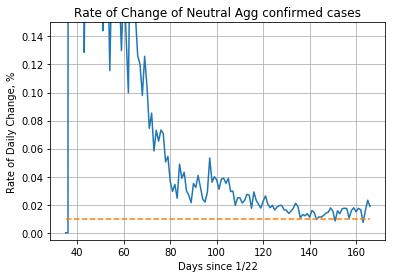

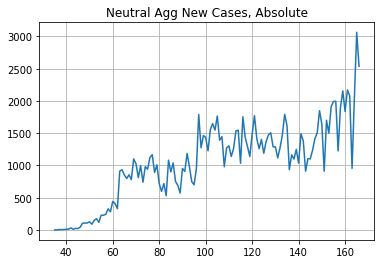

(         Neutral_agg    change
 1/22/20            1  0.000000
 1/23/20            1  0.000000
 1/24/20            1  0.000000
 1/25/20            1  0.000000
 1/26/20            1  0.000000
 ...              ...       ...
 7/3/20        128989  0.007396
 7/4/20        129943  0.015776
 7/5/20        131993  0.023221
 7/6/20        135058  0.018785
 7/7/20        137595  0.000000
 
 [168 rows x 2 columns],
 array([   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    6,    4,    7,    9,   12,   31,    9,
          24,   21,   43,  105,  106,  107,  126,   88,  148,  174,  118,
         227,  228,  243,  326,  281,  443,  407,  329,  911,  933,  852,
         797,  855,  780, 1101, 1027,  810,  997,  740,  981,  941, 1124,
        1166,  891, 1009,  717,  597,  719,  530, 1082,  901, 1039,  75

In [30]:
y = aggregate_region(neutral_states)
new_col = [x[1].sum() for x in y.iterrows()]
df['Neutral_agg'] = new_col
create_roc_and_new_case_numbers(df['Neutral_agg'], 'Neutral Agg')

4/3/20, the date that the CDC officially recommended wearing masks.


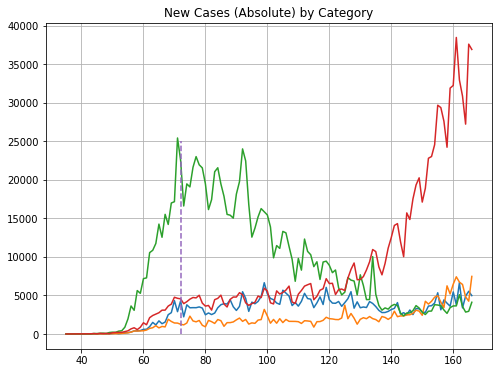

In [31]:
plt.figure(figsize=(8, 6))

create_new_case_graphs(df['kinda_good_agg'], 'Kinda Good Agg')
create_new_case_graphs(df['kinda_bad_agg'], 'Kinda Bad Agg')

create_new_case_graphs(df['Good_agg'], 'Good Agg')
create_new_case_graphs(df['Bad_agg'], 'Bad Agg')

plt.grid()
plt.plot([72, 72], [0, 25000], linestyle="dashed")
# create_new_case_graphs(df['Neutral_agg'], 'Neutral Agg')
plt.title("New Cases (Absolute) by Category")
print(df.index[72], ", the date that the CDC officially recommended wearing masks.", sep="")

Good: ['CO', 'IL', 'MI', 'NH', 'VT', 'MA', 'RI', 'CT', 'NY', 'NJ', 'PA', 'DE', 'DC']
Kinda Good: ['ND', 'SD', 'NE', 'KS', 'IA', 'IN', 'OH', 'LA', 'VA', 'ME', 'MD']
Kinda Bad: ['OK', 'OR', 'MT', 'WI', 'TN', 'MS', 'GA']
Bad: ['AZ', 'TX', 'CA', 'NV', 'ID', 'UT', 'AR', 'AL', 'NC', 'SC', 'FL']


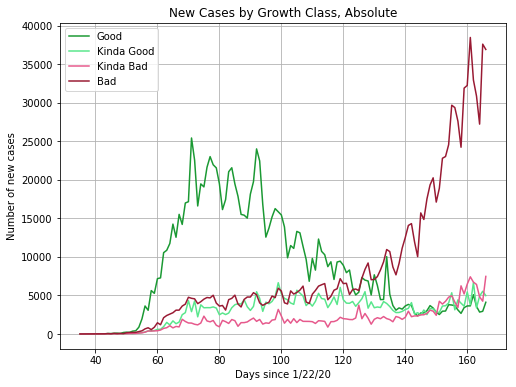

In [32]:
plt.figure(figsize=(8, 6))

create_new_case_graphs_colored(df['Good_agg'], 'Good', (0.1, 0.6, 0.2), smoothing_factor=1)
create_new_case_graphs_colored(df['kinda_good_agg'], 'Kinda Good', (0.35, 0.9, 0.55), smoothing_factor=1)
create_new_case_graphs_colored(df['kinda_bad_agg'], 'Kinda Bad', (0.9, 0.35, 0.55), smoothing_factor=1)
create_new_case_graphs_colored(df['Bad_agg'], 'Bad', (0.6, 0.1, 0.2), smoothing_factor=1)

plt.grid()
plt.legend(loc=2)
plt.title("New Cases by Growth Class, Absolute")
plt.ylabel("Number of new cases")
plt.xlabel("Days since 1/22/20")

classes = [good_states, kinda_good_states, kinda_bad_states, bad_states]
labels = ['Good', 'Kinda Good', 'Kinda Bad', 'Bad']
class_dict = dict(zip(labels, classes))
for key in class_dict.keys():
    print(key, class_dict[key], sep=": ")
    
plt.show()

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


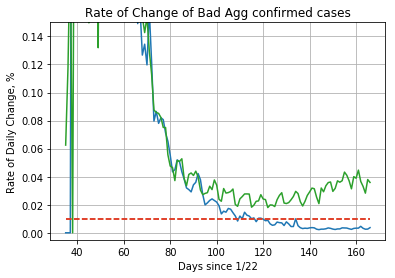

In [33]:
create_roc_graphs(df['Good_agg'], 'Good Agg')
create_roc_graphs(df['Bad_agg'], 'Bad Agg')
plt.grid()

# Plot US Regions

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


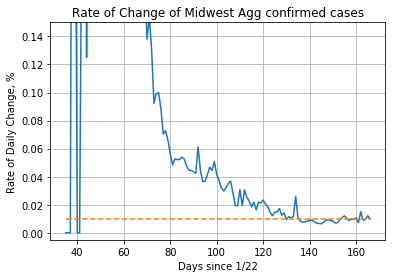

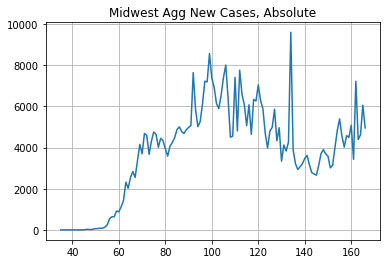

(         Midwest_agg    change
 1/22/20            0       NaN
 1/23/20            0       inf
 1/24/20            1  0.000000
 1/25/20            1  0.000000
 1/26/20            1  0.000000
 ...              ...       ...
 7/3/20        486427  0.009021
 7/4/20        490815  0.009411
 7/5/20        495434  0.012214
 7/6/20        501485  0.009873
 7/7/20        506436  0.000000
 
 [168 rows x 2 columns],
 array([   0,    1,    0,    0,    0,    0,    0,    0,    1,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    1,    1,    0,    0,    1,    3,
           1,    4,   28,   24,   14,   41,   59,   66,   85,   82,  134,
         249,  546,  641,  643,  920,  877, 1131, 1428, 2320, 2023, 2544,
        2833, 2551, 3353, 4154, 3694, 4682, 4588, 3669, 4305, 4758, 4641,
        4016, 4449, 4336, 3935, 3582, 4067, 4250, 4475, 4867, 5005, 477

In [34]:
y = aggregate_region(midwest)
new_col = [x[1].sum() for x in y.iterrows()]
df['Midwest_agg'] = new_col
create_roc_and_new_case_numbers(df['Midwest_agg'], 'Midwest Agg')

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


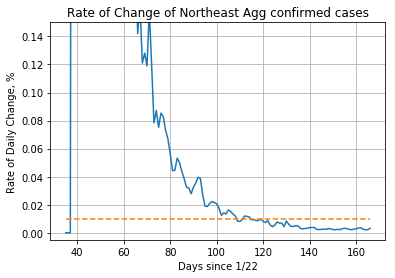

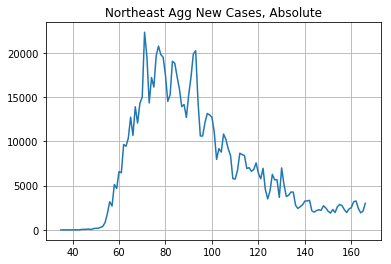

(         Northeast_agg    change
 1/22/20              0       NaN
 1/23/20              0       NaN
 1/24/20              0       NaN
 1/25/20              0       NaN
 1/26/20              0       NaN
 ...                ...       ...
 7/3/20          932563  0.002618
 7/4/20          935004  0.002072
 7/5/20          936941  0.002242
 7/6/20          939042  0.003195
 7/7/20          942042  0.000000
 
 [168 rows x 2 columns],
 array([    0,     0,     0,     0,     0,     0,     0,     0,     0,
            1,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     1,     3,     3,     9,    14,    11,    55,
           58,    79,    94,    53,   148,   184,   177,   285,   393,
          821,  1846,  3179,  2696,  5125,  4680,  6582,  6445,  9639,
         9441, 10348, 12726, 10664, 13895, 12059, 14307, 14986, 2230

In [35]:
y = aggregate_region(northeast)
new_col = [x[1].sum() for x in y.iterrows()]
df['Northeast_agg'] = new_col
create_roc_and_new_case_numbers(df['Northeast_agg'], 'Northeast Agg')

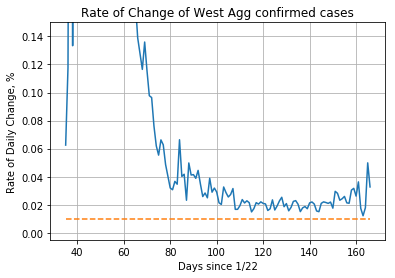

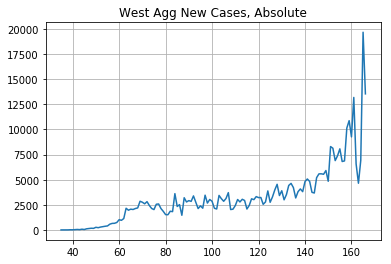

(         West_agg    change
 1/22/20         1  0.000000
 1/23/20         1  0.000000
 1/24/20         1  0.000000
 1/25/20         1  2.000000
 1/26/20         3  0.333333
 ...           ...       ...
 7/3/20     382969  0.012129
 7/4/20     387614  0.017840
 7/5/20     394529  0.049847
 7/6/20     414195  0.032680
 7/7/20     427731  0.000000
 
 [168 rows x 2 columns],
 array([    0,     0,     0,     2,     1,     0,     1,     0,     0,
            0,     0,     2,     0,     0,     0,     0,     0,     0,
            0,     1,     0,     1,     0,     0,     0,     0,     1,
            0,     0,     3,     0,     0,     1,     0,     2,     1,
            2,    11,     4,    17,    13,    26,    46,    29,    72,
           42,   111,   138,   167,   156,   261,   222,   285,   329,
          366,   398,   572,   649,   659,   740,  1016,   957,  1134,
         2158,  1961,  2065,  2032,  2131,  2188,  2852,  2755,  2598,
         2813,  2434,  2133,  2024,  2555,  2580,  2129, 

In [36]:
y = aggregate_region(west)
new_col = [x[1].sum() for x in y.iterrows()]
df['West_agg'] = new_col
create_roc_and_new_case_numbers(df['West_agg'], 'West Agg')

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


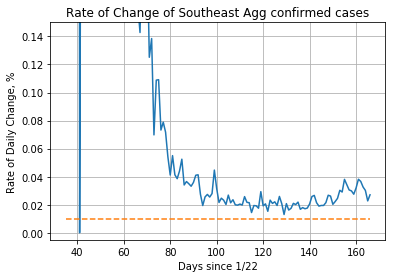

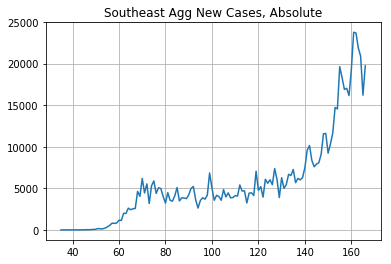

(         Southeast_agg    change
 1/22/20              0       NaN
 1/23/20              0       NaN
 1/24/20              0       NaN
 1/25/20              0       NaN
 1/26/20              0       NaN
 ...                ...       ...
 7/3/20          670203  0.032645
 7/4/20          692082  0.030190
 7/5/20          712976  0.022731
 7/6/20          729183  0.027066
 7/7/20          748919  0.000000
 
 [168 rows x 2 columns],
 array([    0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     1,     3,     0,     2,     4,     9,
            9,    32,    24,    41,    46,    77,   167,   131,   136,
          217,   361,   550,   810,   786,   833,  1162,  1140,  1996,
         1980,  2617,  2430,  2542,  2585,  4635,  4040,  6187,  444

In [37]:
y = aggregate_region(southeast)
new_col = [x[1].sum() for x in y.iterrows()]
df['Southeast_agg'] = new_col
create_roc_and_new_case_numbers(df['Southeast_agg'], 'Southeast Agg')

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


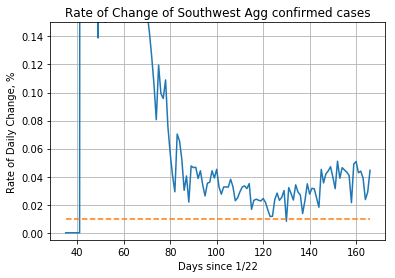

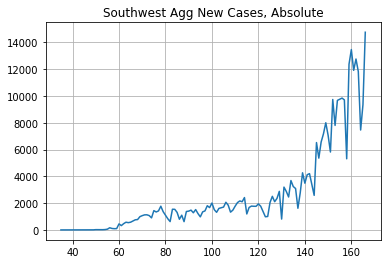

(         Southwest_agg    change
 1/22/20              0       NaN
 1/23/20              0       NaN
 1/24/20              0       NaN
 1/25/20              0       inf
 1/26/20              1  0.000000
 ...                ...       ...
 7/3/20          303217  0.039005
 7/4/20          315044  0.023686
 7/5/20          322506  0.029013
 7/6/20          331863  0.044488
 7/7/20          346627  0.000000
 
 [168 rows x 2 columns],
 array([    0,     0,     0,     1,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     3,     2,     7,
            3,     8,     5,     7,     5,    20,    19,    12,    17,
           27,    55,   161,   107,    92,    98,   450,   322,   467,
          575,   543,   577,   662,   755,   774,   990,  1066,  112

In [38]:
y = aggregate_region(southwest)
new_col = [x[1].sum() for x in y.iterrows()]
df['Southwest_agg'] = new_col
create_roc_and_new_case_numbers(df['Southwest_agg'], 'Southwest Agg')

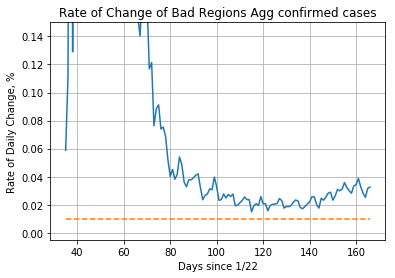

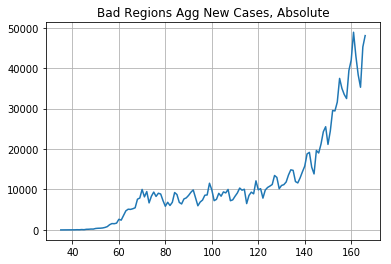

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


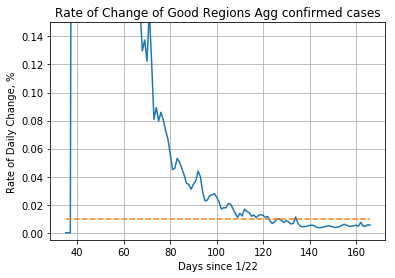

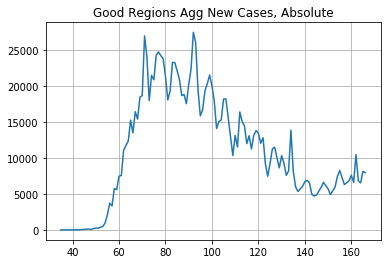

(         Good_regions_agg    change
 1/22/20                 0       NaN
 1/23/20                 0       inf
 1/24/20                 1  0.000000
 1/25/20                 1  0.000000
 1/26/20                 1  0.000000
 ...                   ...       ...
 7/3/20            1418990  0.004813
 7/4/20            1425819  0.004598
 7/5/20            1432375  0.005691
 7/6/20            1440527  0.005520
 7/7/20            1448478  0.000000
 
 [168 rows x 2 columns],
 array([    0,     1,     0,     0,     0,     0,     0,     0,     1,
            1,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     2,     4,     3,     9,    15,    14,    56,
           62,   107,   118,    67,   189,   243,   243,   370,   475,
          955,  2095,  3725,  3337,  5768,  5600,  7459,  7576, 11067,
        11761, 12371, 15270, 134

In [39]:
y = aggregate_region(southwest + southeast + west)
new_col = [x[1].sum() for x in y.iterrows()]
df['Bad_regions_agg'] = new_col
create_roc_and_new_case_numbers(df['Bad_regions_agg'], 'Bad Regions Agg')

y = aggregate_region(midwest + northeast)
new_col = [x[1].sum() for x in y.iterrows()]
df['Good_regions_agg'] = new_col
create_roc_and_new_case_numbers(df['Good_regions_agg'], 'Good Regions Agg')


## Classifying states based on growth since first 10% of cumulative cases

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


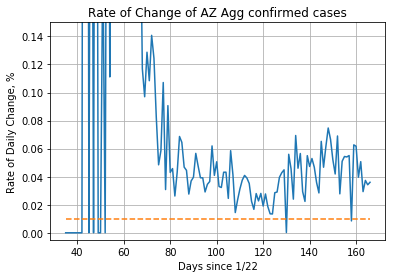

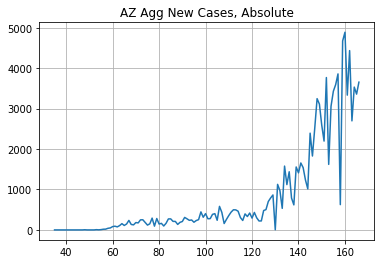

AZ is a mess


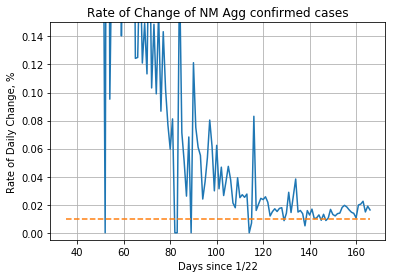

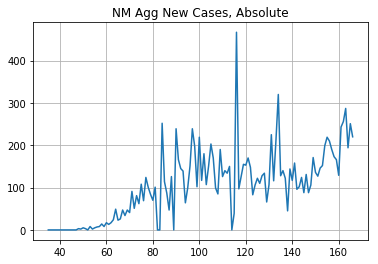

NM is a do-gooder


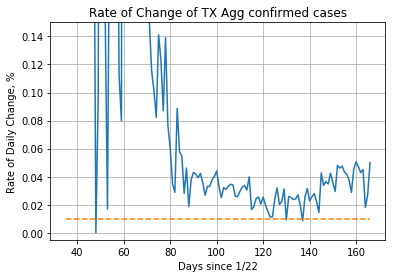

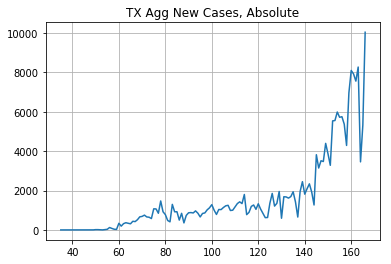

TX is a mess


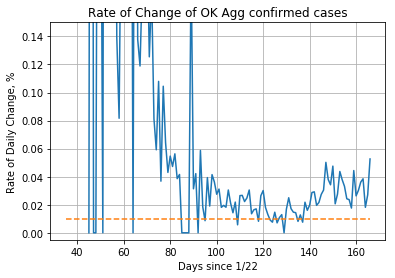

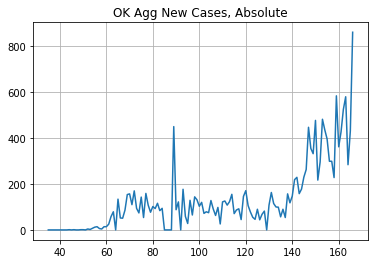

OK is a mess


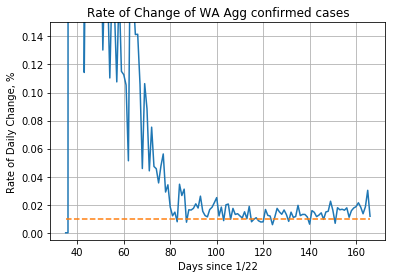

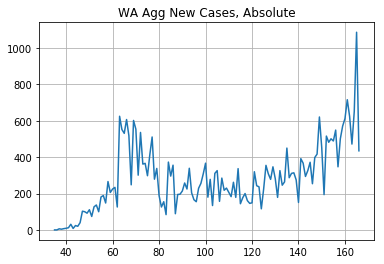

WA is a mess


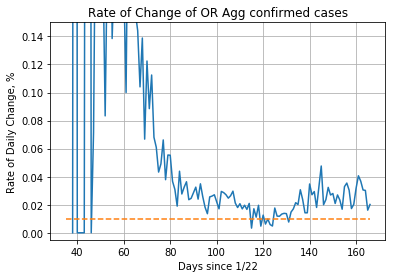

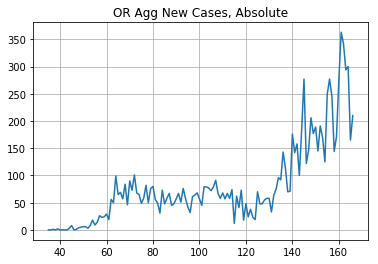

OR is a mess


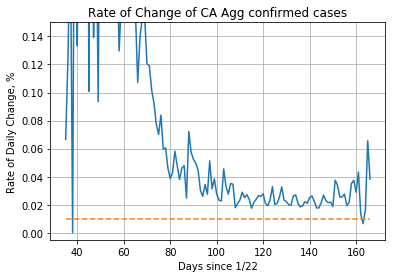

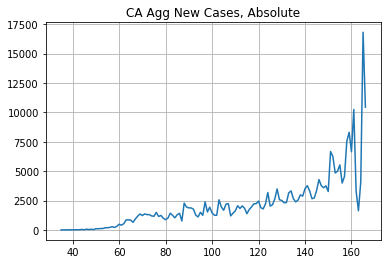

CA is a mess


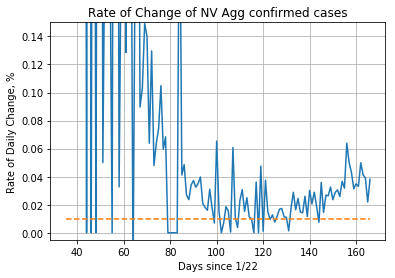

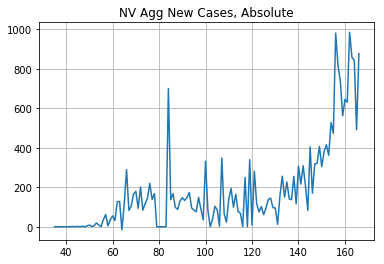

NV is a mess


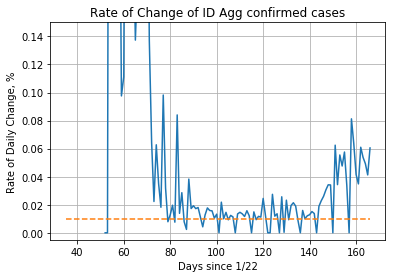

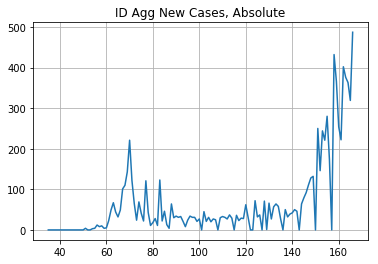

ID is a mess


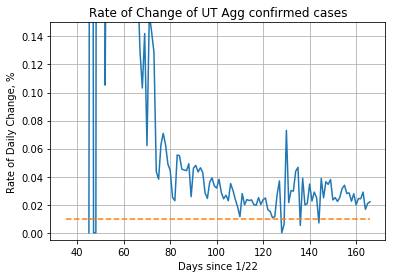

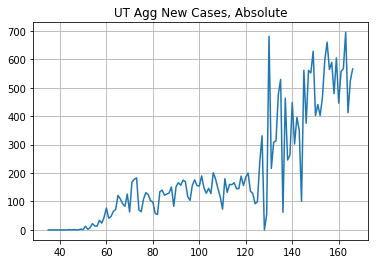

UT is a mess


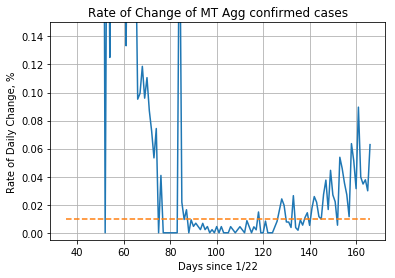

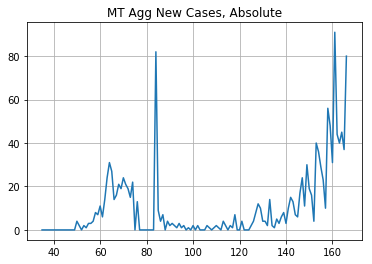

MT is a mess


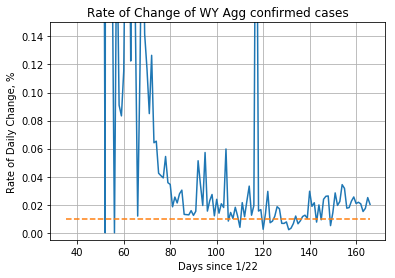

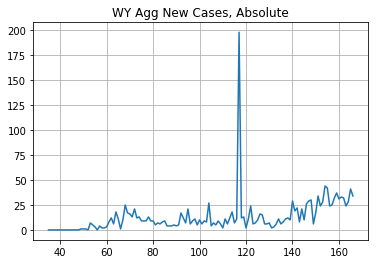

WY is a mess


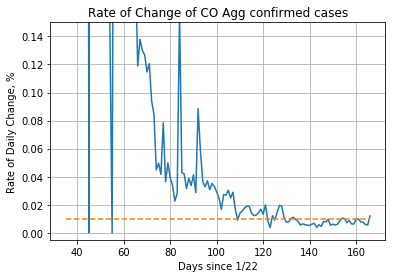

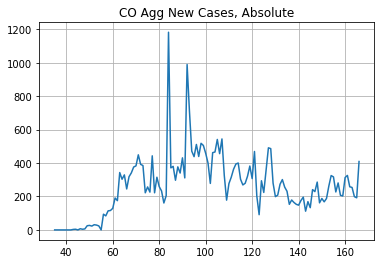

CO is a do-gooder


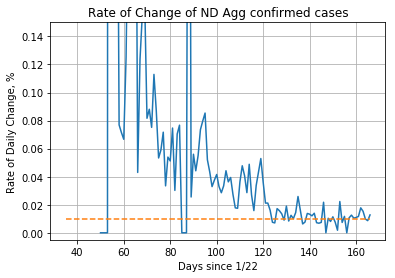

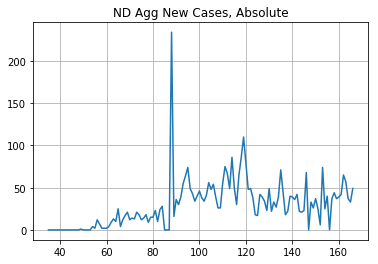

ND is a do-gooder


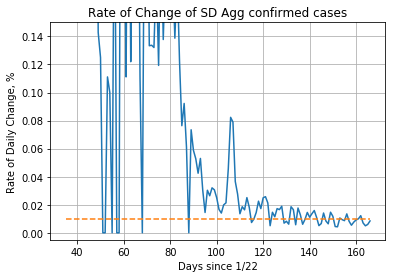

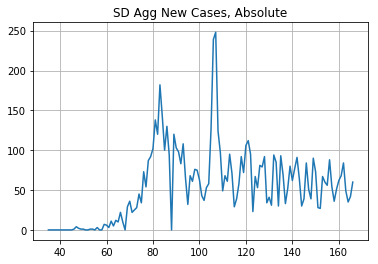

SD is a do-gooder


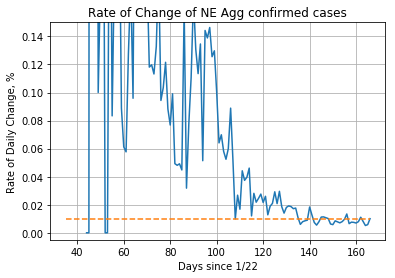

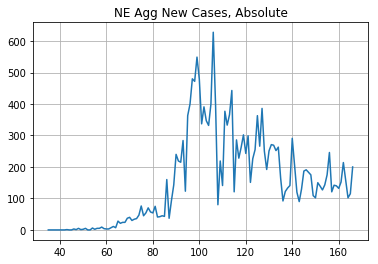

NE is a do-gooder


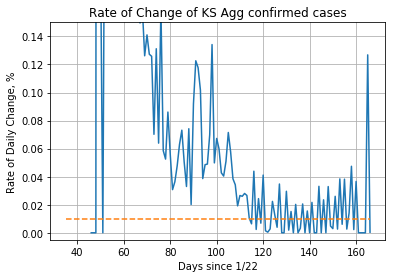

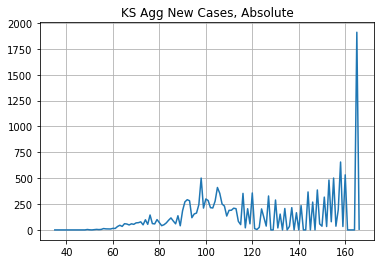

KS is neutral


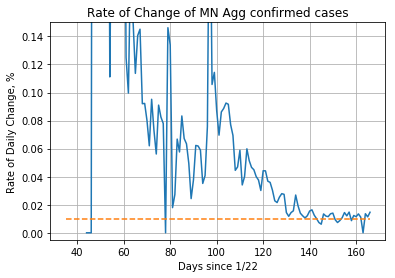

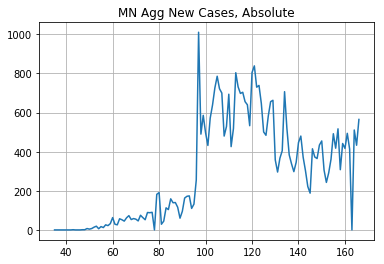

MN is a do-gooder


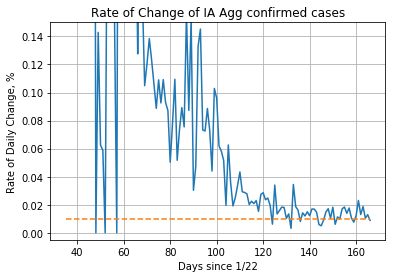

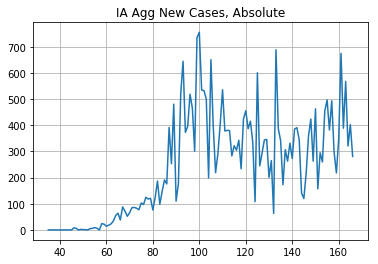

IA is a do-gooder


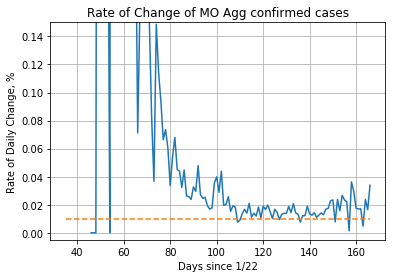

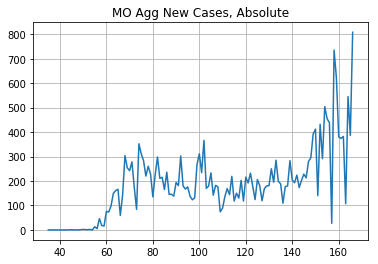

MO is a mess


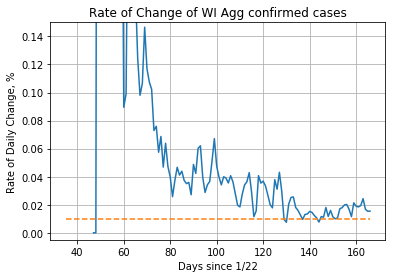

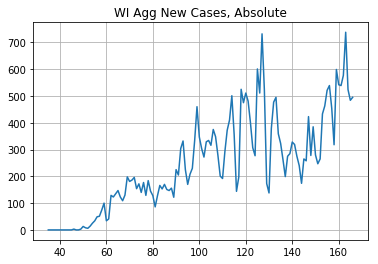

WI is a mess


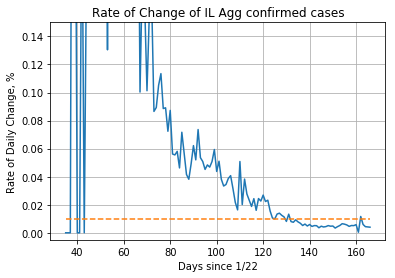

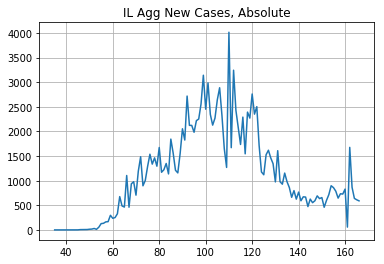

IL is a do-gooder


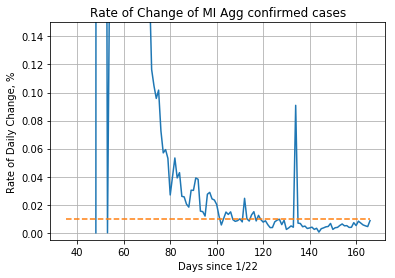

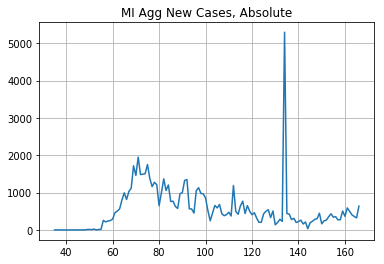

MI is a do-gooder


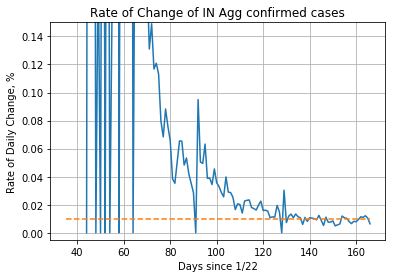

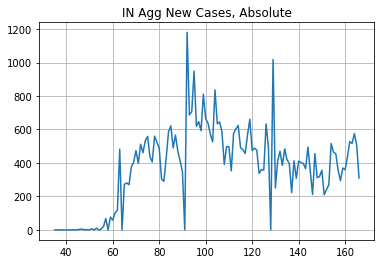

IN is a do-gooder


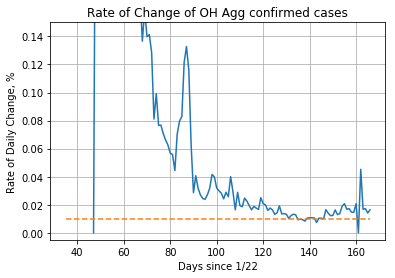

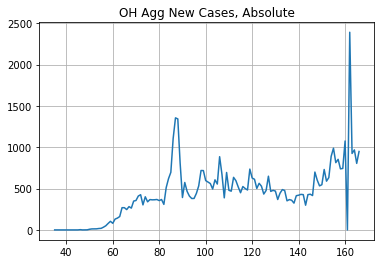

OH is neutral


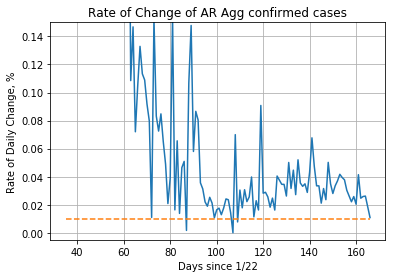

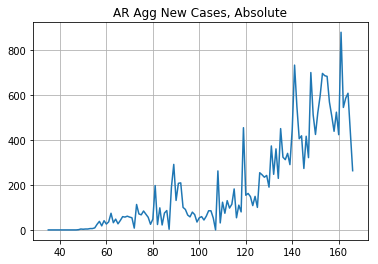

AR is a mess


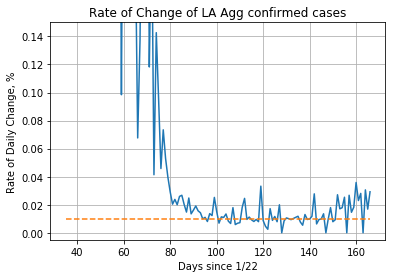

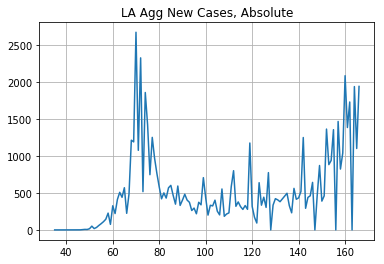

LA is a do-gooder


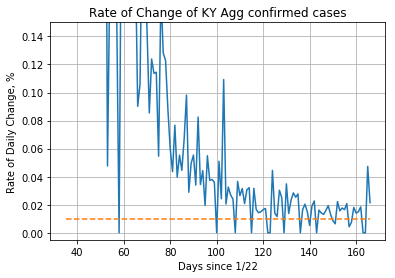

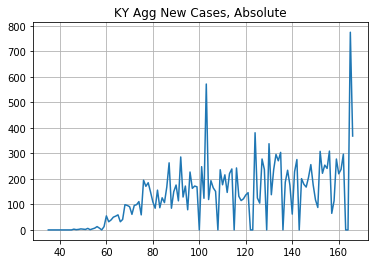

KY is a mess


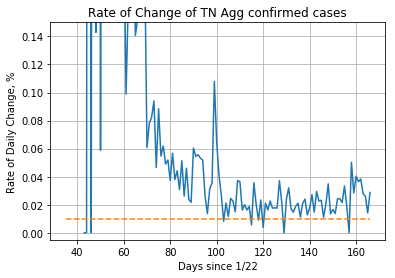

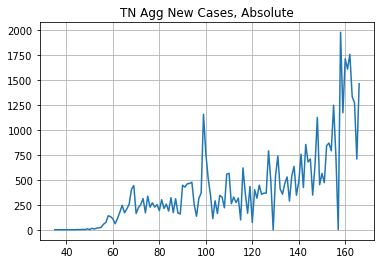

TN is a mess


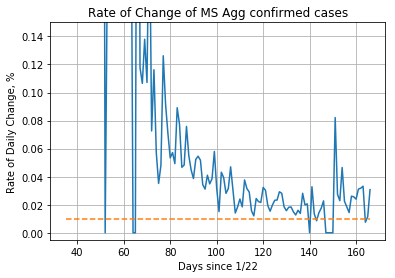

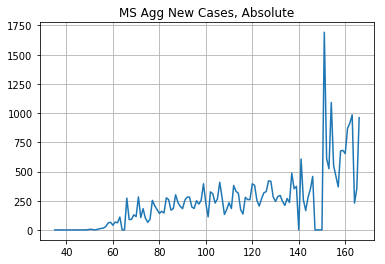

MS is a mess


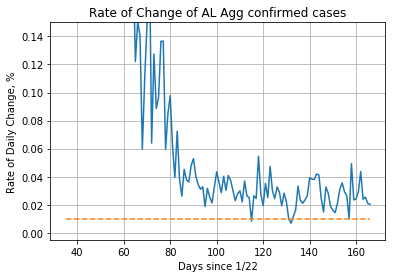

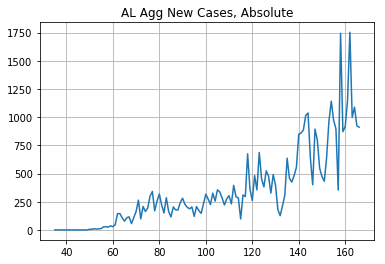

AL is a mess


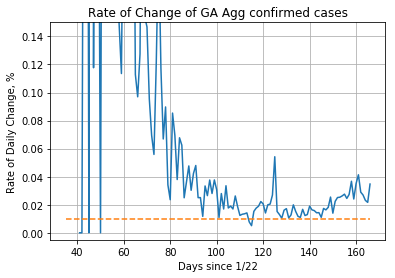

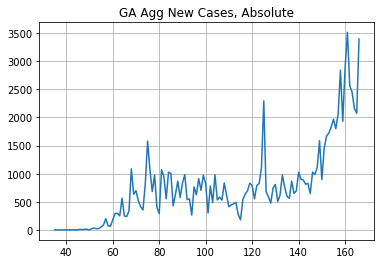

GA is a mess


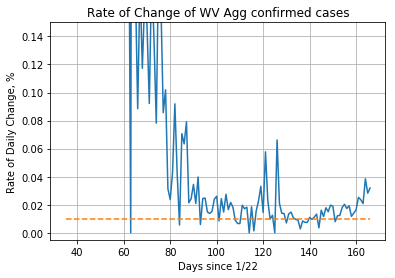

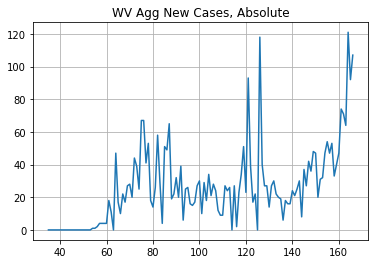

WV is a mess


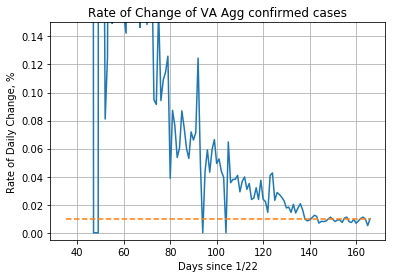

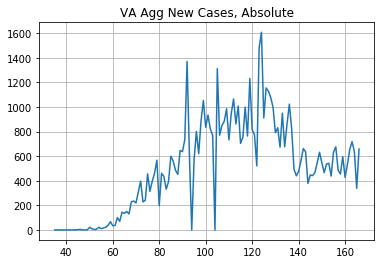

VA is a do-gooder


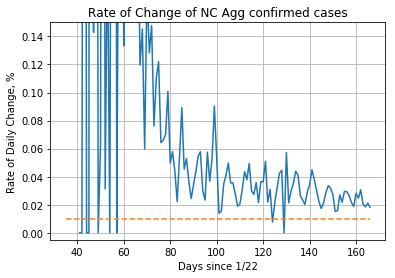

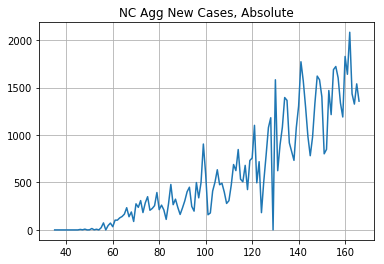

NC is a mess


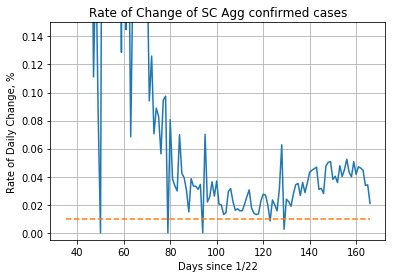

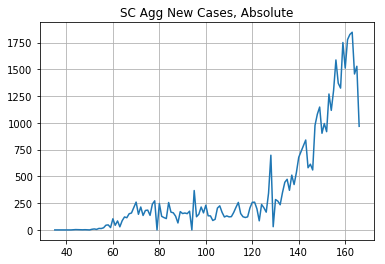

SC is a mess


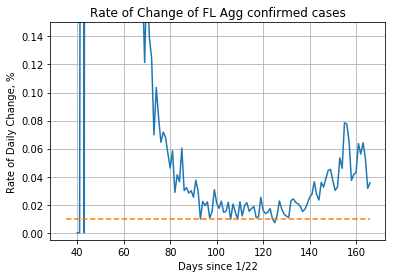

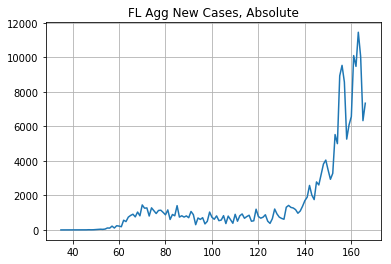

FL is a mess


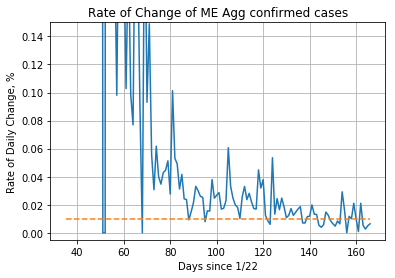

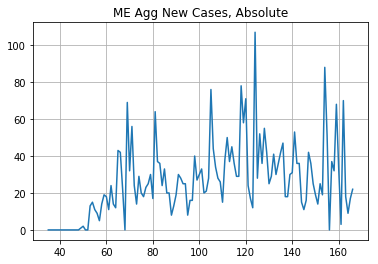

ME is a do-gooder


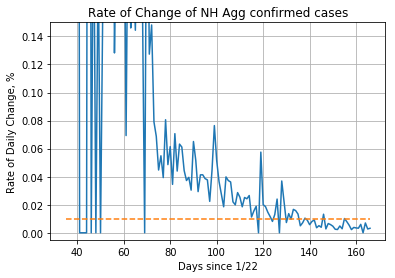

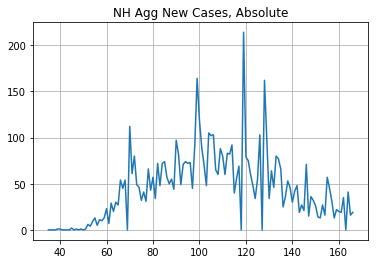

NH is a do-gooder


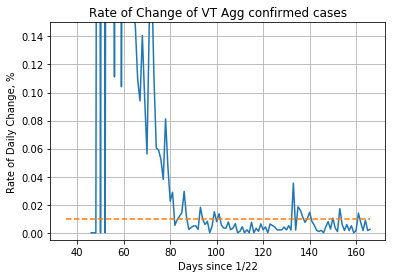

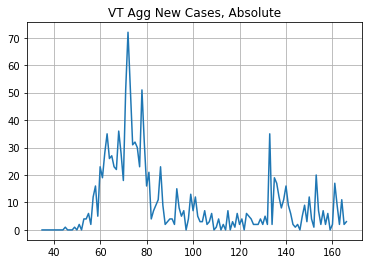

VT is a do-gooder


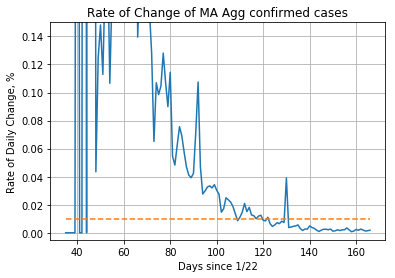

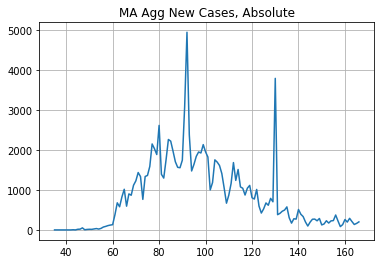

MA is a do-gooder


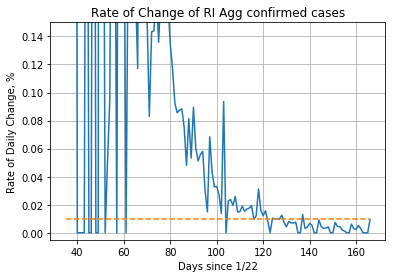

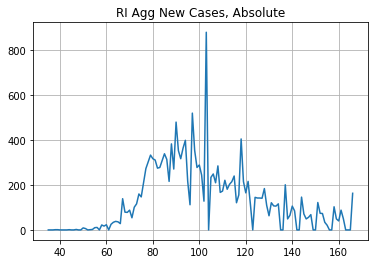

RI is a do-gooder


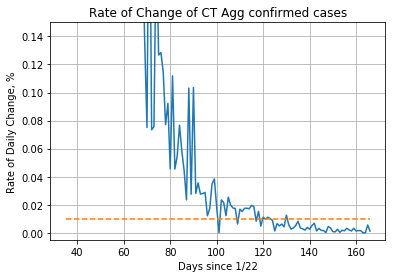

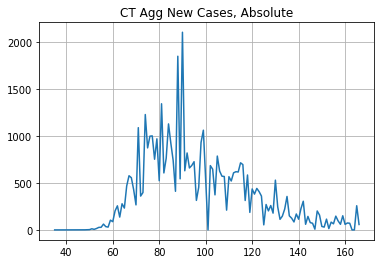

CT is a do-gooder


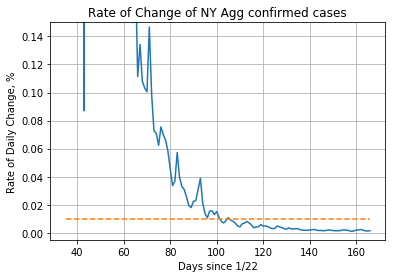

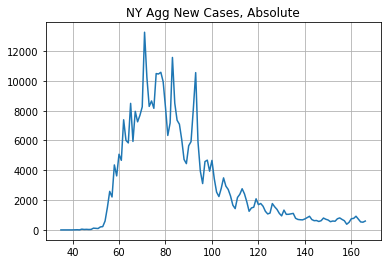

NY is a do-gooder


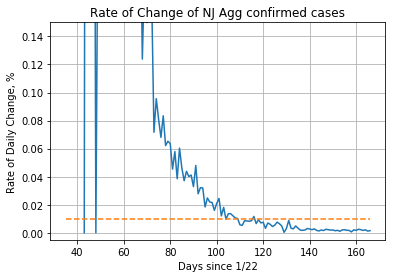

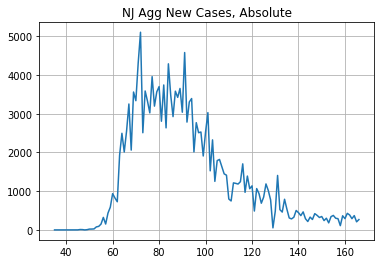

NJ is a do-gooder


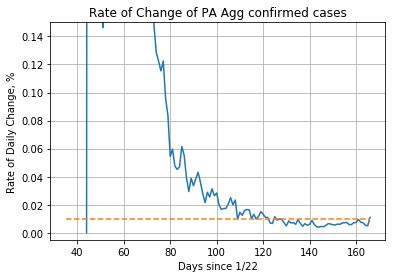

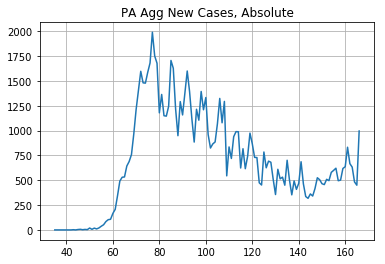

PA is a do-gooder


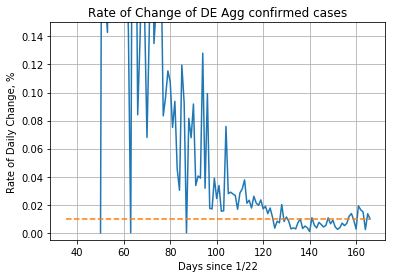

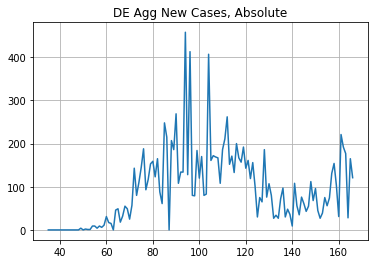

DE is a do-gooder


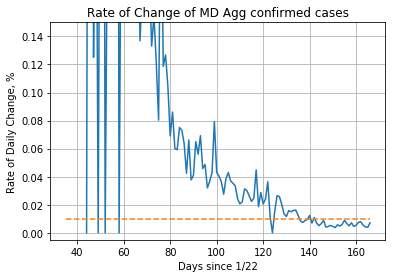

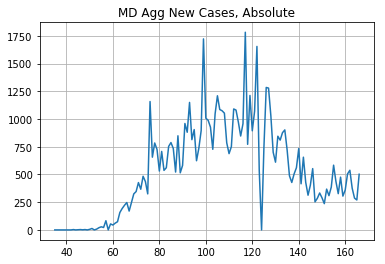

MD is a do-gooder


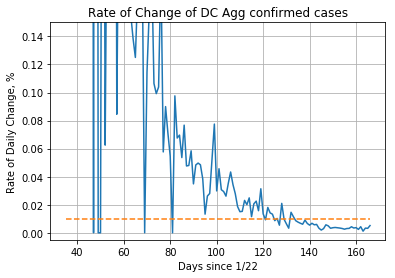

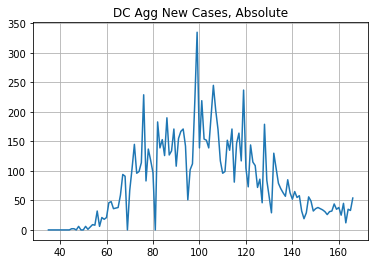

DC is a do-gooder


In [40]:
d1, d2 = create_classes(state_list)

In [41]:
d2

{'neg_diff': [61842,
  106988,
  6944,
  4316,
  3952,
  104908,
  10443,
  4418,
  11400,
  558,
  296,
  4236,
  4731,
  12606,
  2225,
  17321,
  7498,
  17398,
  32177,
  463,
  28319,
  28314,
  130911],
 'pos_diff': [-824,
  7204,
  583,
  1274,
  5573,
  7966,
  2709,
  52048,
  23179,
  7044,
  -6725,
  6857,
  -202,
  1318,
  468,
  58094,
  8961,
  26458,
  257254,
  105444,
  29449,
  3878,
  17278,
  4120],
 'neg': [4.779380309234248,
  3.592517204613744,
  2.636192271442036,
  1.2941457098071287,
  2.4149659863945576,
  2.4063865726465936,
  2.9186110600771635,
  3.733910891089109,
  2.892116182572614,
  2.7222222222222223,
  1.4828711256117455,
  1.4794567062818336,
  1.3864564613625225,
  3.7086377309841,
  1.3307566522967147,
  2.1626392804403274,
  1.7021914216145346,
  2.4701706946087545,
  2.0954245250902157,
  1.3580819798917247,
  2.423995574998743,
  5.004242681374628,
  5.274086649906951],
 'pos': [0.8727806083063147,
  1.60701044826424,
  1.3990417522245038,
  1

In [42]:
all_ratios2 = d2['pos']
all_ratios2.extend(d2['neg'])
all_ratios2.extend(d2['neutral'])


c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


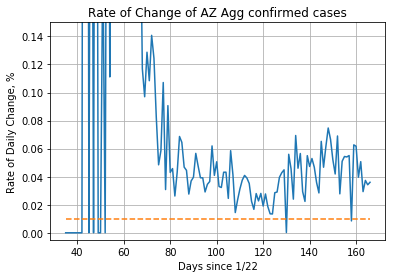

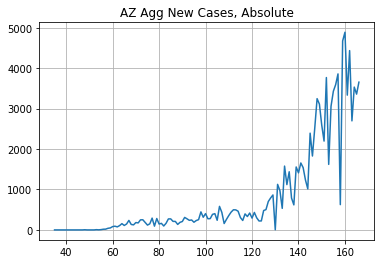

AZ is a mess


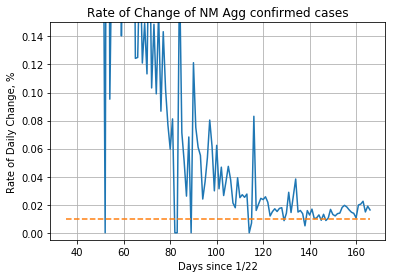

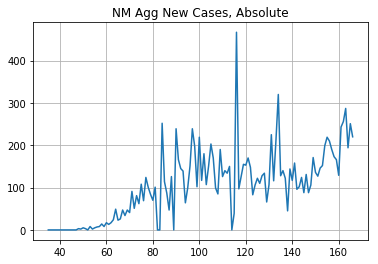

NM is kinda good


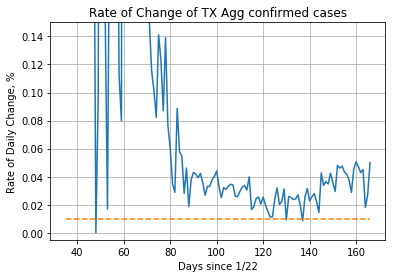

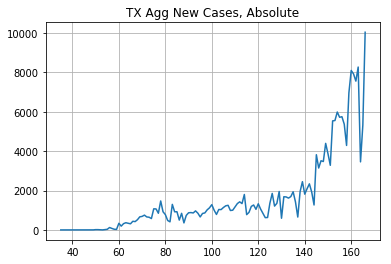

TX is a mess


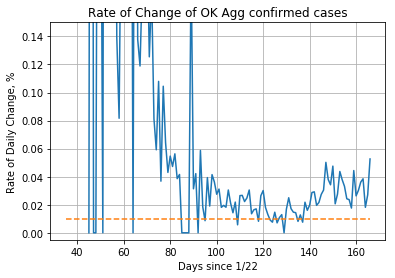

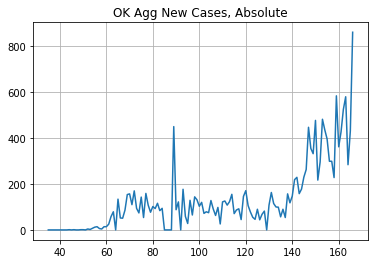

OK is a mess


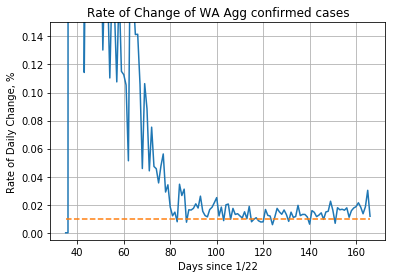

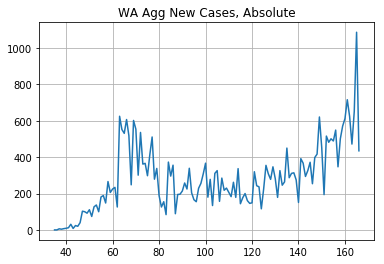

WA is kinda bad


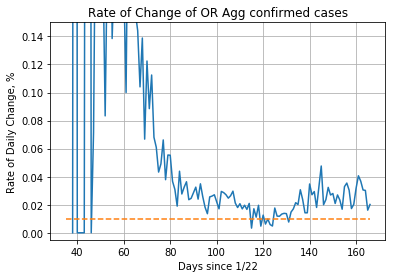

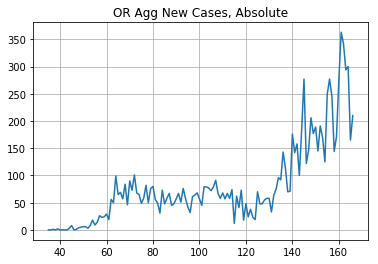

OR is a mess


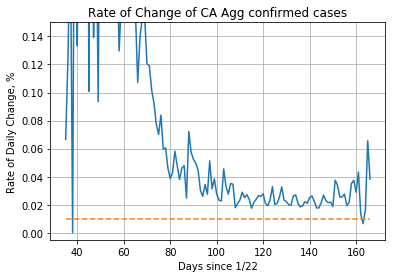

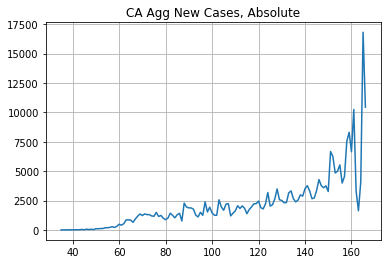

CA is a mess


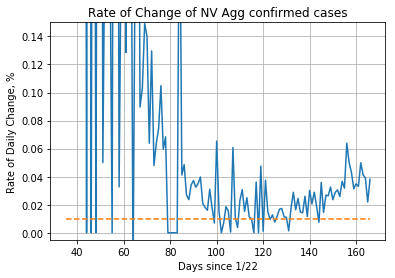

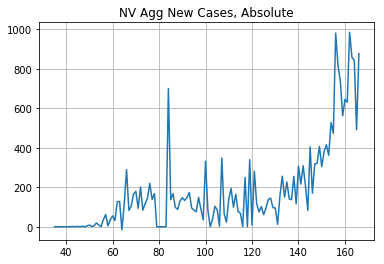

NV is a mess


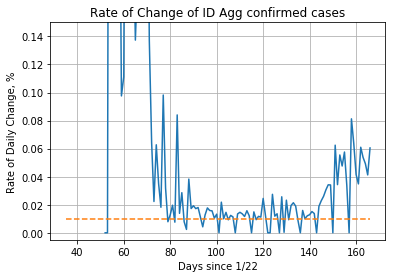

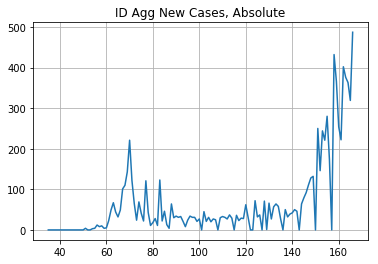

ID is a mess


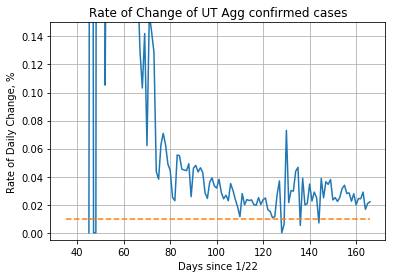

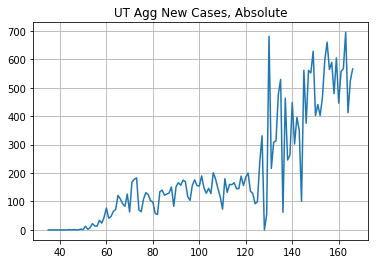

UT is a mess


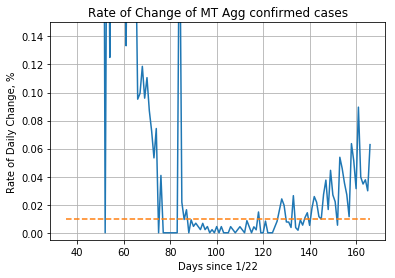

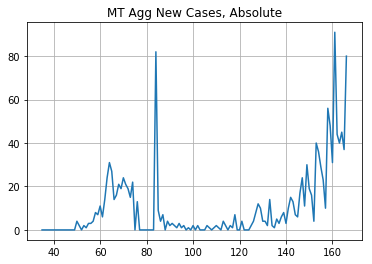

MT is a mess


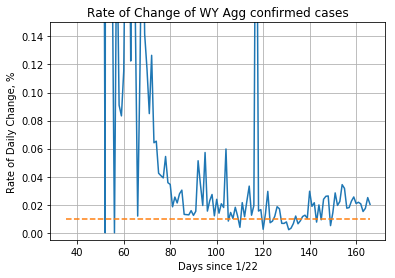

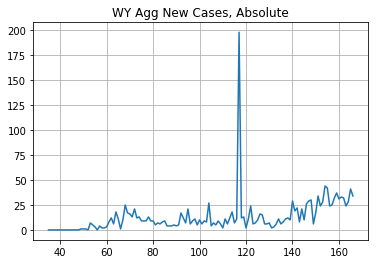

WY is kinda bad


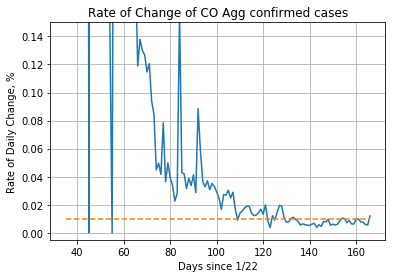

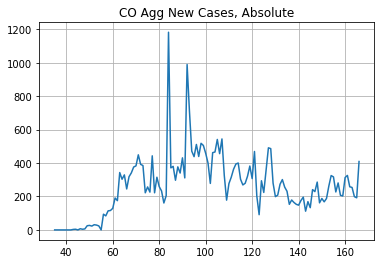

CO is kinda good


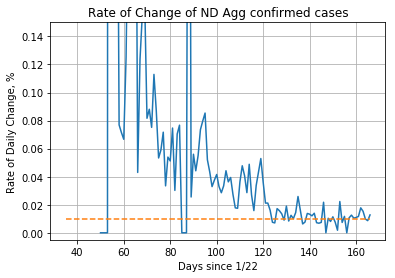

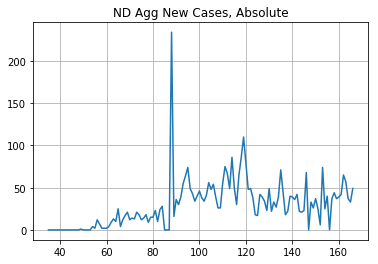

ND is kinda good


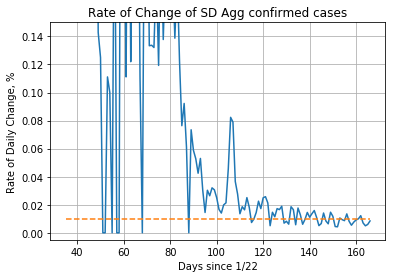

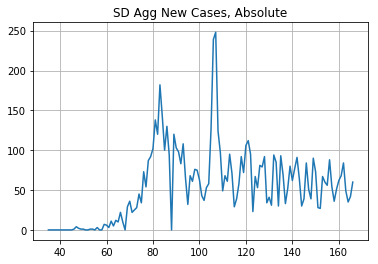

SD is kinda good


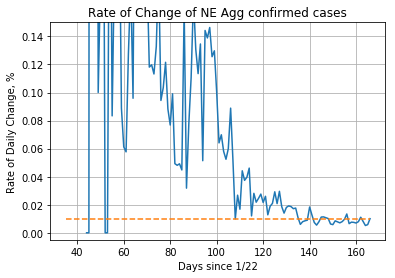

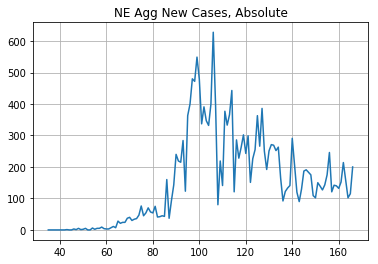

NE is kinda good


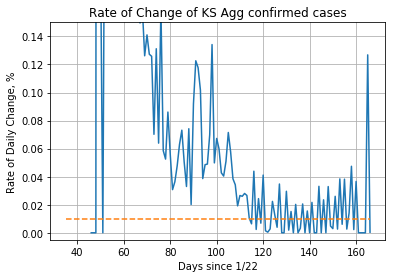

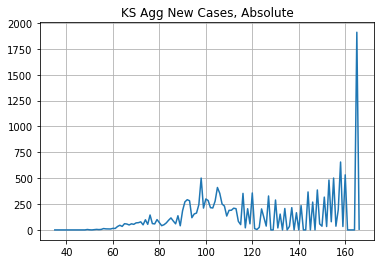

KS is neutral


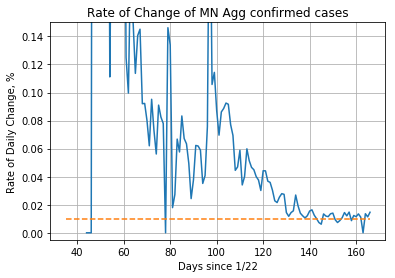

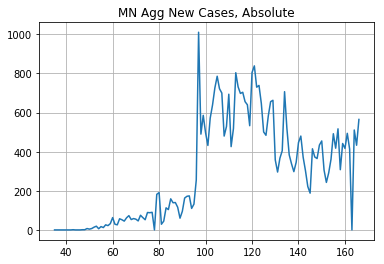

MN is kinda good


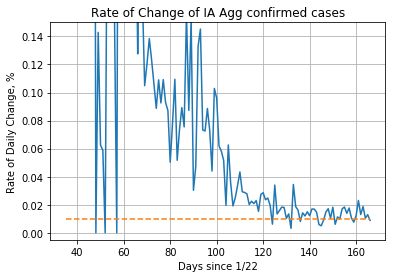

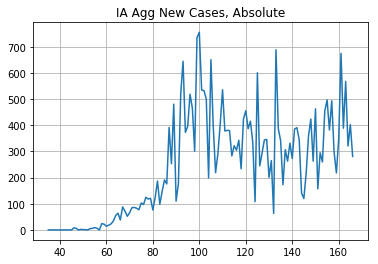

IA is kinda good


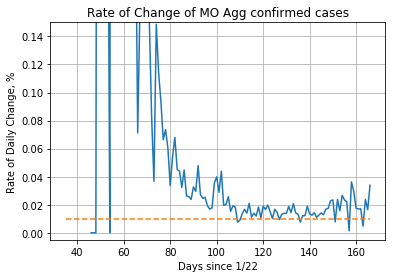

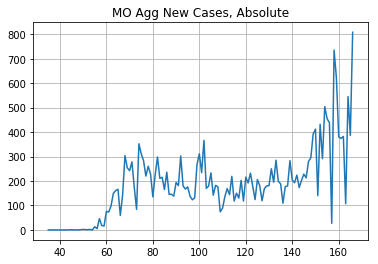

MO is kinda bad


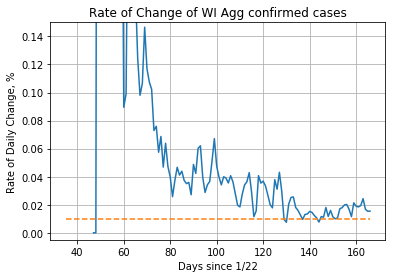

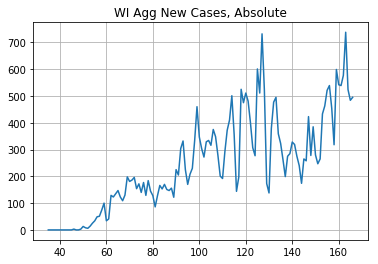

WI is kinda bad


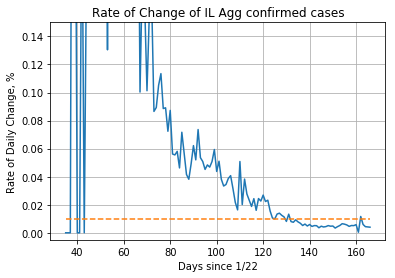

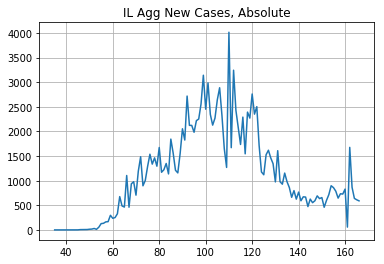

IL is a do-gooder


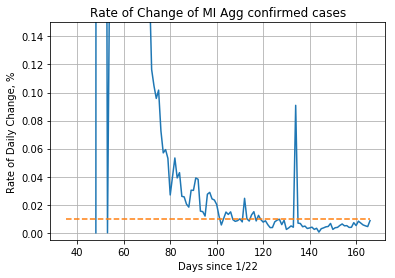

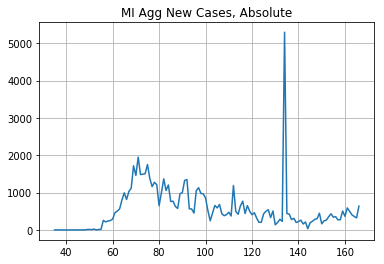

MI is kinda good


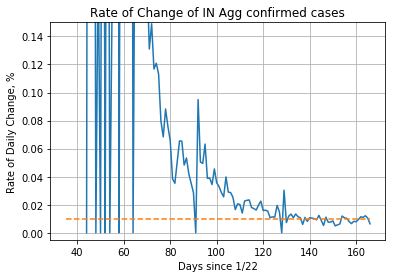

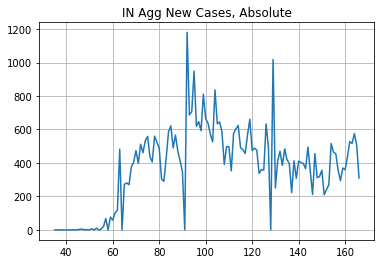

IN is kinda good


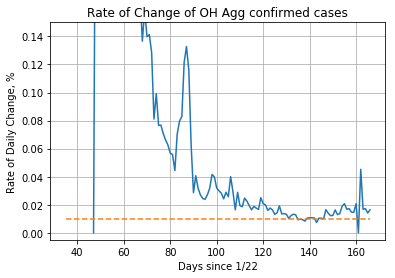

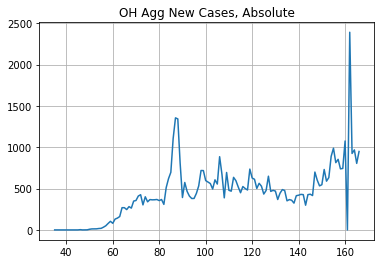

OH is neutral


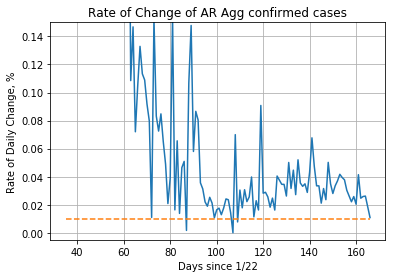

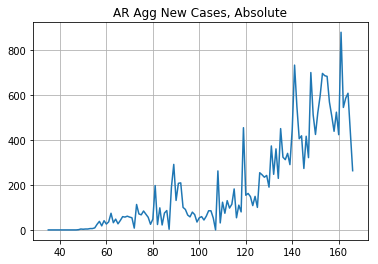

AR is a mess


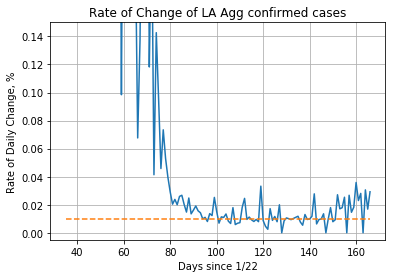

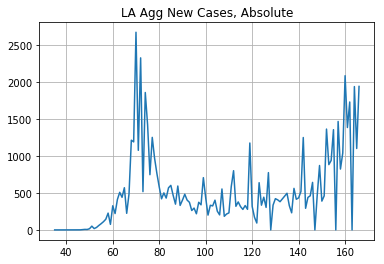

LA is kinda good


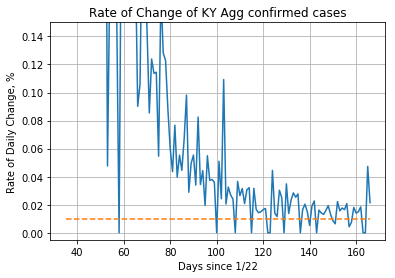

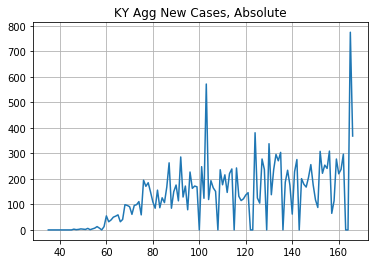

KY is kinda bad


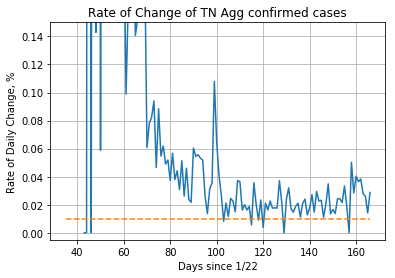

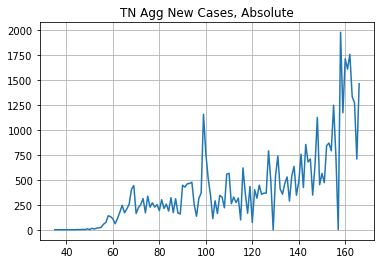

TN is a mess


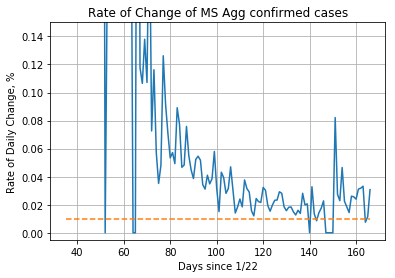

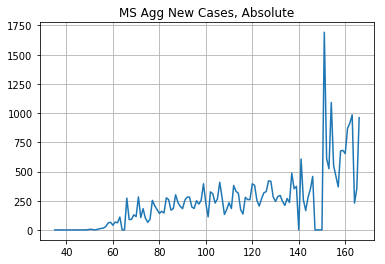

MS is kinda bad


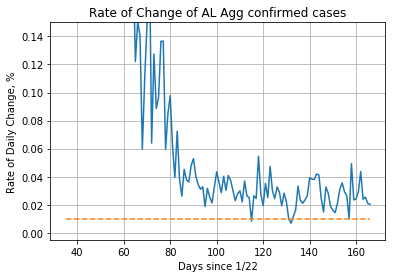

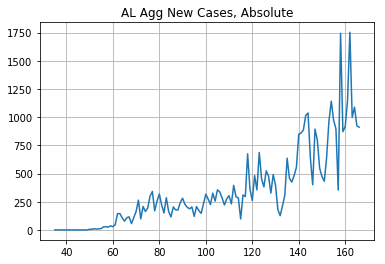

AL is a mess


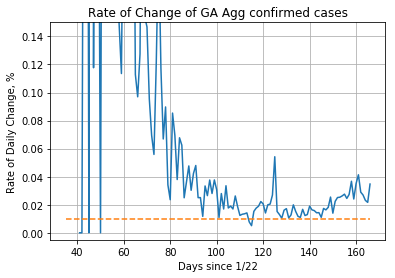

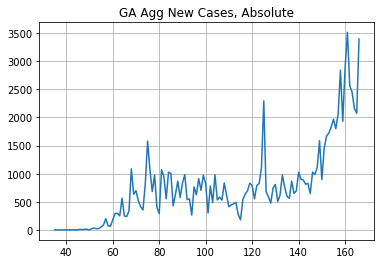

GA is kinda bad


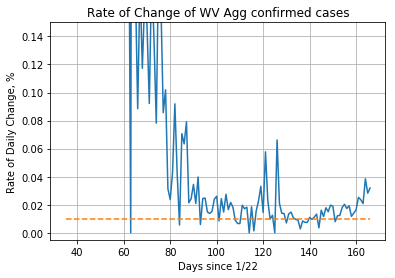

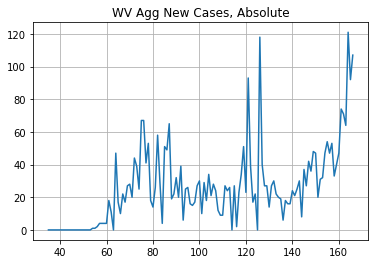

WV is kinda bad


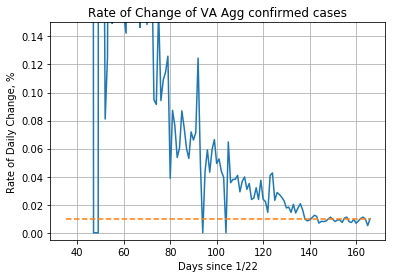

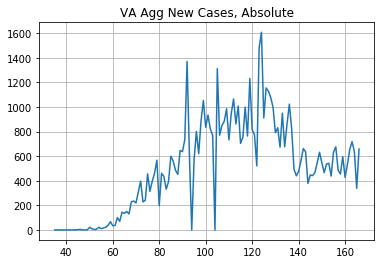

VA is kinda good


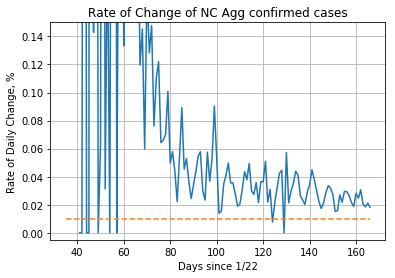

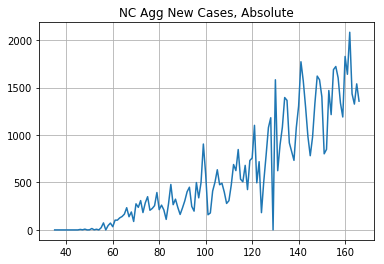

NC is a mess


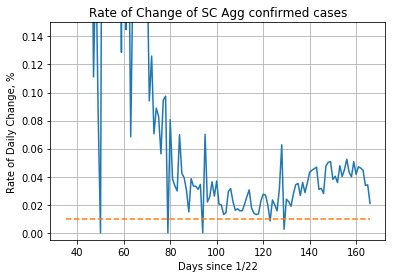

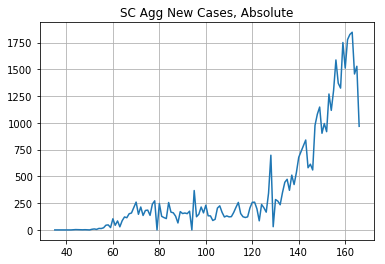

SC is a mess


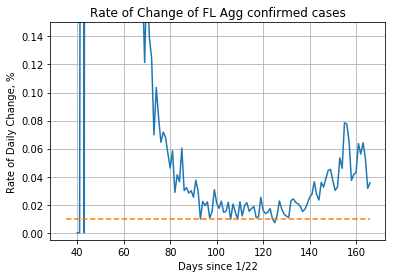

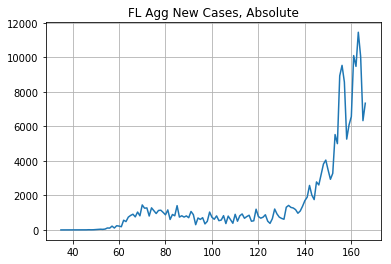

FL is a mess


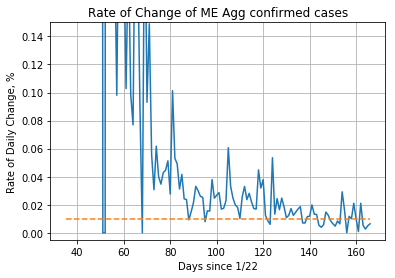

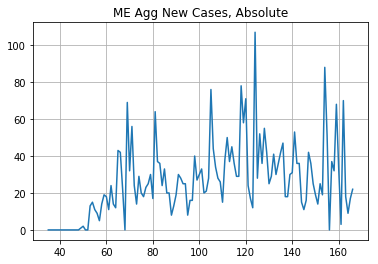

ME is kinda good


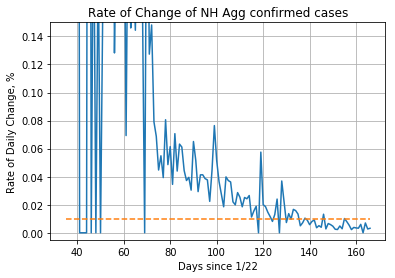

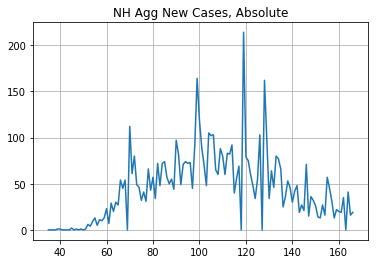

NH is kinda good


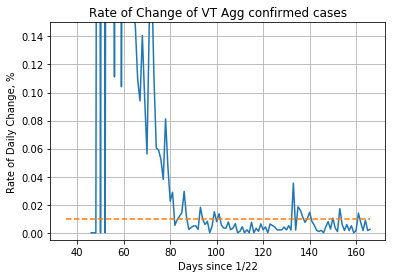

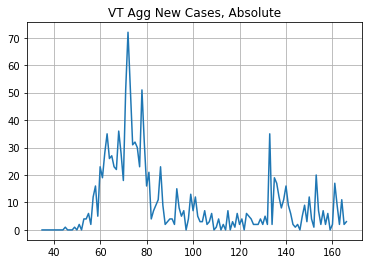

VT is a do-gooder


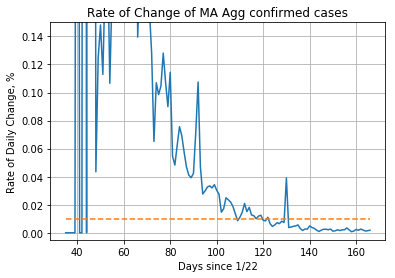

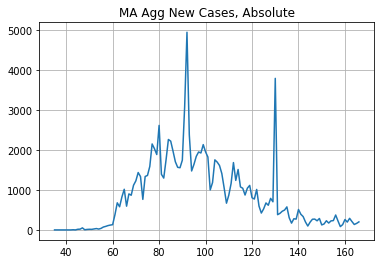

MA is a do-gooder


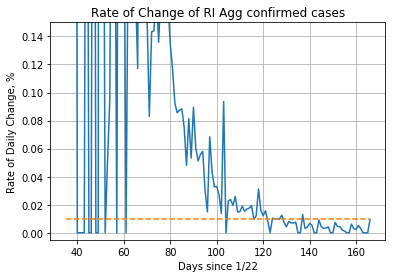

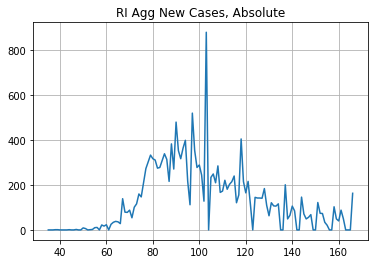

RI is a do-gooder


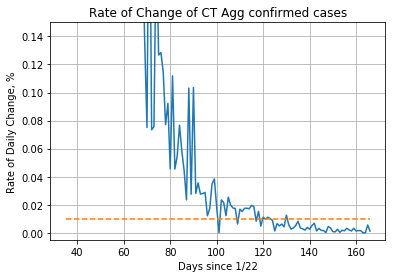

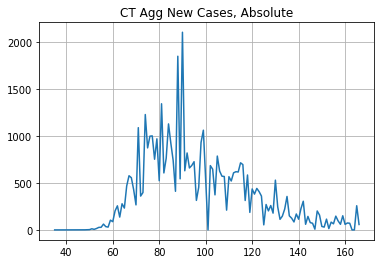

CT is a do-gooder


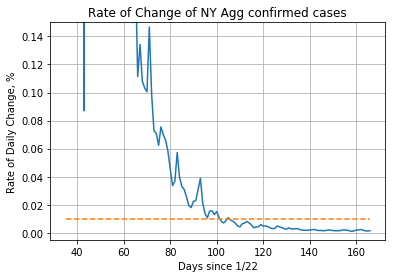

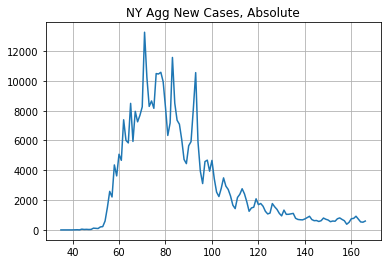

NY is a do-gooder


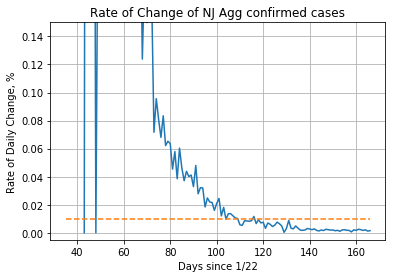

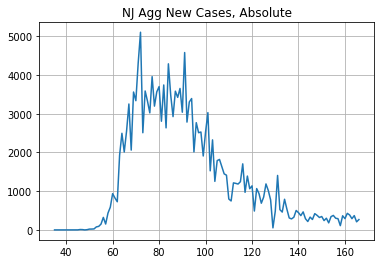

NJ is a do-gooder


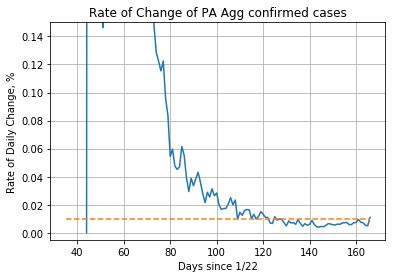

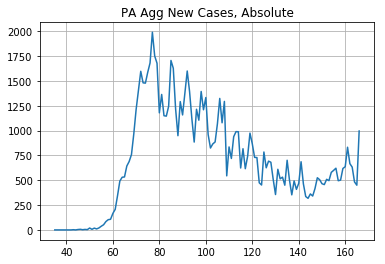

PA is a do-gooder


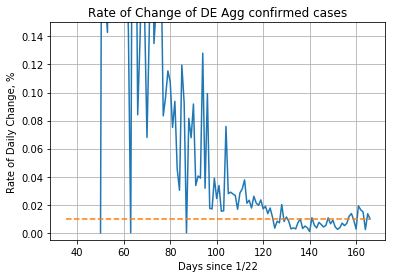

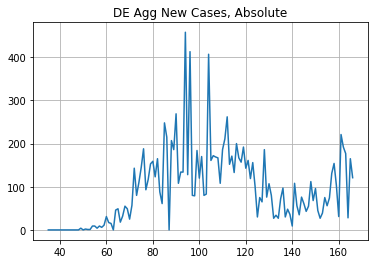

DE is kinda good


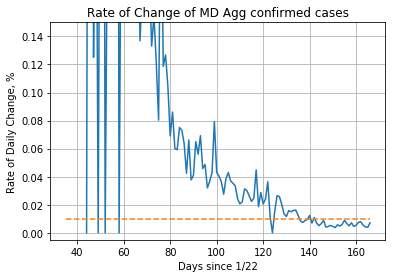

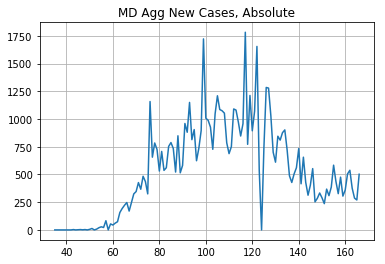

MD is kinda good


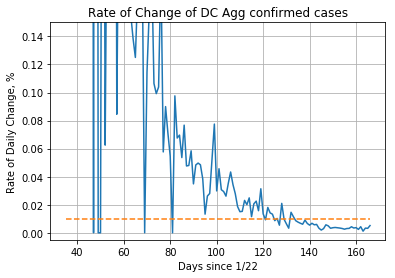

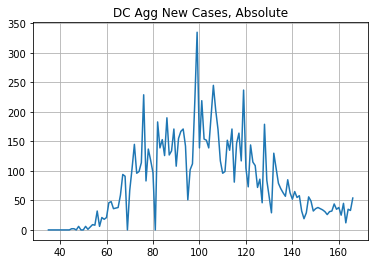

DC is a do-gooder


In [43]:


d1, d2 = create_classes2(state_list)

In [44]:
all_ratios2 = d2['pos']
all_ratios2.extend(d2['neg'])
all_ratios2.extend(d2['neutral'])

# states_dict = {'good': ['MN','IL',
#    'MI','NE','KS','CT','DC','DE','MA','NJ','NY','PA','RI','VT'],
#   'bad': ['AZ', 'TX', 'CA', 'UT', 'WY', 'FL', 'AR', 'AL', 'SC', 
#           'NC'],
#   'neutral': ['NM', 'WA', 'MO', 'KY', 'VA', 'WV'],
#   'k_good': ['ID', 'MT', 'CO', 'ND', 'SD', 'IA', 'IN', 'OH', 
#              'LA', 'MD', 'NH'],
#   'k_bad': ['OK', 'OR', 'NV', 'WI', 'MS', 'GA', 'TN', 'ME']}
states_dict = d1
d1, d2

({'good': ['IL', 'VT', 'MA', 'RI', 'CT', 'NY', 'NJ', 'PA', 'DC'],
  'bad': ['AZ',
   'TX',
   'OK',
   'OR',
   'CA',
   'NV',
   'ID',
   'UT',
   'MT',
   'AR',
   'TN',
   'AL',
   'NC',
   'SC',
   'FL'],
  'neutral': ['KS', 'OH'],
  'k_good': ['NM',
   'CO',
   'ND',
   'SD',
   'NE',
   'MN',
   'IA',
   'MI',
   'IN',
   'LA',
   'VA',
   'ME',
   'NH',
   'DE',
   'MD'],
  'k_bad': ['WA', 'WY', 'MO', 'WI', 'KY', 'MS', 'GA', 'WV']},
 {'neg_diff': [61842,
   106988,
   6944,
   4316,
   3952,
   104908,
   10443,
   4418,
   11400,
   558,
   296,
   4236,
   4731,
   12606,
   2225,
   17321,
   7498,
   17398,
   32177,
   463,
   28319,
   28314,
   130911],
  'pos_diff': [-824,
   7204,
   583,
   1274,
   5573,
   7966,
   2709,
   52048,
   23179,
   7044,
   -6725,
   6857,
   -202,
   1318,
   468,
   58094,
   8961,
   26458,
   257254,
   105444,
   29449,
   3878,
   17278,
   4120],
  'neg': [4.779380309234248,
   3.592517204613744,
   2.636192271442036,
   1.29414570

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


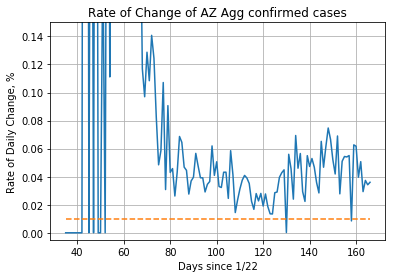

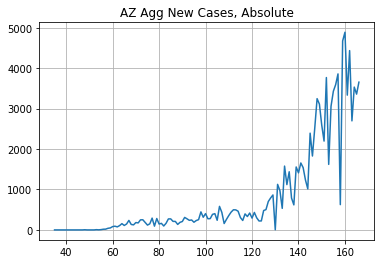

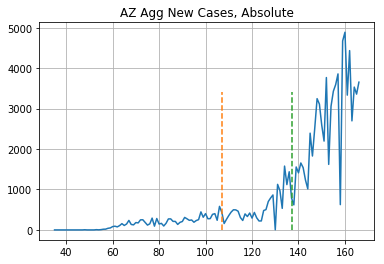

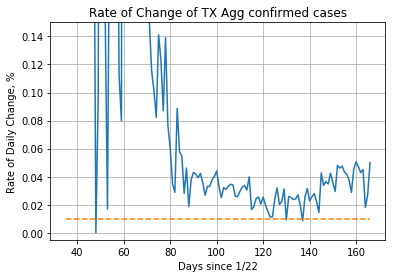

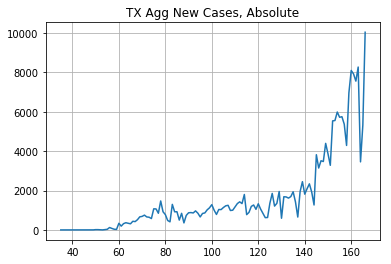

...

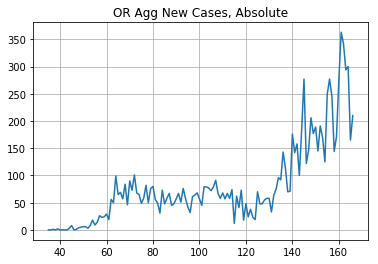

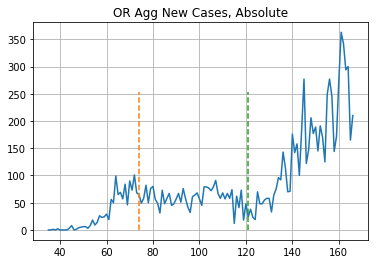

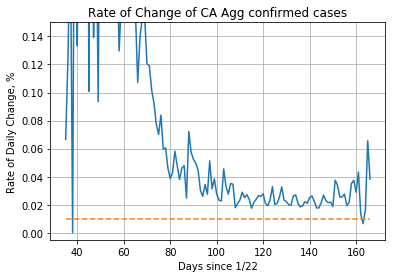

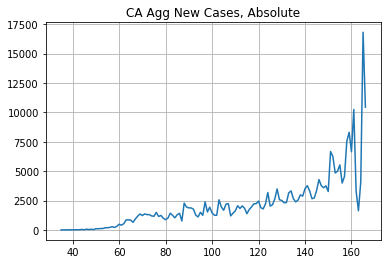

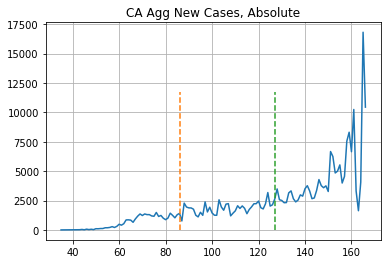

In [45]:

for state in d1['bad'][:5]:
    plt.close()
    y = single_state(state)
    new_col = [x[1].sum() for x in y.iterrows()]
    df['{}_agg'.format(state)] = new_col
    x = create_roc_and_new_case_numbers(df['{}_agg'.format(state)], '{} Agg'.format(state))
    initial_pptn = 0.1
    thresh_date = x[0]['{}_agg'.format(state)][x[0]['{}_agg'.format(state)] > x[0]['{}_agg'.format(state)].iloc[-1] * initial_pptn].index[0]
    thresh_idx = list(df.index).index(thresh_date)
    mid = thresh_idx + (df.shape[0] - thresh_idx) // 2
    mid
    lHalf = x[1][thresh_idx:mid].sum()
    rHalf = x[1][mid:].sum()
    # print(rHalf)
    # print(lHalf)
    create_new_case_graphs(df['{}_agg'.format(state)], '{} Agg'.format(state))
    plt.plot([thresh_idx, thresh_idx], [0, np.max(x[1])*.7], linestyle='dashed')
    plt.plot([mid, mid], [0, np.max(x[1])*.7], linestyle='dashed')
    plt.show()

['IL', 'VT', 'MA', 'RI', 'CT', 'NY', 'NJ', 'PA', 'DC']


c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


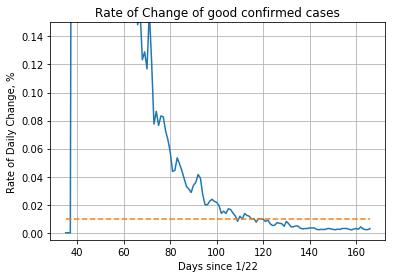

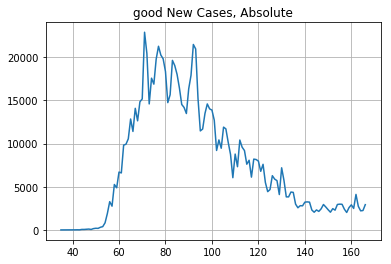


['AZ', 'TX', 'OK', 'OR', 'CA', 'NV', 'ID', 'UT', 'MT', 'AR', 'TN', 'AL', 'NC', 'SC', 'FL']


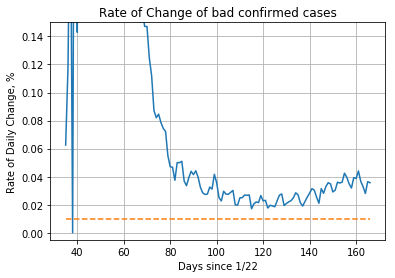

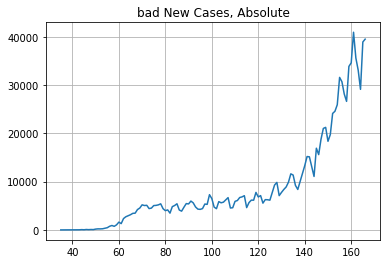


['KS', 'OH']


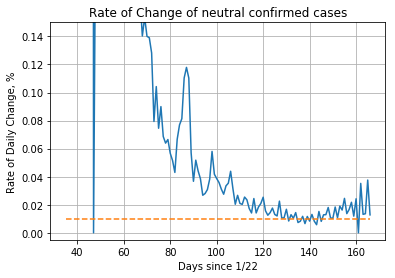

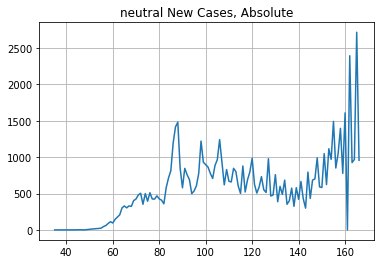


['NM', 'CO', 'ND', 'SD', 'NE', 'MN', 'IA', 'MI', 'IN', 'LA', 'VA', 'ME', 'NH', 'DE', 'MD']


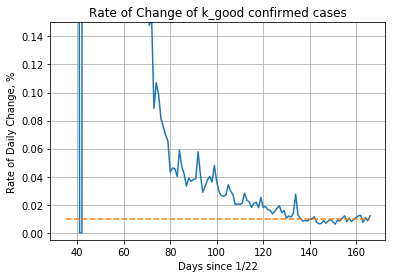

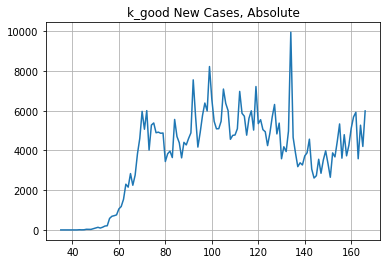


['WA', 'WY', 'MO', 'WI', 'KY', 'MS', 'GA', 'WV']


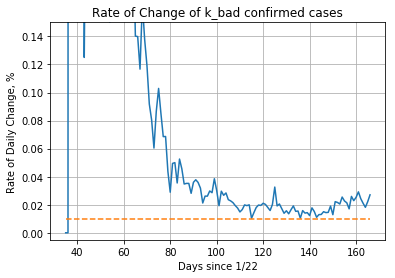

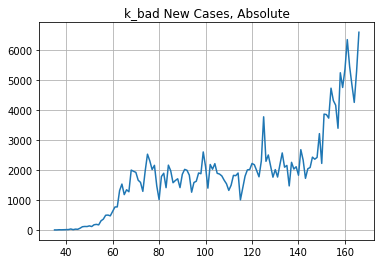

In [46]:
for i, who in enumerate(d1.keys()):
    who = d1[who]
    y = aggregate_region(who)
    new_col = [x[1].sum() for x in y.iterrows()]
    name = list(d1.keys())[i]
    df[name] = new_col
    print(who)
    create_roc_and_new_case_numbers(df[name], name)
    print()

### Categories are based on data from late June
### 'mandatory' - masks are mandatory in public areas
### 'emp_ptn' - masks are required for employees and patrons of certain businesses
### 'emp' - masks are required for employees of certain businesses
### 'none' - no mask requirements

['CA', 'NM', 'IL', 'MI', 'VA', 'MD', 'DE', 'NY', 'MA', 'RI', 'ME']


c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


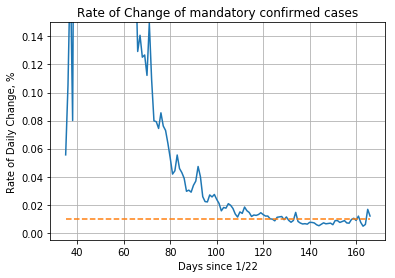

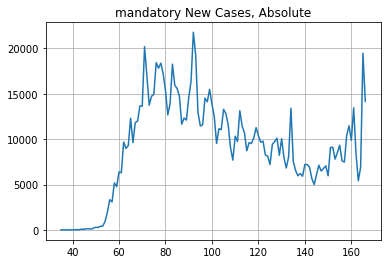


['AR', 'MS', 'TN', 'IN', 'NE', 'PA', 'NJ', 'CT', 'NH', 'WA', 'WY', 'DC']


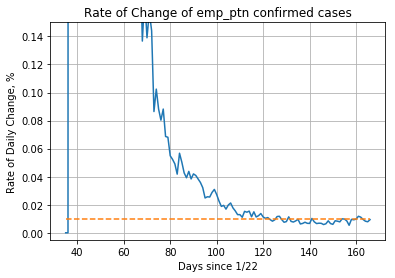

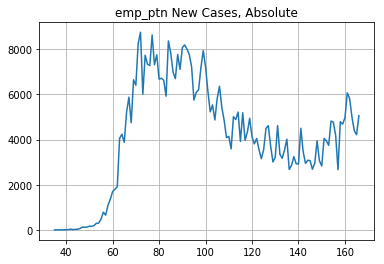


['OR', 'NV', 'CO', 'MN', 'LA', 'OH', 'KY', 'AL', 'GA', 'FL', 'VT']


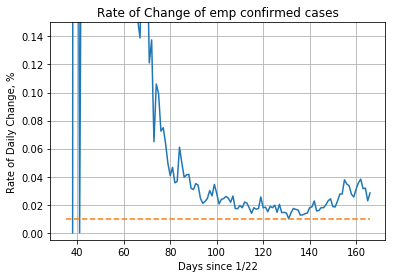

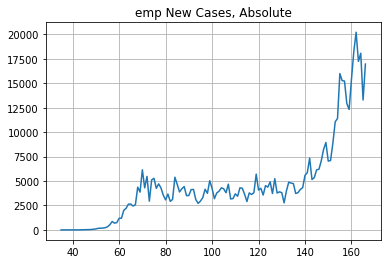


['ID', 'MT', 'UT', 'AZ', 'ND', 'SD', 'IA', 'WI', 'MO', 'KS', 'OK', 'TX', 'WV', 'NC', 'SC']


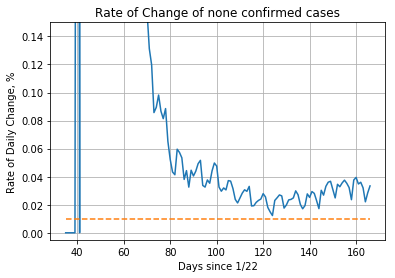

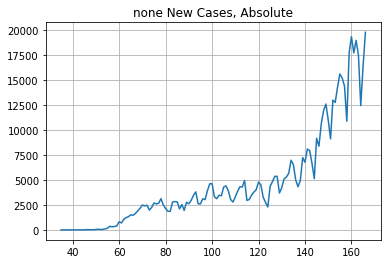

In [47]:
masks = {"mandatory": ["CA", "NM", "IL", "MI", "VA", "MD", "DE", "NY", "MA", "RI", "ME"],
    "emp_ptn": ['AR', 'MS', 'TN', 'IN', 'NE', 'PA', 'NJ', 'CT', 'NH', 'WA', 'WY', 'DC'],
    "emp": ['OR', 'NV', 'CO', 'MN', 'LA', 'OH', 'KY', 'AL', 'GA', 'FL', 'VT'],
    "none": ["ID", 'MT', 'UT', 'AZ', 'ND', 'SD', 'IA', 'WI', 'MO', 'KS', 'OK', 'TX', 'WV', 'NC', 'SC'] }

for i, who in enumerate(masks.keys()):
    who = masks[who]
    y = aggregate_region(who)
    new_col = [x[1].sum() for x in y.iterrows()]
    name = list(masks.keys())[i]
    df[name] = new_col
    print(who)
    create_roc_and_new_case_numbers(df[name], name)
    print()

In [48]:
cross_dict = {
    "good_strict": [], "bad_strict": [], "good_loose": [], "bad_loose": []
             }

for dk in d1.keys():
    for m1 in masks.keys():
        match = False
        cross_section = set(d1[dk]) & set(masks[m1])
        if dk in ['good', 'k_good'] and m1 in ['mandatory', 'emp_ptn']:
            match = True
            cross_dict['good_strict'].extend([state for state in cross_section])
        elif dk in ['bad', 'k_bad'] and m1 in ['emp', 'none']:
            match = True
            cross_dict['bad_loose'].extend([state for state in cross_section])
        elif dk == 'neutral':
            match = True
        elif dk in ['good', 'k_good']:
            cross_dict['good_loose'].extend([state for state in cross_section])
        elif dk in ['bad', 'k_bad']:
            cross_dict['bad_strict'].extend([state for state in cross_section])
        print("Intersection:", match, dk, m1, cross_section )

print()
print(cross_dict)

Intersection: True good mandatory {'RI', 'IL', 'NY', 'MA'}
Intersection: True good emp_ptn {'CT', 'NJ', 'DC', 'PA'}
Intersection: False good emp {'VT'}
Intersection: False good none set()
Intersection: False bad mandatory {'CA'}
Intersection: False bad emp_ptn {'TN', 'AR'}
Intersection: True bad emp {'NV', 'FL', 'AL', 'OR'}
Intersection: True bad none {'AZ', 'ID', 'MT', 'TX', 'UT', 'OK', 'NC', 'SC'}
Intersection: True neutral mandatory set()
Intersection: True neutral emp_ptn set()
Intersection: True neutral emp {'OH'}
Intersection: True neutral none {'KS'}
Intersection: True k_good mandatory {'MI', 'ME', 'VA', 'NM', 'DE', 'MD'}
Intersection: True k_good emp_ptn {'NE', 'NH', 'IN'}
Intersection: False k_good emp {'CO', 'MN', 'LA'}
Intersection: False k_good none {'SD', 'ND', 'IA'}
Intersection: False k_bad mandatory set()
Intersection: False k_bad emp_ptn {'MS', 'WA', 'WY'}
Intersection: True k_bad emp {'KY', 'GA'}
Intersection: True k_bad none {'WV', 'MO', 'WI'}

{'good_strict': ['RI',

In [49]:
filepath = "C:/Users/Thalo/Downloads/covid_county_population_usafacts.csv"
df3 = pd.read_csv(filepath)

df3 = df3.set_index("County Name").T
df3.drop(["countyFIPS"], inplace=True)

df3.drop("Statewide Unallocated", axis=1, inplace=True)

# df / df3
# Wade Hampton Census Area
# Grand Princess Cruise Ship
# New York City Unallocated
unpopulated = ["Wade Hampton Census Area", "Grand Princess Cruise Ship", "New York City Unallocated"]
df3.drop(unpopulated, axis=1, inplace=True)

df5 = df3.T

# southwest = ["AZ", "NM", "TX", "OK"]
# west = ["WA", "OR", "CA", "NV", "ID", "UT", "MT", "WY", "CO"]
# midwest = ["ND", "SD", "NE", "KS", "MN", "IA", "MO", "WI", "IL", "MI", "IN", "OH"]
# southeast = ["AR", "LA", "KY", "TN", "MS", "AL", "GA", "WV", "VA", "NC", "SC", "FL"]
# northeast = ["ME", "NH", "VT", "MA", "RI", "CT", "NY", "NJ", "PA", "DE", "MD", "DC"]
# state_list = [state for states in [southwest, west,midwest ,southeast ,northeast ] for state in states]

for key in cross_dict.keys():
    df5[key] = df5['State'].isin(cross_dict[key])

# df5[df5.good_loose]
state_pops = df5.groupby('State')['population'].sum()


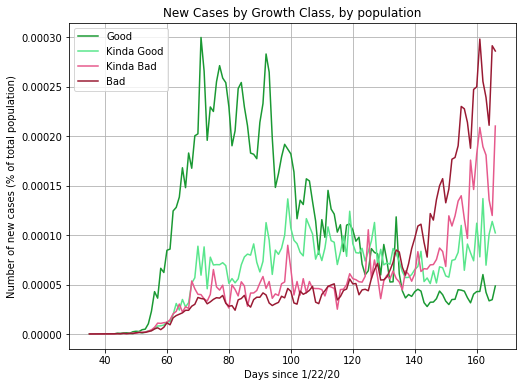

In [50]:
plt.figure(figsize=(8, 6))

# y = aggregate_region(good_states, "Good Aggregate")
# new_col = [x[1].sum() for x in y.iterrows()]
# df['bad_loose'] = new_col
create_new_case_graphs_colored(df['Good_agg'] / state_pops.loc[good_states].sum(), 'Good', (0.1, 0.6, 0.2), smoothing_factor=1)
create_new_case_graphs_colored(df['kinda_good_agg'] / state_pops.loc[kinda_good_states].sum(), 'Kinda Good', (0.35, 0.9, 0.55), smoothing_factor=1)
create_new_case_graphs_colored(df['kinda_bad_agg'] / state_pops.loc[kinda_bad_states].sum(), 'Kinda Bad', (0.9, 0.35, 0.55), smoothing_factor=1)
create_new_case_graphs_colored(df['Bad_agg'] / state_pops.loc[bad_states].sum(), 'Bad', (0.6, 0.1, 0.2), smoothing_factor=1)

plt.grid()
plt.legend(loc=2)
plt.title("New Cases by Growth Class, by population")
plt.ylabel("Number of new cases (% of total population)")
plt.xlabel("Days since 1/22/20")
plt.show()

good : ['IL', 'VT', 'MA', 'RI', 'CT', 'NY', 'NJ', 'PA', 'DC']
bad : ['AZ', 'TX', 'OK', 'OR', 'CA', 'NV', 'ID', 'UT', 'MT', 'AR', 'TN', 'AL', 'NC', 'SC', 'FL']
neutral : ['KS', 'OH']
k_good : ['NM', 'CO', 'ND', 'SD', 'NE', 'MN', 'IA', 'MI', 'IN', 'LA', 'VA', 'ME', 'NH', 'DE', 'MD']
k_bad : ['WA', 'WY', 'MO', 'WI', 'KY', 'MS', 'GA', 'WV']


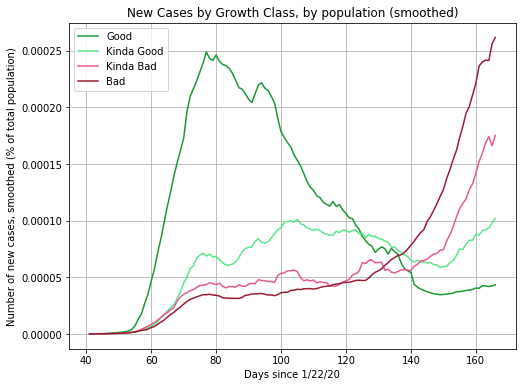

In [51]:
for class_ in states_dict:
    print(class_, ":", states_dict[class_])

plt.figure(figsize=(8, 6))

# y = aggregate_region(good_states, "Good Aggregate")
# new_col = [x[1].sum() for x in y.iterrows()]
# df['bad_loose'] = new_col
create_new_case_graphs_colored(df['Good_agg'] / state_pops.loc[good_states].sum(), 'Good', (0.1, 0.6, 0.2), smoothing_factor=7)
create_new_case_graphs_colored(df['kinda_good_agg'] / state_pops.loc[kinda_good_states].sum(), 'Kinda Good', (0.35, 0.9, 0.55), smoothing_factor=7)
create_new_case_graphs_colored(df['kinda_bad_agg'] / state_pops.loc[kinda_bad_states].sum(), 'Kinda Bad', (0.9, 0.35, 0.55), smoothing_factor=7)
create_new_case_graphs_colored(df['Bad_agg'] / state_pops.loc[bad_states].sum(), 'Bad', (0.6, 0.1, 0.2), smoothing_factor=7)

plt.grid()
plt.legend(loc=2)
plt.title("New Cases by Growth Class, by population (smoothed)")
plt.ylabel("Number of new cases, smoothed (% of total population)")
plt.xlabel("Days since 1/22/20")
plt.show()

mandatory: ['CA', 'NM', 'IL', 'MI', 'VA', 'MD', 'DE', 'NY', 'MA', 'RI', 'ME']
emp_ptn: ['AR', 'MS', 'TN', 'IN', 'NE', 'PA', 'NJ', 'CT', 'NH', 'WA', 'WY', 'DC']
emp: ['OR', 'NV', 'CO', 'MN', 'LA', 'OH', 'KY', 'AL', 'GA', 'FL', 'VT']
none: ['ID', 'MT', 'UT', 'AZ', 'ND', 'SD', 'IA', 'WI', 'MO', 'KS', 'OK', 'TX', 'WV', 'NC', 'SC']


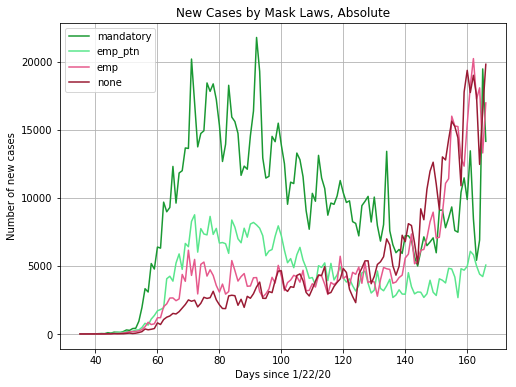

In [52]:
colors = [(0.1, 0.6, 0.2), (0.35, 0.9, 0.55), (0.9, 0.35, 0.55), (0.6, 0.1, 0.2)]

for who in masks.keys():
    print(who, masks[who], sep=": ")

plt.figure(figsize=(8, 6))
    
for i, who in enumerate(masks.keys()):
    create_new_case_graphs_colored(df[who], who, colors[i], smoothing_factor=1)
    
plt.grid()
plt.legend(loc=2)
plt.title("New Cases by Mask Laws, Absolute")
plt.ylabel("Number of new cases")
plt.xlabel("Days since 1/22/20")
plt.show()

mandatory: ['CA', 'NM', 'IL', 'MI', 'VA', 'MD', 'DE', 'NY', 'MA', 'RI', 'ME']
emp_ptn: ['AR', 'MS', 'TN', 'IN', 'NE', 'PA', 'NJ', 'CT', 'NH', 'WA', 'WY', 'DC']
emp: ['OR', 'NV', 'CO', 'MN', 'LA', 'OH', 'KY', 'AL', 'GA', 'FL', 'VT']
none: ['ID', 'MT', 'UT', 'AZ', 'ND', 'SD', 'IA', 'WI', 'MO', 'KS', 'OK', 'TX', 'WV', 'NC', 'SC']


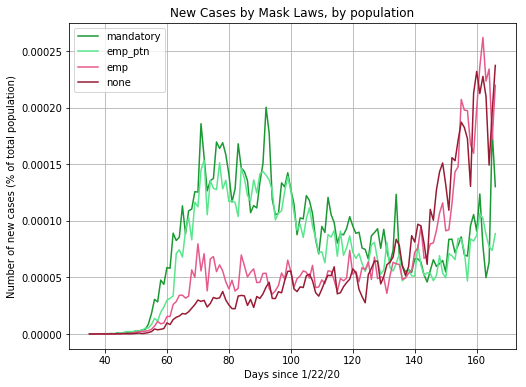

In [53]:
colors = [(0.1, 0.6, 0.2), (0.35, 0.9, 0.55), (0.9, 0.35, 0.55), (0.6, 0.1, 0.2)]

for who in masks.keys():
    print(who, masks[who], sep=": ")

plt.figure(figsize=(8, 6))
    
for i, who in enumerate(masks.keys()):
    create_new_case_graphs_colored(df[who] / state_pops.loc[masks[who]].sum(), who, colors[i], smoothing_factor=1)
    
plt.grid()
plt.legend(loc=2)
plt.title("New Cases by Mask Laws, by population")
plt.ylabel("Number of new cases (% of total population)")
plt.xlabel("Days since 1/22/20")
plt.show()

{'MI', 'ME', 'NY', 'VA', 'NM', 'DE', 'IL', 'RI', 'MA', 'MD'}


c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


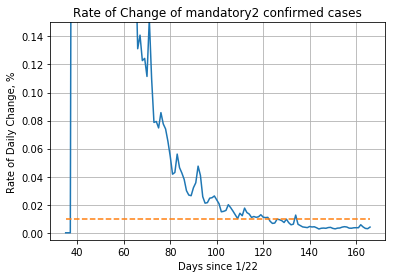

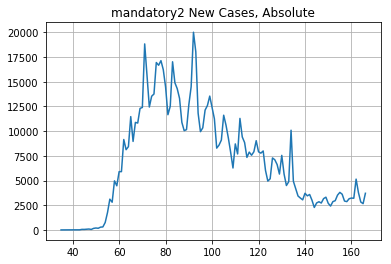


['AR', 'MS', 'TN', 'IN', 'NE', 'PA', 'NJ', 'CT', 'NH', 'WA', 'WY', 'DC']


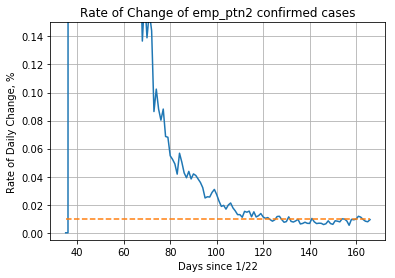

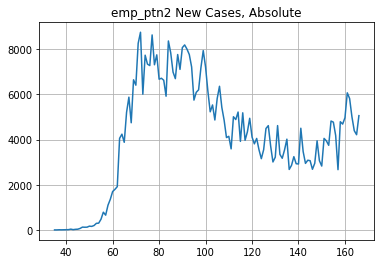


['OR', 'NV', 'CO', 'MN', 'LA', 'OH', 'KY', 'AL', 'GA', 'FL', 'VT']


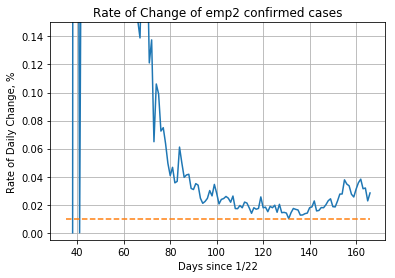

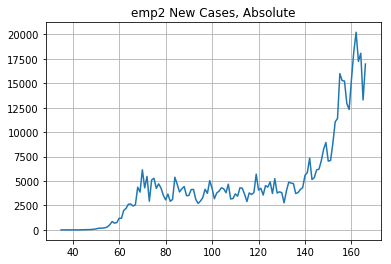


['ID', 'MT', 'UT', 'AZ', 'ND', 'SD', 'IA', 'WI', 'MO', 'KS', 'OK', 'TX', 'WV', 'NC', 'SC']


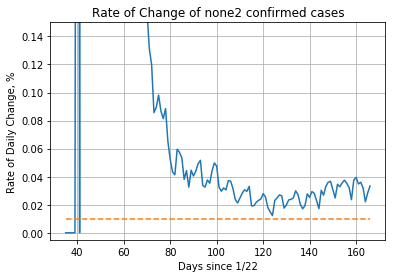

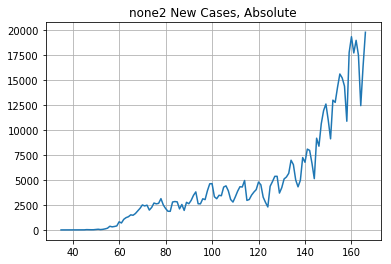


mandatory2: {'MI', 'ME', 'NY', 'VA', 'NM', 'DE', 'IL', 'RI', 'MA', 'MD'}
emp_ptn2: ['AR', 'MS', 'TN', 'IN', 'NE', 'PA', 'NJ', 'CT', 'NH', 'WA', 'WY', 'DC']
emp2: ['OR', 'NV', 'CO', 'MN', 'LA', 'OH', 'KY', 'AL', 'GA', 'FL', 'VT']
none2: ['ID', 'MT', 'UT', 'AZ', 'ND', 'SD', 'IA', 'WI', 'MO', 'KS', 'OK', 'TX', 'WV', 'NC', 'SC']
No California


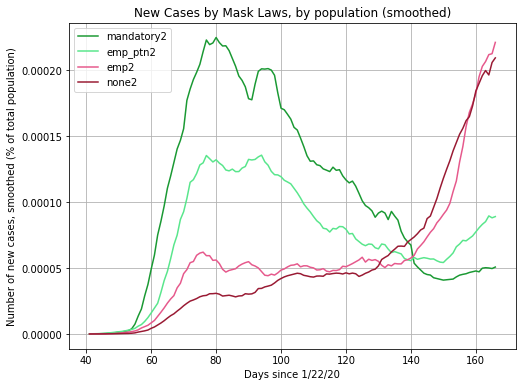

In [54]:
masks2 = {"mandatory2": set(["CA", "NM", "IL", "MI", "VA", "MD", "DE", "NY", "MA", "RI", "ME"]) - set(['CA']),
    "emp_ptn2": ['AR', 'MS', 'TN', 'IN', 'NE', 'PA', 'NJ', 'CT', 'NH', 'WA', 'WY', 'DC'],
    "emp2": ['OR', 'NV', 'CO', 'MN', 'LA', 'OH', 'KY', 'AL', 'GA', 'FL', 'VT'],
    "none2": ["ID", 'MT', 'UT', 'AZ', 'ND', 'SD', 'IA', 'WI', 'MO', 'KS', 'OK', 'TX', 'WV', 'NC', 'SC'] }

for i, who in enumerate(masks2.keys()):
    who = masks2[who]
    y = aggregate_region(who)
    new_col = [x[1].sum() for x in y.iterrows()]
    name = list(masks2.keys())[i]
    df[name] = new_col
    print(who)
    create_roc_and_new_case_numbers(df[name], name)
    print()

colors = [(0.1, 0.6, 0.2), (0.35, 0.9, 0.55), (0.9, 0.35, 0.55), (0.6, 0.1, 0.2)]

for who in masks2.keys():
    print(who, masks2[who], sep=": ")

plt.figure(figsize=(8, 6))
    
for i, who in enumerate(masks2.keys()):
    create_new_case_graphs_colored(df[who] / state_pops.loc[masks2[who]].sum(), who, colors[i], smoothing_factor=7)

plt.grid()
plt.legend(loc=2)
plt.title("New Cases by Mask Laws, by population (smoothed)")
plt.ylabel("Number of new cases, smoothed (% of total population)")
plt.xlabel("Days since 1/22/20")

print("No California")
plt.show()

mandatory: ['CA', 'NM', 'IL', 'MI', 'VA', 'MD', 'DE', 'NY', 'MA', 'RI', 'ME']
emp_ptn: ['AR', 'MS', 'TN', 'IN', 'NE', 'PA', 'NJ', 'CT', 'NH', 'WA', 'WY', 'DC']
emp: ['OR', 'NV', 'CO', 'MN', 'LA', 'OH', 'KY', 'AL', 'GA', 'FL', 'VT']
none: ['ID', 'MT', 'UT', 'AZ', 'ND', 'SD', 'IA', 'WI', 'MO', 'KS', 'OK', 'TX', 'WV', 'NC', 'SC']


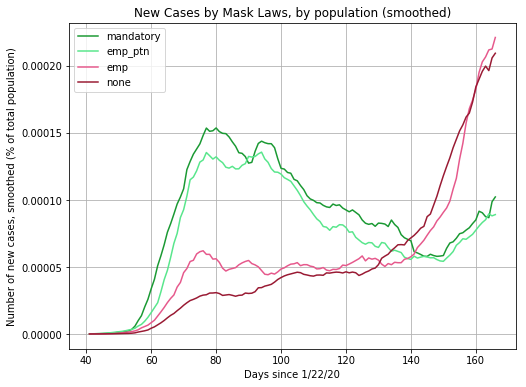

In [55]:
colors = [(0.1, 0.6, 0.2), (0.35, 0.9, 0.55), (0.9, 0.35, 0.55), (0.6, 0.1, 0.2)]

for who in masks.keys():
    print(who, masks[who], sep=": ")

plt.figure(figsize=(8, 6))
    
for i, who in enumerate(masks.keys()):
    create_new_case_graphs_colored(df[who] / state_pops.loc[masks[who]].sum(), who, colors[i], smoothing_factor=7)
    
plt.grid()
plt.legend(loc=2)
plt.title("New Cases by Mask Laws, by population (smoothed)")
plt.ylabel("Number of new cases, smoothed (% of total population)")
plt.xlabel("Days since 1/22/20")
plt.show()

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


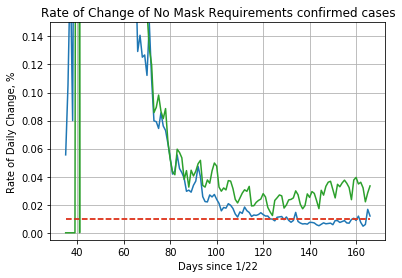

In [56]:
create_roc_graphs(df['mandatory'], 'Mandatory Masks')
create_roc_graphs(df['none'], 'No Mask Requirements')
plt.grid()

good_strict ['RI', 'IL', 'NY', 'MA', 'CT', 'NJ', 'DC', 'PA', 'MI', 'ME', 'VA', 'NM', 'DE', 'MD', 'NE', 'NH', 'IN']
bad_strict ['CA', 'TN', 'AR', 'MS', 'WA', 'WY']
good_loose ['VT', 'CO', 'MN', 'LA', 'SD', 'ND', 'IA']
bad_loose ['NV', 'FL', 'AL', 'OR', 'AZ', 'ID', 'MT', 'TX', 'UT', 'OK', 'NC', 'SC', 'KY', 'GA', 'WV', 'MO', 'WI']


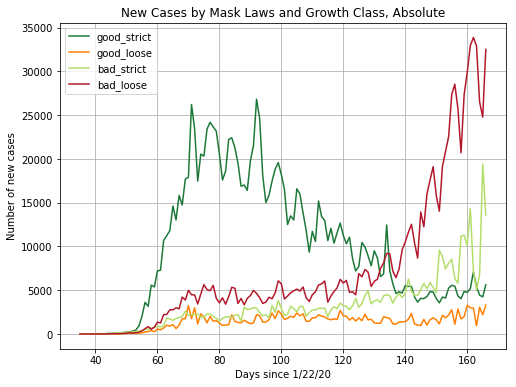

In [57]:
for who in cross_dict.keys():
    print(who, cross_dict[who])


plt.figure(figsize=(8, 6))
    
y = aggregate_region(cross_dict['good_strict'])
new_col = [x[1].sum() for x in y.iterrows()]
df['good_strict'] = new_col
create_new_case_graphs_colored(df['good_strict'], 'good_strict', (0.11, 0.47, 0.22), smoothing_factor=1)

y = aggregate_region(cross_dict['good_loose'])
new_col = [x[1].sum() for x in y.iterrows()]
df['good_loose'] = new_col
create_new_case_graphs_colored(df['good_loose'], 'good_loose', (1.0, 0.5, 0.0), smoothing_factor=1)

y = aggregate_region(cross_dict['bad_strict'])
new_col = [x[1].sum() for x in y.iterrows()]
df['bad_strict'] = new_col
create_new_case_graphs_colored(df['bad_strict'], 'bad_strict', (0.7, 0.87, 0.41), smoothing_factor=1)

y = aggregate_region(cross_dict['bad_loose'])
new_col = [x[1].sum() for x in y.iterrows()]
df['bad_loose'] = new_col
create_new_case_graphs_colored(df['bad_loose'], 'bad_loose', (0.7, 0.09, 0.17), smoothing_factor=1)

plt.grid()
plt.legend(loc=2)
plt.title("New Cases by Mask Laws and Growth Class, Absolute")
plt.ylabel("Number of new cases")
plt.xlabel("Days since 1/22/20")
plt.show()

good_strict ['RI', 'IL', 'NY', 'MA', 'CT', 'NJ', 'DC', 'PA', 'MI', 'ME', 'VA', 'NM', 'DE', 'MD', 'NE', 'NH', 'IN']
bad_strict ['CA', 'TN', 'AR', 'MS', 'WA', 'WY']
good_loose ['VT', 'CO', 'MN', 'LA', 'SD', 'ND', 'IA']
bad_loose ['NV', 'FL', 'AL', 'OR', 'AZ', 'ID', 'MT', 'TX', 'UT', 'OK', 'NC', 'SC', 'KY', 'GA', 'WV', 'MO', 'WI']


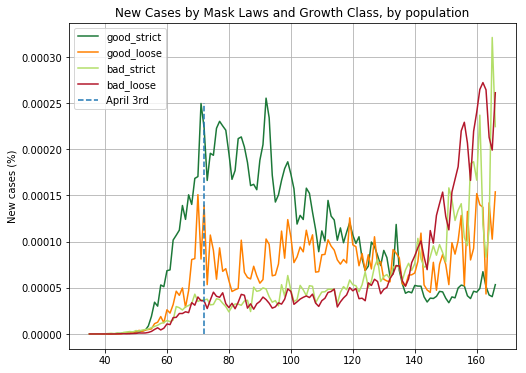

In [58]:
for who in cross_dict.keys():
    print(who, cross_dict[who])

    
state_pops.loc[cross_dict['good_strict']].sum()

plt.figure(figsize=(8, 6))
    
y = aggregate_region(cross_dict['good_strict'])
new_col = [x[1].sum() / state_pops.loc[cross_dict['good_strict']].sum() for x in y.iterrows()]
df['good_strict'] = new_col
create_new_case_graphs_colored(df['good_strict'], 'good_strict', (0.11, 0.47, 0.22), smoothing_factor=1)

y = aggregate_region(cross_dict['good_loose'])
new_col = [x[1].sum() / state_pops.loc[cross_dict['good_loose']].sum() for x in y.iterrows()]
df['good_loose'] = new_col
create_new_case_graphs_colored(df['good_loose'], 'good_loose', (1.0, 0.5, 0.0), smoothing_factor=1)

y = aggregate_region(cross_dict['bad_strict'])
new_col = [x[1].sum() / state_pops.loc[cross_dict['bad_strict']].sum() for x in y.iterrows()]
df['bad_strict'] = new_col
create_new_case_graphs_colored(df['bad_strict'], 'bad_strict', (0.7, 0.87, 0.41), smoothing_factor=1)

y = aggregate_region(cross_dict['bad_loose'])
new_col = [x[1].sum() / state_pops.loc[cross_dict['bad_loose']].sum() for x in y.iterrows()]
df['bad_loose'] = new_col
create_new_case_graphs_colored(df['bad_loose'], 'bad_loose', (0.7, 0.09, 0.17), smoothing_factor=1)

plt.grid()
plt.title("New Cases by Mask Laws and Growth Class, by population")
plt.ylabel("Number of new cases")
plt.ylabel("New cases (%)")
plt.plot([np.where(df.index == '4/3/20')[0][0], np.where(df.index == '4/3/20')[0][0]], [0, 0.00025], \
         linestyle='dashed', label="April 3rd")
plt.legend(loc=2)


good_strict ['RI', 'IL', 'NY', 'MA', 'CT', 'NJ', 'DC', 'PA', 'MI', 'ME', 'VA', 'NM', 'DE', 'MD', 'NE', 'NH', 'IN']
bad_strict ['CA', 'TN', 'AR', 'MS', 'WA', 'WY']
good_loose ['VT', 'CO', 'MN', 'LA', 'SD', 'ND', 'IA']
bad_loose ['NV', 'FL', 'AL', 'OR', 'AZ', 'ID', 'MT', 'TX', 'UT', 'OK', 'NC', 'SC', 'KY', 'GA', 'WV', 'MO', 'WI']


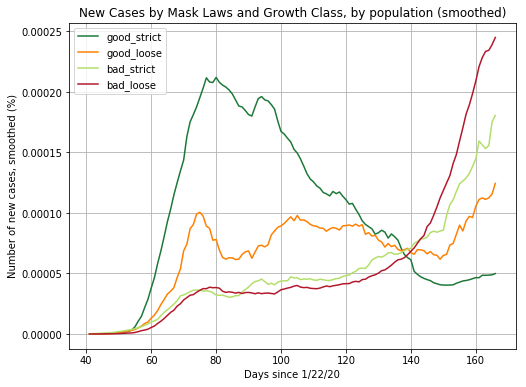

In [59]:
for who in cross_dict.keys():
    print(who, cross_dict[who])


plt.figure(figsize=(8, 6))
    
y = aggregate_region(cross_dict['good_strict'])
new_col = [x[1].sum() for x in y.iterrows()]
df['good_strict'] = new_col
create_new_case_graphs_colored(df['good_strict'] / state_pops.loc[cross_dict['good_strict']].sum(), 'good_strict', (0.11, 0.47, 0.22))

y = aggregate_region(cross_dict['good_loose'])
new_col = [x[1].sum() for x in y.iterrows()]
df['good_loose'] = new_col
create_new_case_graphs_colored(df['good_loose'] / state_pops.loc[cross_dict['good_loose']].sum(), 'good_loose', (1.0, 0.5, 0.0))

y = aggregate_region(cross_dict['bad_strict'])
new_col = [x[1].sum() for x in y.iterrows()]
df['bad_strict'] = new_col
create_new_case_graphs_colored(df['bad_strict'] / state_pops.loc[cross_dict['bad_strict']].sum(), 'bad_strict', (0.7, 0.87, 0.41))

y = aggregate_region(cross_dict['bad_loose'])
new_col = [x[1].sum() for x in y.iterrows()]
df['bad_loose'] = new_col
create_new_case_graphs_colored(df['bad_loose'] / state_pops.loc[cross_dict['bad_loose']].sum(), 'bad_loose', (0.7, 0.09, 0.17))

plt.grid()
plt.legend(loc=2)
plt.title("New Cases by Mask Laws and Growth Class, by population (smoothed)")
plt.ylabel("Number of new cases, smoothed (%)")
plt.xlabel("Days since 1/22/20")
plt.show()

## Recreate graphs based on population

In [60]:
filepath = "C:/Users/Thalo/Downloads/covid_county_population_usafacts.csv"
df3 = pd.read_csv(filepath)

df3 = df3.set_index("County Name").T
df3.drop(["countyFIPS"], inplace=True)

df3.drop("Statewide Unallocated", axis=1, inplace=True)

# df / df3
# Wade Hampton Census Area
# Grand Princess Cruise Ship
# New York City Unallocated
unpopulated = ["Wade Hampton Census Area", "Grand Princess Cruise Ship", "New York City Unallocated"]
df3.drop(unpopulated, axis=1, inplace=True)

df5 = df3.T
for key in cross_dict.keys():
    df5[key] = df5['State'].isin(cross_dict[key])

# df5[df5.good_loose]
state_pops = df5.groupby('State')['population'].sum()


good ['IL', 'VT', 'MA', 'RI', 'CT', 'NY', 'NJ', 'PA', 'DC']
bad ['AZ', 'TX', 'OK', 'OR', 'CA', 'NV', 'ID', 'UT', 'MT', 'AR', 'TN', 'AL', 'NC', 'SC', 'FL']
neutral ['KS', 'OH']
k_good ['NM', 'CO', 'ND', 'SD', 'NE', 'MN', 'IA', 'MI', 'IN', 'LA', 'VA', 'ME', 'NH', 'DE', 'MD']
k_bad ['WA', 'WY', 'MO', 'WI', 'KY', 'MS', 'GA', 'WV']



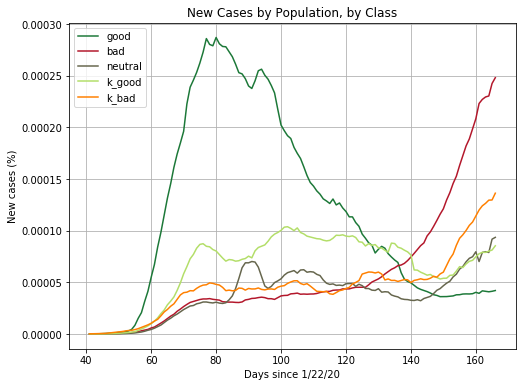

In [61]:
color_list = [(0.11, 0.47, 0.22), (0.7, 0.09, 0.17), (0.4, 0.4, 0.3), (0.7, 0.87, 0.41), (1.0, 0.5, 0.0)]
plt.figure(figsize=(8, 6))

for i, who in enumerate(d1.keys()):
    who = d1[who]
    y = aggregate_region(who)
    new_col = [x[1].sum() / state_pops.loc[who].sum() for x in y.iterrows()]
    name = list(d1.keys())[i]
    df[name] = new_col
    print(name, who)
    create_new_case_graphs_colored(df[name], name, color_list[i])
print()



# plt.grid()
plt.title("New Cases by Population, by Class")
plt.xlabel("Days since 1/22/20")
plt.ylabel("New cases (%)")
# plt.plot([np.where(df.index == '4/3/2020')[0][0], np.where(df.index == '4/3/2020')[0][0]], [0, 0.00025], \
#          linestyle='dashed', label="April 3rd")
plt.legend(loc=2)


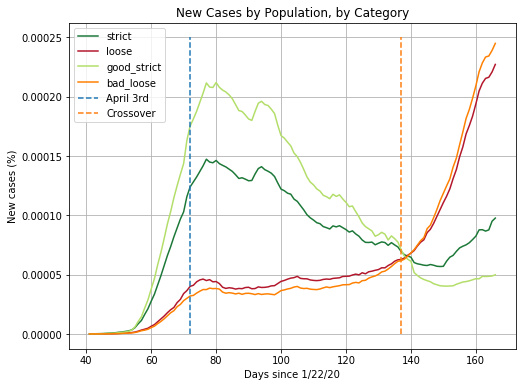

In [62]:
state_pops.loc[cross_dict['good_strict']].sum()

plt.figure(figsize=(8, 6))
    
y = aggregate_region(cross_dict['good_strict'] + cross_dict['bad_strict'])
new_col = [x[1].sum() / state_pops.loc[cross_dict['good_strict'] + cross_dict['bad_strict']].sum() for x in y.iterrows()]
df['strict'] = new_col
create_new_case_graphs_colored(df['strict'], 'strict', (0.11, 0.47, 0.22))

y = aggregate_region(cross_dict['bad_loose'] + cross_dict['good_loose'])
new_col = [x[1].sum() / state_pops.loc[cross_dict['bad_loose'] + cross_dict['good_loose']].sum() for x in y.iterrows()]
df['loose'] = new_col
create_new_case_graphs_colored(df['loose'], 'loose', (0.7, 0.09, 0.17))

y = aggregate_region(cross_dict['good_strict'])
new_col = [x[1].sum() / state_pops.loc[cross_dict['good_strict']].sum() for x in y.iterrows()]
df['good_strict'] = new_col
create_new_case_graphs_colored(df['good_strict'], 'good_strict', (0.7, 0.87, 0.41))

y = aggregate_region(cross_dict['bad_loose'])
new_col = [x[1].sum() / state_pops.loc[cross_dict['bad_loose']].sum() for x in y.iterrows()]
df['bad_loose'] = new_col
create_new_case_graphs_colored(df['bad_loose'], 'bad_loose', (1.0, 0.5, 0.0))


plt.grid()
plt.title("New Cases by Population, by Category")
plt.xlabel("Days since 1/22/20")
plt.ylabel("New cases (%)")
plt.plot([np.where(df.index == '4/3/20')[0][0], np.where(df.index == '4/3/20')[0][0]], [0, 0.00025], \
         linestyle='dashed', label="April 3rd")
plt.plot([np.where(df.index == '6/7/20')[0][0], np.where(df.index == '6/7/20')[0][0]], [0, 0.00025], \
         linestyle='dashed', label="Crossover")

plt.legend(loc=2)


## Detect Today's Record Highs

In [77]:
for state in state_list:
    y = aggregate_region([state])
    new_col = [x[1].sum() for x in y.iterrows()]
    new_cases = np.array(new_col[1:]) - np.array(new_col[:-1])
    if new_cases.argmax() == new_cases.size - 1:
        print("A new record for {}!".format(state), new_cases.max(), np.percentile(new_cases, 99))

A new record for TX! 10030 8149.820000000001
A new record for OK! 861 581.36
A new record for ID! 487 412.2000000000001
A new record for MO! 808 660.4200000000004


In [63]:
state_col2 = state_col.copy()
state_col2 = state_col2[state_col2.index != "Statewide Unallocated"]
state_col2 = state_col2[state_col2.index != "New York City Unallocated/Probable"]
state_col2 = state_col2[state_col2.index != "Grand Princess Cruise Ship"]


In [64]:
### Find intersection of strict states and loose states

strict = df['strict'].values[1:] - df['strict'].values[:-1]
loose = df['loose'].values[1:] - df['loose'].values[:-1]

# print(strict)
# print()
# print(loose)

df.iloc[ (strict < loose).argmax() ]
(strict < loose).argmax()

# new_col = [x[1].sum() / state_pops.loc[cross_dict['good_strict'] + cross_dict['bad_strict']].sum() for x in y.iterrows()]
# df['strict'] = new_col
# create_new_case_graphs_colored(df['strict'], 'strict', (0.11, 0.47, 0.22))

# y = aggregate_region(cross_dict['bad_loose'] + cross_dict['good_loose'])
# new_col = [x[1].sum() / state_pops.loc[cross_dict['bad_loose'] + cross_dict['good_loose']].sum() for x in y.iterrows()]


133